In [ ]:
#https://www.kaggle.com/code/ambarish/eda-home-mortgage-ny-with-feature-analysis
#https://www.kaggle.com/code/anmontoy/eda-home-mortgage-ny-with-feature-analysis-c5008d/edit
#https://github.com/vashistak/HMDA-Analysis/blob/master/HMDA_Data_Challenge_vashista_koralla.pdf
#https://www.kaggle.com/code/derevirn/predicting-mortgage-approvals-with-xgboost/notebook#Ethical-Concerns-And-Conclusion
#https://www.kaggle.com/datasets/miker400/washington-state-home-mortgage-hdma2016/code
#https://www.kaggle.com/datasets/miker400/washington-state-home-mortgage-hdma2016/code
#https://www.kaggle.com/code/kuleafenujoachim/mortgage-loan-eligibility-prediction/input
#https://www.kaggle.com/code/kuleafenujoachim/mortgage-loan-eligibility-prediction
#https://www.kaggle.com/code/pcharambira/washington-state-home-loans-analysis#conclusions
#EDA: https://www.fiddler.ai/blog/identifying-bias-sensitive-attribute-data-home-mortgage-disclosure-act"

#Modelos
#https://github.com/OceansStill/HMDA-EnsembleLearning/blob/main/HDMA.ipynb
#https://github.com/ranjinir25/HMDA-Bias-Data/blob/master/StatDataMiningProject.ipynb
##https://github.com/ranjinir25/HMDA-Bias-Data/blob/master/StatDataMiningProject.ipynb
#https://github.com/mattcolantonio/HMDA/blob/main/code/models_v01.py

#EDA
#https://github.com/moritzsanne/hmda_eda/blob/main/HMDA_NY_EDA.ipynb

#La del chicuadrado
#https://www.kaggle.com/code/pcharambira/washington-state-home-loans-analysis#correlations

#Codigo Guia
#https://q-shick.github.io/portfolio/proj_hmda.html

# CARGA DE LIBRERIAS

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_theme(style="darkgrid", palette="pastel")
sns.set(rc={'figure.figsize':(10,10)})
from scipy.stats import ttest_ind

# CARGA DE INFORMACION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#INTRODUCCION BASE DE DATOS HMDA

La Ley de Divulgación de Hipotecas de Vivienda (HMDA, por sus siglas en inglés) requiere que muchas instituciones financieras mantengan, informen y divulguen públicamente información sobre hipotecas. Este conjunto de datos cubre todas las decisiones hipotecarias tomadas en 2018-2019.
La fuente original requirió trabajao previo (detallado en trabajo). Aca tenemos una seleccion aleotoria de 1 millon de solicitudes (esto por capacidad de procesamiento).

Cada año, miles de bancos y otras instituciones financieras reportan datos sobre hipotecas al público, gracias a la Ley de Divulgación de Hipotecas de Viviendas, o "HMDA" para abreviar. Estos datos públicos son importantes porque:                 

* Ayudar a demostrar si los prestamistas están atendiendo las necesidades de vivienda de sus comunidades;              
* Proporcionar a los funcionarios públicos información que les ayude a tomar decisiones y políticas; y           
* Arrojar luz sobre los patrones de préstamos que podrían ser discriminatorios

In [ ]:
import pandas as pd

# Reemplaza la ruta con la ubicación de tu archivo Stata (.dta)
file_path = "/content/drive/MyDrive/Proyecto Grado/HDMA/Version Final/LAR_18_19_Muestra.dta"

# Cargar el archivo Stata en un DataFrame
homeMortgage = pd.read_stata(file_path)


# CREACION ALGUNAS MARCAS - ACTION TAKEN2 Y GRUPO PROTEGIDO

Se crean algunas variables para facilitar el EDA
-Se crea action_taken2 y action_taken3
-Se crean 6 marcaciones de grupos protegidos y no protegidos con base a Sexo,Edad, Etnia y Raza

In [ ]:

# Convertir valores de action_taken2 a minúsculas
homeMortgage['action_taken2'] = homeMortgage['action_taken2'].str.lower()

# Mapeo de los valores de action_taken2 a los valores correspondientes en action_taken3
mapping = {
    'aprobado': 'Otorgado',
    'negado': 'No Otorgado',
    'no finalizado': 'No Otorgado'
}

# Crear la nueva columna action_taken3 basada en los valores de action_taken2
homeMortgage['action_taken3'] = homeMortgage['action_taken2'].replace(mapping)


In [ ]:
# Convertir valores a cadenas y guardar los originales en nuevas columnas
columns_to_check = ['protegido_edad', 'no_protegido_edad', 'protegido_mujer', 'no_protegido_hombre', 'protegido_raza', 'no_protegido_raza']

for column in columns_to_check:
    # Crear una nueva columna con el nombre original + '_antes_conversion'
    homeMortgage[column + '_antes_conversion'] = homeMortgage[column]
    # Convertir los valores a numéricos
    homeMortgage[column] = pd.to_numeric(homeMortgage[column], errors='coerce')

import numpy as np

# Crear la nueva columna 'poblacion_protegida' basada en las condiciones
homeMortgage['poblacion_protegida'] = np.where(
    (homeMortgage['protegido_edad'] == 1) |
    (homeMortgage['protegido_mujer'] == 1) |
    (homeMortgage['protegido_raza'] == 1),
    1,  # Si alguna de las condiciones se cumple, asigna 1
    np.where(
        (homeMortgage['no_protegido_edad'] == 1) |
        (homeMortgage['no_protegido_hombre'] == 1) |
        (homeMortgage['no_protegido_raza'] == 1),
        0,  # Si alguna de las condiciones se cumple, asigna 0
        np.nan  # Si ninguna de las condiciones se cumple, asigna NaN por defecto
    )
)

# Crear una nueva columna 'poblacion_protegida_nueva' basada en las condiciones
homeMortgage['poblacion_protegida_nueva'] = np.where(
    (homeMortgage['protegido_edad'] == 1) |
    (homeMortgage['protegido_mujer'] == 1) |
    (homeMortgage['protegido_raza'] == 1),
    1,  # Si alguna de las condiciones se cumple, asigna 1
    np.where(
        (homeMortgage['no_protegido_edad'] == 1) |
        (homeMortgage['no_protegido_hombre'] == 1) |
        (homeMortgage['no_protegido_raza'] == 1),
        0,  # Si alguna de las condiciones se cumple, asigna 0
        np.nan  # Si ninguna de las condiciones se cumple, asigna NaN por defecto
    )
)


In [ ]:
homeMortgage

,activity_year,lei,state_code,county_code,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,...,no_protegido_raza,action_taken3,protegido_edad_antes_conversion,no_protegido_edad_antes_conversion,protegido_mujer_antes_conversion,no_protegido_hombre_antes_conversion,protegido_raza_antes_conversion,no_protegido_raza_antes_conversion,poblacion_protegida,poblacion_protegida_nueva
0,2019,2549009IIR21WKPEE762,AL,01073,application denied,not applicable,0,conventional,refinancing,1,...,0,No Otorgado,0,1,1,0,1,0,1.0,1.0
1,2019,549300EWYXV06QXJH078,MI,26145,loan originated,not applicable,0,conventional,cash-out refinancing,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
2,2018,549300TKFZR4QBNE5D40,KY,21065,loan originated,"credit union, mortgage company, finance company",0,federal housing administration insured,cash-out refinancing,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
3,2019,549300YOESI1GLKRL151,VA,51760,loan originated,private securitizer,0,conventional,home purchase,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
4,2019,254900R7YE9RG1CL6U13,AL,01089,application withdrawn by applicant,not applicable,0,conventional,refinancing,1,...,1,No Otorgado,1,0,0,1,0,1,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,2019,KB1H1DSPRFMYMCUFXT09,CA,06037,loan originated,not applicable,0,conventional,home improvement,0,...,0,Otorgado,0,1,1,0,0,0,1.0,1.0
999996,2019,549300SJTLYB6ZWKPR88,NC,37023,loan originated,"credit union, mortgage company, finance company",0,conventional,home purchase,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
999997,2018,549300L9MOPDT0NKE883,MO,29037,loan originated,other type of purchaser,0,conventional,cash-out refinancing,1,...,1,Otorgado,0,1,1,0,0,1,1.0,1.0
999998,2019,5493001GDRY0EL7VG372,NC,37183,loan originated,not applicable,0,federal housing administration insured,home purchase,1,...,1,Otorgado,0,1,1,0,0,1,1.0,1.0


In [ ]:
#{-2.0: 'Protegido', 3.000004: 'No Protegido' Se transforma a 1}
print(homeMortgage['poblacion_protegida'].value_counts())


1.0    531022
0.0    468978
Name: poblacion_protegida, dtype: int64


In [ ]:
#{-2.0: 'Protegido', 3.000004: 'No Protegido' Se transforma a 1}
print(homeMortgage['poblacion_protegida_nueva'].value_counts())

1.0    531022
0.0    468978
Name: poblacion_protegida_nueva, dtype: int64


-POBLACION PROTEGIDA: TIENE AL MENOS UNA CARACTERISTICA PROTEGIDA (1) -POBLACION NO PROTEGIDA: NO NOTIENE NINGUAN CARACTERISTICA PROTEGIDA (0)

In [ ]:
print("Valores únicos en protegido_edad:", homeMortgage['protegido_edad'].unique())
print("Valores únicos en no_protegido_edad:", homeMortgage['protegido_edad'].unique())
print("Valores únicos en protegido_mujer:", homeMortgage['protegido_mujer'].unique())
print("Valores únicos en no_protegido_hombre:", homeMortgage['protegido_mujer'].unique())
print("Valores únicos en protegido_raza:", homeMortgage['protegido_raza'].unique())
print("Valores únicos en no_protegido_raza:", homeMortgage['protegido_raza'].unique())


Valores únicos en protegido_edad: [0 1]
Valores únicos en no_protegido_edad: [0 1]
Valores únicos en protegido_mujer: [1 0]
Valores únicos en no_protegido_hombre: [1 0]
Valores únicos en protegido_raza: [1 0]
Valores únicos en no_protegido_raza: [1 0]


-POBLACION PROTEGIDA: SI (1)
-POBLACION NO PROTEGIDA: NO (0)

# ANALISIS EXPLORATORIO DE DATOS

DATA SET ORIGINAL: SELECCION ALEATORIO 1 MILLON DE MUESTRAS

In [ ]:
homeMortgage

,activity_year,lei,state_code,county_code,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,...,no_protegido_raza,action_taken3,protegido_edad_antes_conversion,no_protegido_edad_antes_conversion,protegido_mujer_antes_conversion,no_protegido_hombre_antes_conversion,protegido_raza_antes_conversion,no_protegido_raza_antes_conversion,poblacion_protegida,poblacion_protegida_nueva
0,2019,2549009IIR21WKPEE762,AL,01073,application denied,not applicable,0,conventional,refinancing,1,...,0,No Otorgado,0,1,1,0,1,0,1.0,1.0
1,2019,549300EWYXV06QXJH078,MI,26145,loan originated,not applicable,0,conventional,cash-out refinancing,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
2,2018,549300TKFZR4QBNE5D40,KY,21065,loan originated,"credit union, mortgage company, finance company",0,federal housing administration insured,cash-out refinancing,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
3,2019,549300YOESI1GLKRL151,VA,51760,loan originated,private securitizer,0,conventional,home purchase,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
4,2019,254900R7YE9RG1CL6U13,AL,01089,application withdrawn by applicant,not applicable,0,conventional,refinancing,1,...,1,No Otorgado,1,0,0,1,0,1,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,2019,KB1H1DSPRFMYMCUFXT09,CA,06037,loan originated,not applicable,0,conventional,home improvement,0,...,0,Otorgado,0,1,1,0,0,0,1.0,1.0
999996,2019,549300SJTLYB6ZWKPR88,NC,37023,loan originated,"credit union, mortgage company, finance company",0,conventional,home purchase,1,...,1,Otorgado,0,1,0,1,0,1,0.0,0.0
999997,2018,549300L9MOPDT0NKE883,MO,29037,loan originated,other type of purchaser,0,conventional,cash-out refinancing,1,...,1,Otorgado,0,1,1,0,0,1,1.0,1.0
999998,2019,5493001GDRY0EL7VG372,NC,37183,loan originated,not applicable,0,federal housing administration insured,home purchase,1,...,1,Otorgado,0,1,1,0,0,1,1.0,1.0


# VARIABLES DEL DATA SET

In [ ]:
column_names = homeMortgage.columns

# Nombres de las columnas
print(column_names)

Index(['activity_year', 'lei', 'state_code', 'county_code', 'action_taken',
       'purchaser_type', 'preapproval', 'loan_type', 'loan_purpose',
       'lien_status', 'reverse_mortgage', 'open_end_line_of_credit',
       'business_or_commercial_purpose', 'loan_amount',
       'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread',
       'hoepa_status', 'total_loan_costs', 'total_points_and_fees',
       'origination_charges', 'discount_points', 'lender_credits', 'loan_term',
       'prepayment_penalty_term', 'intro_rate_period', 'negative_amortization',
       'interest_only_payment', 'balloon_payment',
       'other_nonamortizing_features', 'property_value', 'construction_method',
       'occupancy_type', 'manufactured_home_secured_proper',
       'manufactured_home_land_property_', 'multifamily_affordable_units',
       'income', 'applicant_credit_score_type', 'applicant_ethnicity_1',
       'applicant_race_1', 'applicant_sex', 'submission_of_application',
       'initially_

In [ ]:
# Información sobre tipos de datos y valores nulos
print(homeMortgage.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 0 to 999999
Data columns (total 70 columns):
 #   Column                                Non-Null Count    Dtype   
---  ------                                --------------    -----   
 0   activity_year                         1000000 non-null  int16   
 1   lei                                   1000000 non-null  object  
 2   state_code                            1000000 non-null  object  
 3   county_code                           1000000 non-null  object  
 4   action_taken                          1000000 non-null  category
 5   purchaser_type                        1000000 non-null  category
 6   preapproval                           1000000 non-null  int8    
 7   loan_type                             1000000 non-null  category
 8   loan_purpose                          1000000 non-null  category
 9   lien_status                           1000000 non-null  int8    
 10  reverse_mortgage                      97397

In [ ]:
# Ver los primeros 5 registros de las columnas específicas
print(homeMortgage[['protegido_edad', 'no_protegido_edad',
                   'protegido_mujer', 'no_protegido_hombre',
                   'protegido_raza', 'no_protegido_raza',
                   'poblacion_protegida']].head())


   protegido_edad  no_protegido_edad  protegido_mujer  no_protegido_hombre  \
0               0                  1                1                    0   
1               0                  1                0                    1   
2               0                  1                0                    1   
3               0                  1                0                    1   
4               1                  0                0                    1   

   protegido_raza  no_protegido_raza  poblacion_protegida  
0               1                  0                  1.0  
1               0                  1                  0.0  
2               0                  1                  0.0  
3               0                  1                  0.0  
4               0                  1                  1.0  


In [ ]:
# Ver los primeros 5 registros de la columna 'applicant_race_1'
print(homeMortgage['applicant_race_1'].head())


0    negro/afroamericano
1                 blanco
2                 blanco
3                 blanco
4                 blanco
Name: applicant_race_1, dtype: category
Categories (18, object): ['nativo americano/alaska' < 'asiatico' < 'negro/afroamericano' <
                          'hawaiano/isleno del pacifico' ... 'hawaiano' < 'guameno o chamorro' < 'samoan' <
                          'otro isleno del pacifico']


In [ ]:
# Ver los primeros 5 registros de la columna 'applicant_race_1'
print(homeMortgage['applicant_sex'].head())

0     mujer
1    hombre
2    hombre
3    hombre
4    hombre
Name: applicant_sex, dtype: category
Categories (3, object): ['hombre' < 'mujer' < 'selecciono ambas opciones']


In [ ]:
# Ver los primeros 5 registros de la columna 'applicant_race_1'
print(homeMortgage['applicant_age'].head())

0    45-54
1    35-44
2    45-54
3    35-44
4    65-74
Name: applicant_age, dtype: category
Categories (8, object): ['<25' < '25-34' < '35-44' < '45-54' < '55-64' < '65-74' < '>74' < 'sin info']


# VARIABLES NUMERICAS

In [ ]:
# Variables que quieres incluir en el resumen estadístico
variables_interes = ['preapproval', 'income', 'loan_amount', 'applicant_age','combined_loan_to_value_ratio','interest_rate']

# Resumen estadístico del subconjunto de variables seleccionadas
print(homeMortgage[variables_interes].describe())


          preapproval         income   loan_amount  \
count  1000000.000000  957551.000000  1.000000e+06   
mean         0.030950     148.064299  2.342582e+05   
std          0.173182    3000.849010  1.060060e+06   
min          0.000000  -17177.000000  5.000000e+03   
25%          0.000000      53.000000  1.050000e+05   
50%          0.000000      83.000000  1.850000e+05   
75%          0.000000     130.000000  2.950000e+05   
max          1.000000  856593.000000  6.396050e+08   

       combined_loan_to_value_ratio  interest_rate  
count                  7.015850e+05  628255.000000  
mean                   2.053945e+04       4.721540  
std                    6.517014e+06      24.879548  
min                    2.500000e-02       0.000000  
25%                    6.700000e+01       3.900000  
50%                    8.000000e+01       4.500000  
75%                    9.500000e+01       5.000000  
max                    3.158100e+09    7500.000000  


In [ ]:
homeMortgage.describe().style.background_gradient(cmap="ocean_r")

,activity_year,preapproval,lien_status,reverse_mortgage,open_end_line_of_credit,business_or_commercial_purpose,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,total_loan_costs,total_points_and_fees,origination_charges,discount_points,lender_credits,loan_term,prepayment_penalty_term,intro_rate_period,negative_amortization,interest_only_payment,balloon_payment,other_nonamortizing_features,property_value,multifamily_affordable_units,income,applicant_age_above_62,protegido_edad,no_protegido_edad,protegido_mujer,no_protegido_hombre,protegido_raza,no_protegido_raza,protegido_edad_antes_conversion,no_protegido_edad_antes_conversion,protegido_mujer_antes_conversion,no_protegido_hombre_antes_conversion,protegido_raza_antes_conversion,no_protegido_raza_antes_conversion,poblacion_protegida,poblacion_protegida_nueva
count,1000000.000000,1000000.000000,1000000.000000,973978.000000,974190.000000,974161.000000,1000000.000000,701585.000000,628255.000000,537791.000000,489783.000000,5839.000000,490672.000000,170575.000000,196770.000000,961136.000000,46380.000000,164157.000000,973747.000000,973747.000000,973747.000000,973747.000000,782201.000000,212.000000,957551.000000,992442.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000
mean,2018.536289,0.030950,0.854865,0.004461,0.154585,0.022060,234258.160000,20539.452947,4.721540,-17.940550,4744.418059,2296.151377,1783.396690,1988.836227,1091.093821,325.462571,34.303256,28.478792,0.000522,0.075860,0.019275,0.012950,387103.270131,6.702830,148.064299,0.188082,0.178538,0.821462,0.330947,0.668101,0.156615,0.769146,0.178538,0.821462,0.330947,0.668101,0.156615,0.769146,0.531022,0.531022
std,0.498682,0.173182,0.352237,0.066642,0.361509,0.146879,1060060.101127,6517013.808903,24.879548,13636.193062,7396.298373,2848.066912,3743.611724,2388.916013,9893.524258,89.640255,30.726824,64.038878,0.022835,0.264773,0.137490,0.113059,1954536.648618,23.278275,3000.849010,0.390777,0.382965,0.382965,0.470554,0.470895,0.363438,0.421379,0.382965,0.382965,0.470554,0.470895,0.363438,0.421379,0.499037,0.499037
min,2018.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5000.000000,0.025000,0.000000,-9999997.000000,0.000000,0.000000,0.000000,0.004000,0.010000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,5000.000000,0.000000,-17177.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2018.000000,0.000000,1.000000,0.000000,0.000000,0.000000,105000.000000,67.000000,3.900000,0.100000,2621.000000,749.000000,640.000000,535.760000,80.000000,360.000000,36.000000,1.000000,0.000000,0.000000,0.000000,0.000000,185000.000000,0.000000,53.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,2019.000000,0.000000,1.000000,0.000000,0.000000,0.000000,185000.000000,80.000000,4.500000,0.477000,3915.620000,1637.530000,1205.000000,1273.670000,410.000000,360.000000,36.000000,1.000000,0.000000,0.000000,0.000000,0.000000,275000.000000,0.000000,83.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000
75%,2019.000000,0.000000,1.000000,0.000000,0.000000,0.000000,295000.000000,95.000000,5.000000,1.057200,6001.465000,2900.000000,2176.260000,2642.505000,1219.365000,360.000000,36.000000,60.000000,0.000000,0.000000,0.000000,0.000000,435000.000000,0.000000,130.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000
max,2019.000000,1.000000,1.000000,1.000000,1.000000,1.000000,639605000.000000,3158100000.000000,7500.000000,1360.000000,2865330.000000,76250.000000,1867050.000000,266928.000000,4187168.530000,44000.000

DISTRIBUCION DE COLUMNAS NUMERICAS DEL DATA SET

In [ ]:
#import pandas as pd
#import numpy as np
#import matplotlib.pyplot as plt

# Definir las columnas de interés
#variables_interes = ['income', 'loan_amount']

# Iterar sobre las columnas de interés y aplicar la transformación logarítmica
#for column in variables_interes:
    #homeMortgage[column] = np.log10(homeMortgage[column] + 0.01)

# Calcular el número de filas y columnas necesarias para los subgráficos
#nrows = (len(variables_interes) - 1) // 4 + 1
#ncols = min(len(variables_interes), 4)

# Crear subgráficos
#figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 3, nrows * 3))

# Iterar sobre las columnas de interés y crear los histogramas
#for i, column in enumerate(variables_interes):
    #row_index = i // ncols
    #col_index = i % ncols
    #ax = axes[row_index, col_index] if nrows > 1 else axes[col_index]
    #ax.hist(homeMortgage[column])
    #ax.set_title(column)

# Ajustar el diseño para que los subgráficos estén bien alineados
#plt.tight_layout()
#plt.show()




<ipython-input-21-1a208b95f590>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=homeMortgage_no_out['action_taken3'], y=homeMortgage_no_out[c], palette="Set3", ax=axes[i, j])
<ipython-input-21-1a208b95f590>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=homeMortgage_no_out['action_taken3'], y=homeMortgage_no_out[c], palette="Set3", ax=axes[i, j])
<ipython-input-21-1a208b95f590>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=homeMortgage_no_out['action_taken3'], y=homeMortgage_no_out[c], palette="Set3", ax=axes[i, j])
<ipython-i

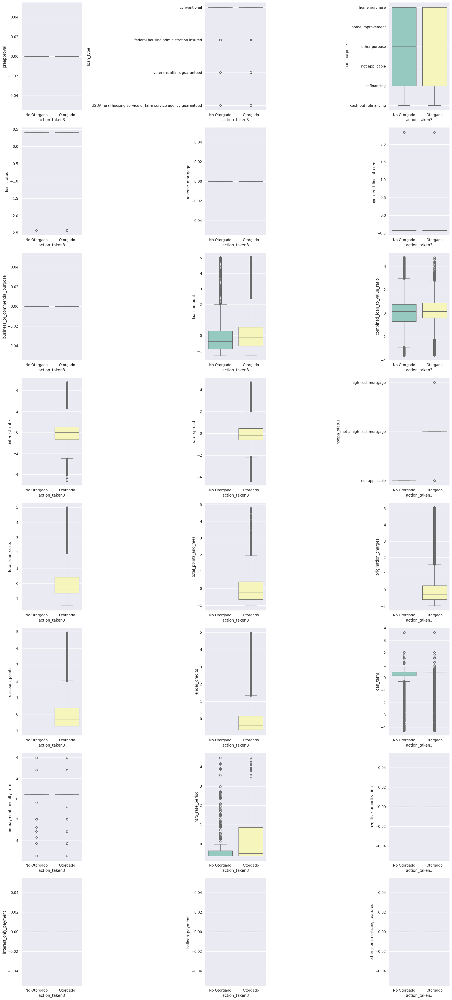

In [ ]:
#BOX PLOT DEPURANDO ALGUNOS ATIPICOS PRA TENER UNA MEJOR VISUALIZACION DE LOS DATOS
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Copiar el DataFrame original
homeMortgage_no_out = homeMortgage.copy()

# Limpieza de datos: eliminar valores atípicos de columnas numéricas
for column in homeMortgage_no_out.select_dtypes(include=[np.number]).columns:
    q05 = homeMortgage_no_out[column].quantile(0.10)
    q95 = homeMortgage_no_out[column].quantile(0.90)
    iqr = q95 - q05 #Interquartile range
    fence_low = q05 - 1.5 * iqr
    fence_high = q95 + 1.5 * iqr
    homeMortgage_no_out.loc[homeMortgage_no_out[column] > fence_high, column] = homeMortgage_no_out[column].quantile(0.25)
    homeMortgage_no_out.loc[homeMortgage_no_out[column] < fence_low, column] = homeMortgage_no_out[column].quantile(0.75)

# Ahora, estandarizamos o normalizamos los datos
scaler = StandardScaler()  # puedes usar StandardScaler o MinMaxScaler según tus necesidades
numeric_columns = homeMortgage_no_out.select_dtypes(include=[np.number]).columns
homeMortgage_no_out[numeric_columns] = scaler.fit_transform(homeMortgage_no_out[numeric_columns])

# Generar los boxplots para cada columna numérica estandarizada o normalizada con relación a 'action_taken3'
figure, axes = plt.subplots(nrows=8, ncols=3, figsize=(20, 44))

i = 0
j = 0

for c in homeMortgage_no_out.columns[6:30]:  # ajusta el rango según las columnas numéricas de interés
    sns.boxplot(x=homeMortgage_no_out['action_taken3'], y=homeMortgage_no_out[c], palette="Set3", ax=axes[i, j])

    if j == 2:
        j = 0
        i += 1
    else:
        j += 1

# Ajustar el diseño de los subgráficos
plt.tight_layout()
plt.show()




In [ ]:
# Importar pandas y numpy
import pandas as pd
import numpy as np

# Calcular estadísticas descriptivas para la columna 'income'
income_stats = homeMortgage['income'].describe()
print("Estadísticas descriptivas para 'income':\n", income_stats)

# Calcular estadísticas descriptivas para la columna 'loan_amount'
loan_amount_stats = homeMortgage['loan_amount'].describe()
print("\nEstadísticas descriptivas para 'loan_amount':\n", loan_amount_stats)


Estadísticas descriptivas para 'income':
 count    957551.000000
mean        148.064299
std        3000.849010
min      -17177.000000
25%          53.000000
50%          83.000000
75%         130.000000
max      856593.000000
Name: income, dtype: float64

Estadísticas descriptivas para 'loan_amount':
 count    1.000000e+06
mean     2.342582e+05
std      1.060060e+06
min      5.000000e+03
25%      1.050000e+05
50%      1.850000e+05
75%      2.950000e+05
max      6.396050e+08
Name: loan_amount, dtype: float64


# VARIABLES CATEGORICAS

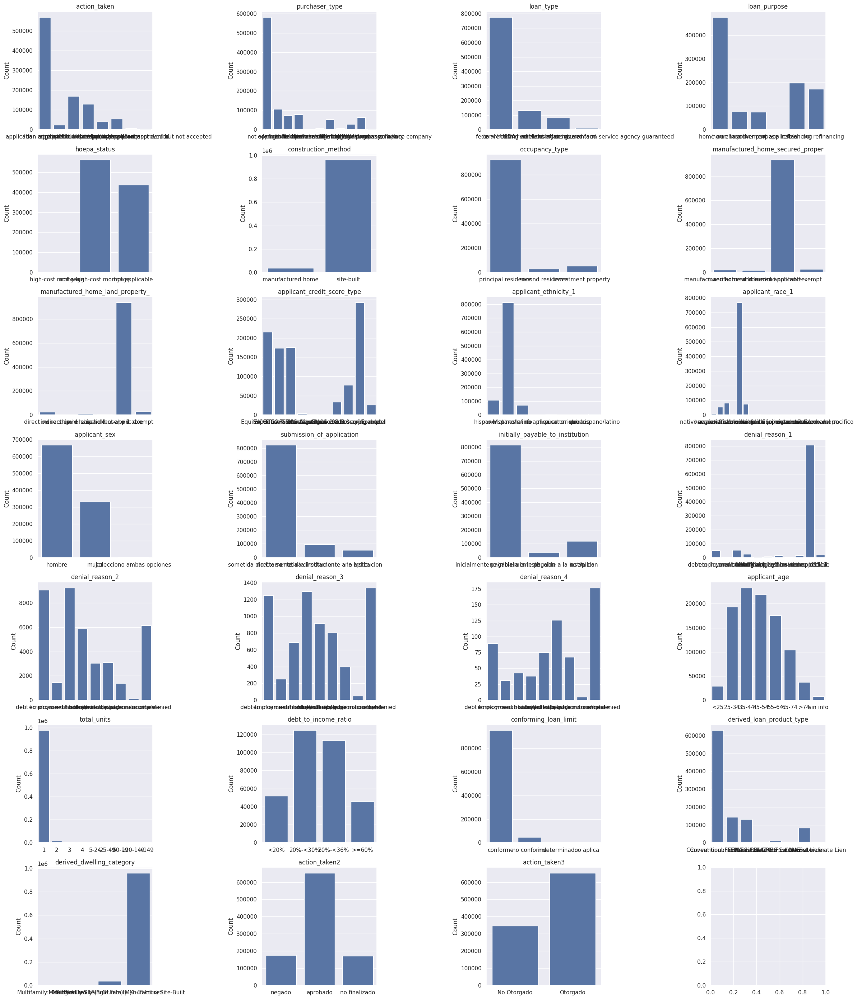

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir las columnas categóricas
categorical_columns = [
    'action_taken', 'purchaser_type', 'loan_type', 'loan_purpose', 'hoepa_status',
    'construction_method', 'occupancy_type', 'manufactured_home_secured_proper',
    'manufactured_home_land_property_', 'applicant_credit_score_type',
    'applicant_ethnicity_1', 'applicant_race_1', 'applicant_sex',
    'submission_of_application', 'initially_payable_to_institution',
    'denial_reason_1', 'denial_reason_2', 'denial_reason_3', 'denial_reason_4',
    'applicant_age', 'total_units', 'debt_to_income_ratio', 'conforming_loan_limit',
    'derived_loan_product_type', 'derived_dwelling_category', 'action_taken2', 'action_taken3'
]

# Calcular el número de filas y columnas necesarias para los subgráficos
nrows = (len(categorical_columns) - 1) // 4 + 1  # Usamos -1 para asegurarnos de que siempre habrá suficientes filas
ncols = min(len(categorical_columns), 4)

# Crear subgráficos
figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 6, nrows * 4))

# Iterar sobre las columnas categóricas y crear los gráficos
for i, column in enumerate(categorical_columns):
    row_index = i // ncols
    col_index = i % ncols
    ax = axes[row_index, col_index] if nrows > 1 else axes[col_index]
    sns.countplot(x=column, data=homeMortgage, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('')
    ax.set_ylabel('Count')

# Ajustar el diseño para que los subgráficos estén bien alineados
plt.tight_layout()
plt.show()


# CONTEOS TOTAL Y DE VARIABLES DE INTERÉS

In [ ]:
print(homeMortgage['applicant_age'].unique())

['45-54', '35-44', '65-74', '55-64', '25-34', '>74', '<25', 'sin info']
Categories (8, object): ['<25' < '25-34' < '35-44' < '45-54' < '55-64' < '65-74' < '>74' < 'sin info']


In [ ]:
#Analisis ACtion _Taken Original
homeMortgage.action_taken.value_counts()

loan originated                                  569947
application denied                               169198
application withdrawn by applicant               129132
purchased loan                                    54837
file closed for incompleteness                    41275
application approved but not accepted             24582
preapproval request denied                         6081
preapproval request approved but not accepted      4948
Name: action_taken, dtype: int64

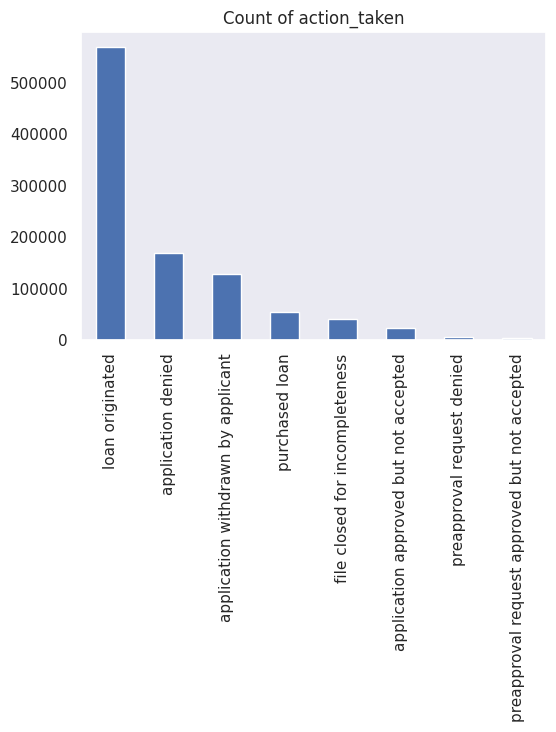

In [ ]:
ax = homeMortgage['action_taken'].value_counts().plot(kind='bar',
                                             figsize=(6,4),
                                             title="Count of action_taken",
                                             grid=True)
# Configurar el estilo sin cuadrícula
sns.set_style("white")
# Desactivar la cuadrícula
ax.grid(False)


In [ ]:
#Informacion Raza
homeMortgage. applicant_race_1.value_counts()

blanco                          769146
negro/afroamericano              80515
sin info                         74004
asiatico                         55376
nativo americano/alaska           8787
indio                             3438
hawaiano/isleno del pacifico      2757
otro asiatico                     1278
chino                             1135
filipino                          1133
otro isleno del pacifico           903
vietnamita                         517
koreano                            466
no aplica                          235
japones                            156
guameno o chamorro                  55
hawaiano                            50
samoan                              49
Name: applicant_race_1, dtype: int64

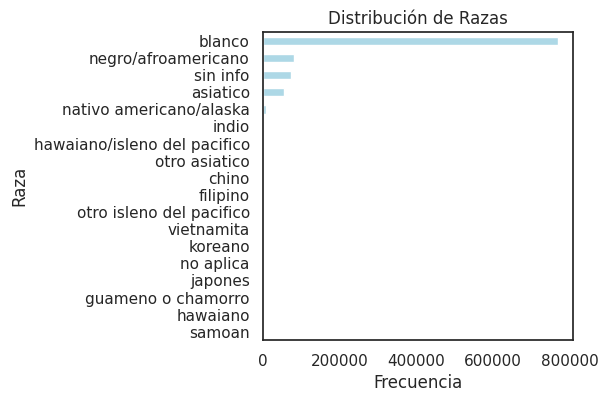

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_race_1'
race_counts = homeMortgage['applicant_race_1'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
race_counts = race_counts.sort_values(ascending=True)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
race_counts.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Razas')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Raza')  # Etiqueta del eje y
plt.show()


In [ ]:
#Informacion  Etnica
homeMortgage.applicant_ethnicity_1.value_counts()

no hispano/latino      813243
hispano/latino         106178
sin info                71098
otro hispano/latino      4167
mexicano                 3186
puertorriqueno            980
cubano                    493
no aplica                 301
Name: applicant_ethnicity_1, dtype: int64

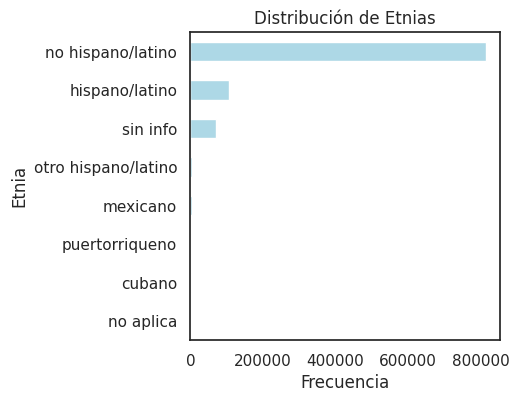

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_race_1'
race_counts = homeMortgage['applicant_ethnicity_1'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
race_counts = race_counts.sort_values(ascending=True)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
race_counts.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Etnias')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Etnia')  # Etiqueta del eje y
plt.show()

In [ ]:
#Informacion Sexo
homeMortgage.applicant_sex.value_counts()

hombre                       668101
mujer                        330947
selecciono ambas opciones       952
Name: applicant_sex, dtype: int64

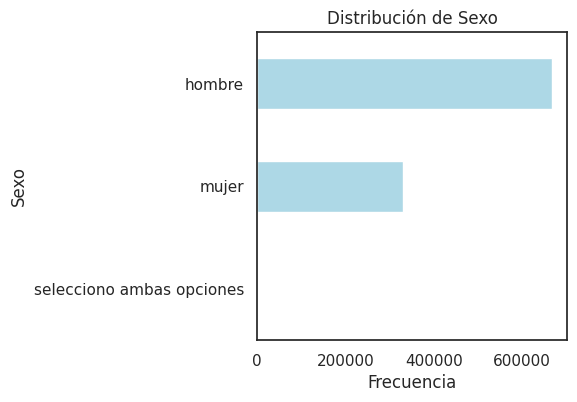

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_race_1'
race_counts = homeMortgage['applicant_sex'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
race_counts = race_counts.sort_values(ascending=True)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
race_counts.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Sexo')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Sexo')  # Etiqueta del eje y
plt.show()

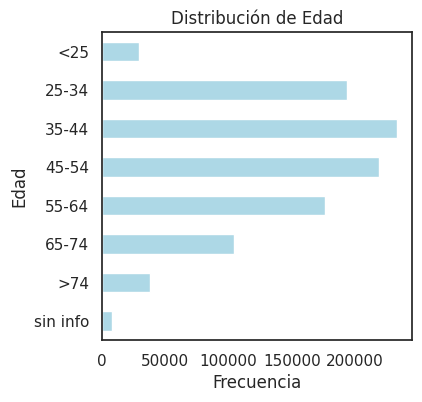

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_age'
age_counts = homeMortgage['applicant_age'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
age_counts_sorted = age_counts.sort_index(ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
age_counts_sorted.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Edad')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Edad')  # Etiqueta del eje y
plt.show()


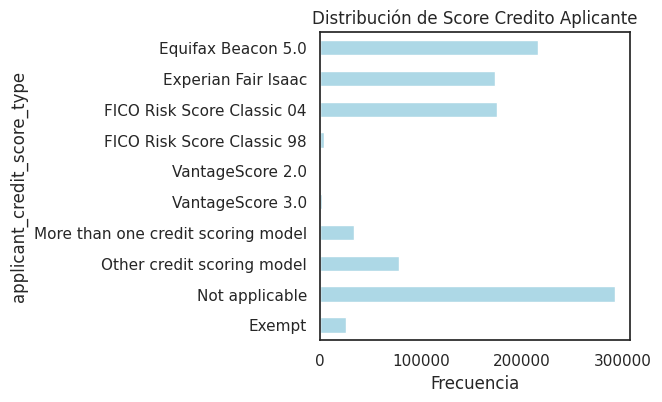

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_age'
age_counts = homeMortgage['applicant_credit_score_type'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
age_counts_sorted = age_counts.sort_index(ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
age_counts_sorted.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Score Credito Aplicante')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('applicant_credit_score_type')  # Etiqueta del eje y
plt.show()


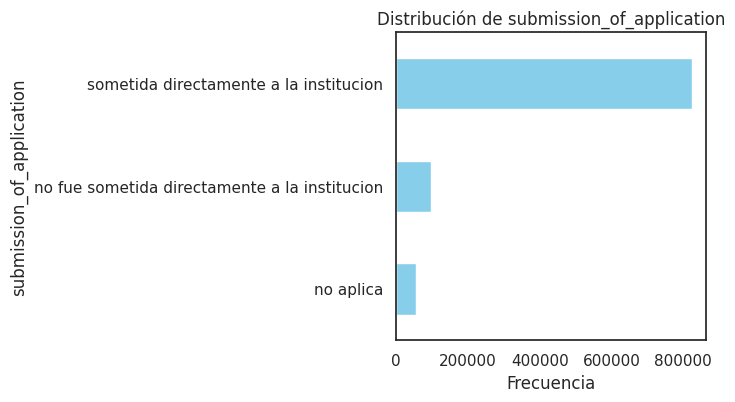

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_age'
age_counts = homeMortgage['submission_of_application'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
age_counts_sorted = age_counts.sort_index(ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
age_counts_sorted.plot(kind='barh', color='skyblue')  # Gráfico de barras horizontales
plt.title('Distribución de submission_of_application')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('submission_of_application')  # Etiqueta del eje y
plt.show()

In [ ]:
#Analisis LTV
homeMortgage.combined_loan_to_value_ratio.value_counts()

80.00000     76162
95.00000     36109
96.50000     35820
100.00000    32313
90.00000     25005
             ...  
85.79100         1
102.09500        1
76.89597         1
101.88900        1
43.39620         1
Name: combined_loan_to_value_ratio, Length: 72852, dtype: int64

Se observan  gran cantidad de valores únicos en la columna "combined_loan_to_value_ratio" y una distribución sesgada de los datos, te recomendaría considerar las siguientes opciones de visualización:

Histograma agrupado: Agrupa los datos en intervalos y crea un histograma para visualizar la distribución. Esto te permitirá ver la densidad relativa de los valores en diferentes rangos.

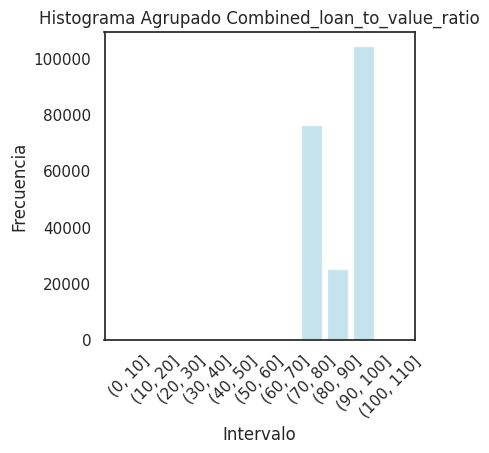

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Datos
data = {
    80.00000: 76162,
    95.00000: 36109,
    96.50000: 35820,
    100.00000: 32313,
    90.00000: 25005,
    # Agrega todos tus datos aquí
}

# Convertir los datos a un DataFrame de Pandas
df = pd.DataFrame(data.items(), columns=['Valor', 'Frecuencia'])

# Definir los límites de los intervalos y el número de bins
intervalos = range(0, 120, 10)  # Puedes ajustar estos valores según tus datos
num_bins = len(intervalos) - 1

# Agrupar los datos en intervalos y contar la frecuencia en cada intervalo
df['Intervalo'] = pd.cut(df['Valor'], bins=intervalos)
histogram_data = df.groupby('Intervalo')['Frecuencia'].sum()

# Crear el histograma
plt.figure(figsize=(4, 4))
plt.bar(histogram_data.index.astype(str), histogram_data.values, color='lightblue', alpha=0.7)
sns.set_style("white")
plt.xlabel('Intervalo')
plt.ylabel('Frecuencia')
plt.title('Histograma Agrupado Combined_loan_to_value_ratio')
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para una mejor visualización
plt.grid(False)  # Desactivar la cuadrícula
plt.show()


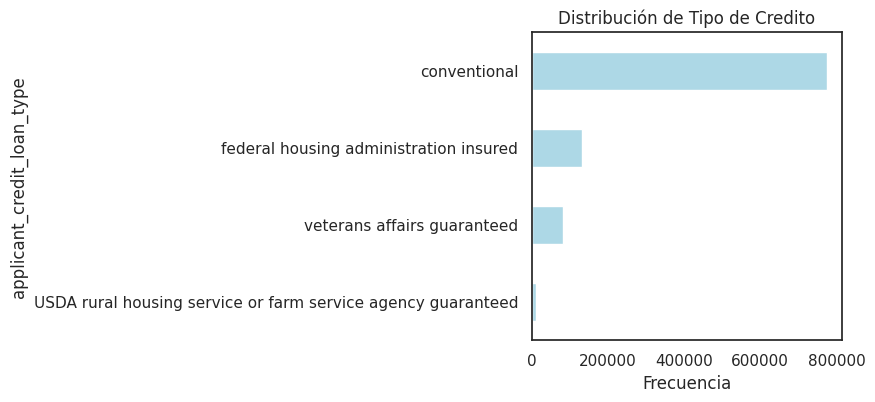

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'applicant_age'
age_counts = homeMortgage['loan_type'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
age_counts_sorted = age_counts.sort_index(ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
age_counts_sorted.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Tipo de Credito')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('applicant_credit_loan_type')  # Etiqueta del eje y
plt.show()


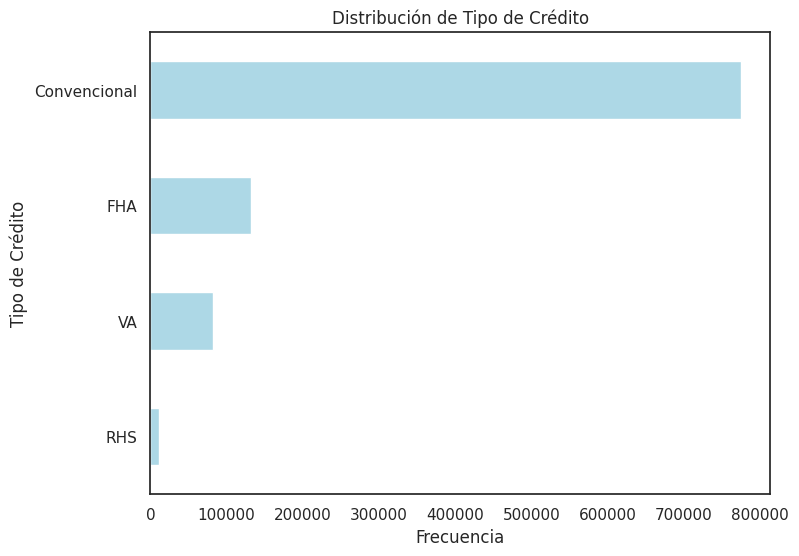

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns  # Asegúrate de haber importado seaborn también

# Obtener la distribución de valores en la columna 'loan_type'
loan_type_counts = homeMortgage['loan_type'].value_counts()

# Ordenar los valores de mayor a menor frecuencia
loan_type_counts_sorted = loan_type_counts.sort_index(ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crear el gráfico de barras horizontales
plt.figure(figsize=(8, 6))  # Tamaño del gráfico
loan_type_counts_sorted.plot(kind='barh', color='lightblue')  # Gráfico de barras horizontales
plt.title('Distribución de Tipo de Crédito')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Tipo de Crédito')  # Etiqueta del eje y

# Cambiar los nombres de las filas a español
plt.yticks(ticks=range(len(loan_type_counts_sorted.index)), labels=['RHS','VA','FHA','Convencional'])

plt.show()


SE AGRUPA LA VARIABLE RESPUESTA EN 3 CATEGORIAS ASI: APROBADO,NEGADO, NO FINALIZADO

-Crédito Otorgado Aprobado

-Crédito “comprado” Aprobado

-Crédito negado

-Archivo cerrado por completitud no finalizado

-Crédito aprobado pero no aceptado por cliente Aprobado

-Aplicacion desertada no finalizado

-Solicitud de aprobación previa denegada Negado

-Solicitud de aprobación previa aprobada pero no aceptada Aprobado


In [ ]:
#Informoacion Action_taken2
homeMortgage.action_taken2.value_counts()

aprobado         654314
negado           175279
no finalizado    170407
Name: action_taken2, dtype: int64

SE AGRUPA LA VARIABLE RESPUESTA EN 2 CATEGORIAS ASI: OTORGADO, NO OTORGADO

In [ ]:
#Analisis ACtion _Taken3
homeMortgage.action_taken3.value_counts()

Otorgado       654314
No Otorgado    345686
Name: action_taken3, dtype: int64

# ANALISIS ACTION_TAKEN

CUANTOS CLIENTES SON EXITOSOS EN SU SOLICITU DE CREDITO?

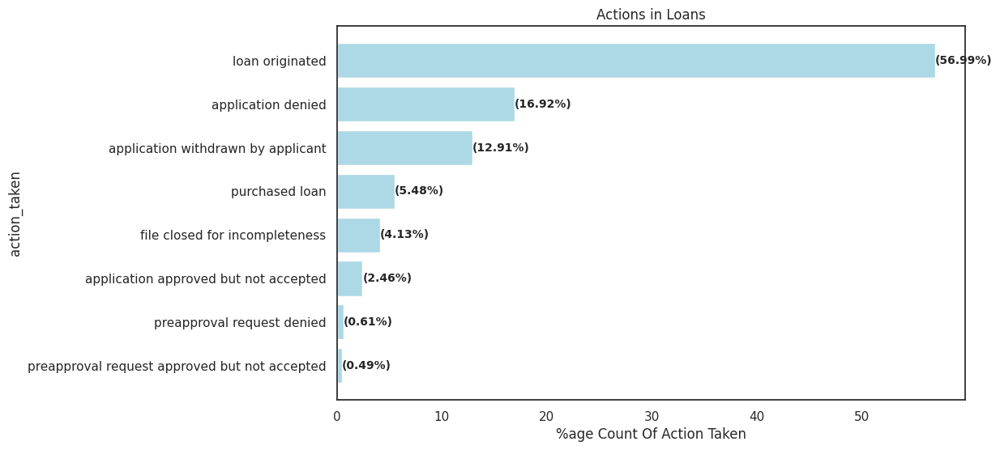

In [ ]:
# Mortgage Action Analysis. we examine the distribution of the various **Actions on Loans**
#Estaríamos interesados en la acción de préstamo **Originación de préstamo** ya que este estado significa que el préstamo ha sido marcado para ser otorgado al solicitante

import pandas as pd
import matplotlib.pyplot as plt

# Define los colores
light_blue_color = "#ADD8E6"

# Realiza un resumen y cálculos necesarios
homeMortgage_status = homeMortgage.groupby('action_taken').size().reset_index(name='CountOfActionTaken')
homeMortgage_status['PercentageActionTaken'] = (homeMortgage_status['CountOfActionTaken'] / homeMortgage_status['CountOfActionTaken'].sum()) * 100
homeMortgage_status = homeMortgage_status.sort_values(by='PercentageActionTaken', ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crea el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(homeMortgage_status['action_taken'], homeMortgage_status['PercentageActionTaken'], color=light_blue_color)
for i, v in enumerate(homeMortgage_status['PercentageActionTaken']):
    plt.text(v, i, f'({v:.2f}%)', va='center', fontsize=10, fontweight='bold')
plt.xlabel('%age Count Of Action Taken')
plt.ylabel('action_taken')
plt.title('Actions in Loans')
plt.gca().invert_yaxis()
plt.show()

<ipython-input-43-c02680e47d9b>:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(nombres_acciones)


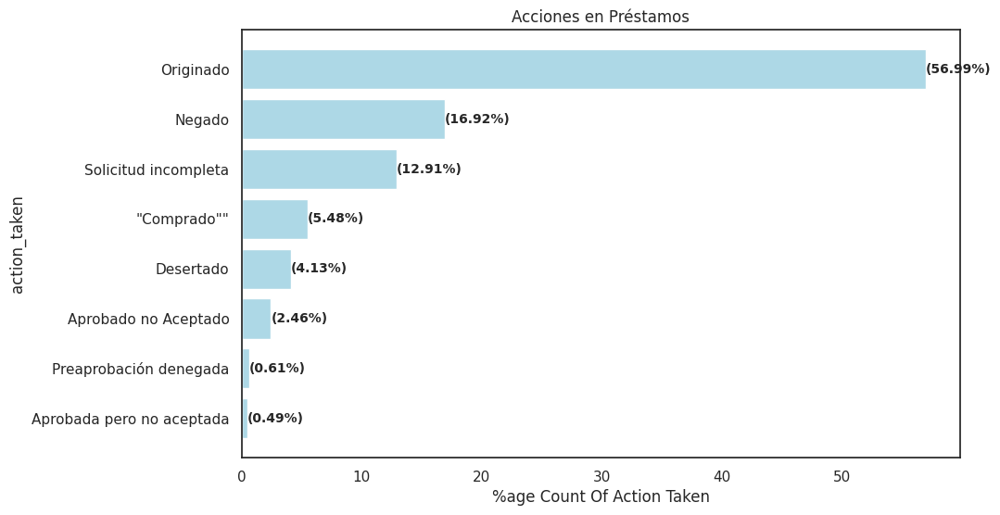

In [ ]:
#Etiquetas en españos
import pandas as pd
import matplotlib.pyplot as plt

# Define los colores
light_blue_color = "#ADD8E6"

# Realiza un resumen y cálculos necesarios
homeMortgage_status = homeMortgage.groupby('action_taken').size().reset_index(name='CountOfActionTaken')
homeMortgage_status['PercentageActionTaken'] = (homeMortgage_status['CountOfActionTaken'] / homeMortgage_status['CountOfActionTaken'].sum()) * 100
homeMortgage_status = homeMortgage_status.sort_values(by='PercentageActionTaken', ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crea el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(homeMortgage_status['action_taken'], homeMortgage_status['PercentageActionTaken'], color=light_blue_color)
for i, v in enumerate(homeMortgage_status['PercentageActionTaken']):
    plt.text(v, i, f'({v:.2f}%)', va='center', fontsize=10, fontweight='bold')
plt.xlabel('%age Count Of Action Taken')
plt.ylabel('action_taken')

# Cambiar los nombres de las líneas en el eje y al español
nombres_acciones = ['Originado', 'Negado', 'Solicitud incompleta', '"Comprado""', 'Desertado', 'Aprobado no Aceptado', 'Preaprobación denegada', 'Aprobada pero no aceptada']
plt.gca().set_yticklabels(nombres_acciones)

plt.title('Acciones en Préstamos')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
unique_action_taken = homeMortgage['action_taken'].unique()
print(unique_action_taken)


['application denied', 'loan originated', 'application withdrawn by applicant', 'application approved but not accepted', 'file closed for incompleteness', 'purchased loan', 'preapproval request denied', 'preapproval request approved but not accepted']
Categories (8, object): ['loan originated' < 'application approved but not accepted' <
                         'application denied' < 'application withdrawn by applicant' <
                         'file closed for incompleteness' < 'purchased loan' < 'preapproval request denied' <
                         'preapproval request approved but not accepted']


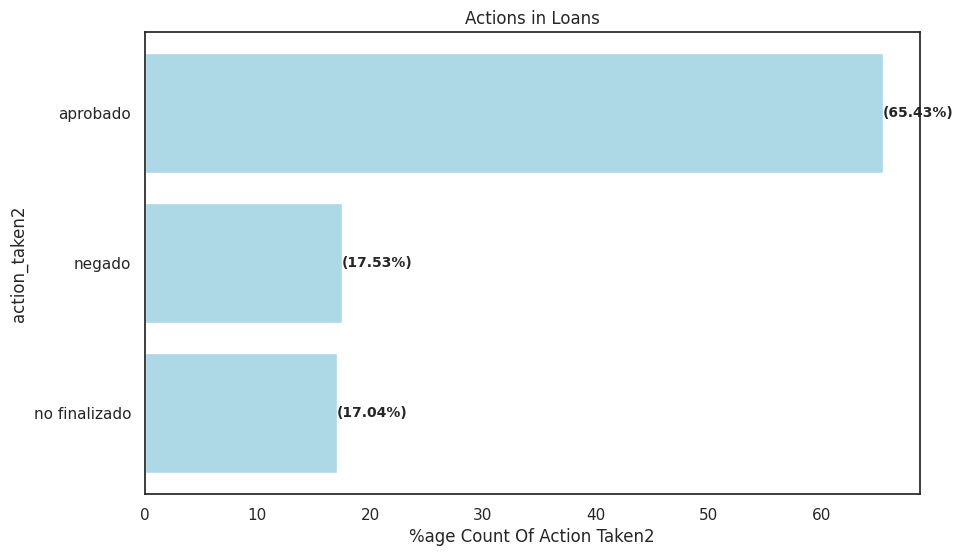

In [ ]:
# Mortgage Action Analysis. we examine the distribution of the various **Actions on Loans**
#Estaríamos interesados en la acción de préstamo **Originación de préstamo** ya que este estado significa que el préstamo ha sido marcado para ser otorgado al solicitante

import pandas as pd
import matplotlib.pyplot as plt

# Define los colores
fill_color = "#FFA07A"
fill_color2 = "#F1C40F"

# Realiza un resumen y cálculos necesarios
homeMortgage_status = homeMortgage.groupby('action_taken2').size().reset_index(name='CountOfActionTaken2')
homeMortgage_status['PercentageActionTaken2'] = (homeMortgage_status['CountOfActionTaken2'] / homeMortgage_status['CountOfActionTaken2'].sum()) * 100
homeMortgage_status = homeMortgage_status.sort_values(by='PercentageActionTaken2', ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crea el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(homeMortgage_status['action_taken2'], homeMortgage_status['PercentageActionTaken2'], color=light_blue_color)
for i, v in enumerate(homeMortgage_status['PercentageActionTaken2']):
    plt.text(v, i, f'({v:.2f}%)', va='center', fontsize=10, fontweight='bold')
plt.xlabel('%age Count Of Action Taken2')
plt.ylabel('action_taken2')
plt.title('Actions in Loans')
plt.gca().invert_yaxis()
plt.show()

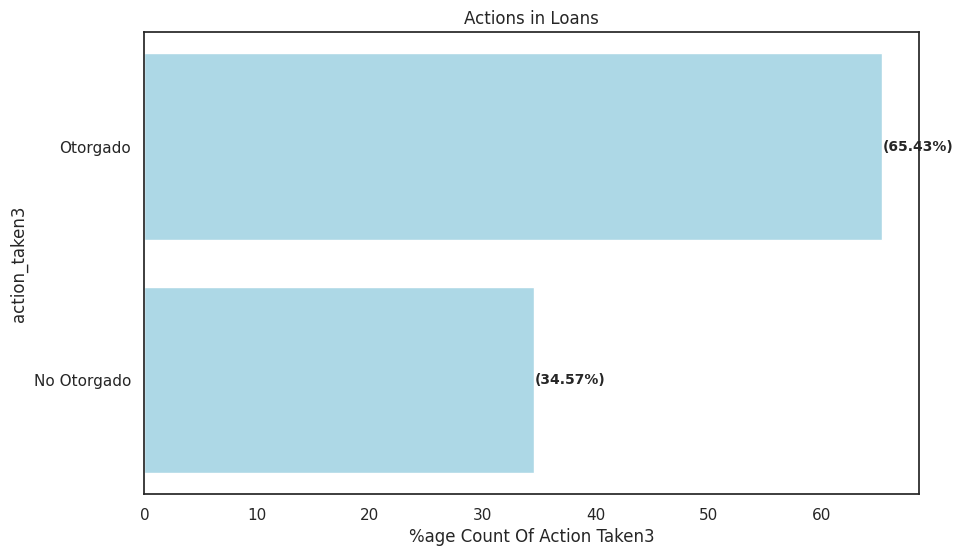

In [ ]:
# Mortgage Action Analysis. we examine the distribution of the various **Actions on Loans**
#Estaríamos interesados en la acción de préstamo **Originación de préstamo** ya que este estado significa que el préstamo ha sido marcado para ser otorgado al solicitante
#Otorgado igual a aprobado en action_taken2 y No Otorgado igual a negado y no finalizado en action_taken2#

import pandas as pd
import matplotlib.pyplot as plt

# Define los colores
fill_color = "#FFA07A"
fill_color2 = "#F1C40F"

# Realiza un resumen y cálculos necesarios
homeMortgage_status = homeMortgage.groupby('action_taken3').size().reset_index(name='CountOfActionTaken3')
homeMortgage_status['PercentageActionTaken3'] = (homeMortgage_status['CountOfActionTaken3'] / homeMortgage_status['CountOfActionTaken3'].sum()) * 100
homeMortgage_status = homeMortgage_status.sort_values(by='PercentageActionTaken3', ascending=False)

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Crea el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(homeMortgage_status['action_taken3'], homeMortgage_status['PercentageActionTaken3'], color=light_blue_color)
for i, v in enumerate(homeMortgage_status['PercentageActionTaken3']):
    plt.text(v, i, f'({v:.2f}%)', va='center', fontsize=10, fontweight='bold')
plt.xlabel('%age Count Of Action Taken3')
plt.ylabel('action_taken3')
plt.title('Actions in Loans')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
%matplotlib inline

def cate_pie(col):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    actions = list(homeMortgage['action_taken3'].unique())
    indice = np.arange(len(actions))
    for action, i in zip(actions, indice):
        category = homeMortgage[homeMortgage['action_taken3']==action][col]
        vc = category.value_counts(sort=False)
        axes[i].pie(vc.values, labels=vc.keys(), autopct='%1.1f%%')
        axes[i].set_title(action, fontsize=14)
        axes[i].axis('equal')

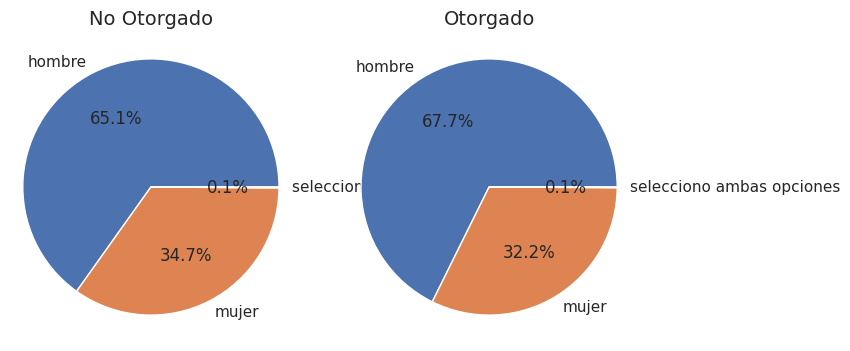

In [ ]:
cate_pie('applicant_sex')

# RELACION DE VARIABLE OBJETIVO ACTION_TAKEN CON VARIABLES SENSIBLES

El siguiente gráfico de barras muestra la distribución de las distintas comunidades étnicas

<ipython-input-49-9e9149446130>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=homeMortgage_ethnicity, x='CountOfEthnicity', y='applicant_ethnicity_name', palette='Set2')


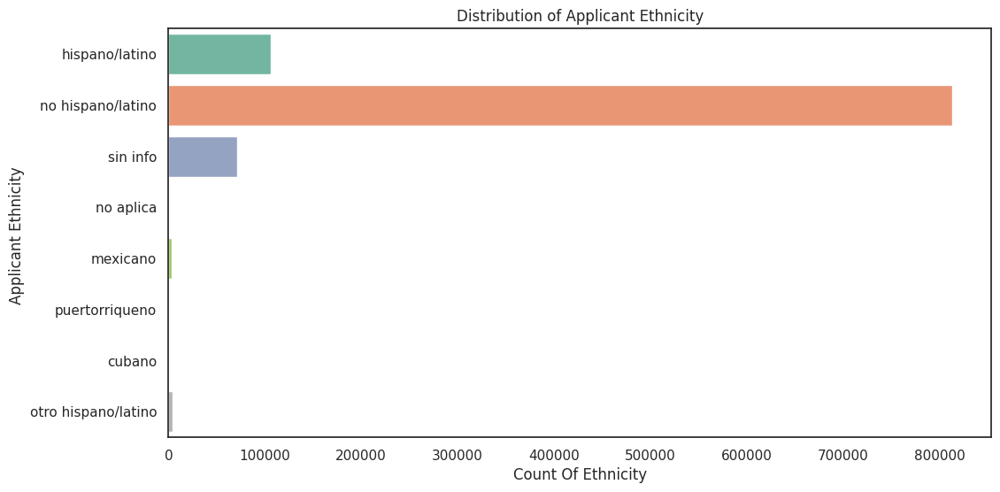

In [ ]:
#Ethnicity and Action dependencies.
## Ethnic groups. The following bar graph shows the distribution of the various ethnic communites.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supongamos que tienes un DataFrame en Python llamado 'homeMortgage'

# 1. Realizar cálculos de recuento y ordenarlos
homeMortgageStatus_ethnicity = homeMortgage.groupby(['action_taken', 'applicant_ethnicity_1']).size().reset_index(name='CountOfActionTaken')
homeMortgageStatus_ethnicity = homeMortgageStatus_ethnicity.sort_values(by='CountOfActionTaken', ascending=False)

homeMortgage_ethnicity = homeMortgage['applicant_ethnicity_1'].value_counts().reset_index()
homeMortgage_ethnicity.columns = ['applicant_ethnicity_name', 'CountOfEthnicity']
homeMortgage_ethnicity = homeMortgage_ethnicity.sort_values(by='CountOfEthnicity', ascending=False)

# 2. Crear gráficos
plt.figure(figsize=(12, 6))
sns.barplot(data=homeMortgage_ethnicity, x='CountOfEthnicity', y='applicant_ethnicity_name', palette='Set2')
plt.xlabel('Count Of Ethnicity')
plt.ylabel('Applicant Ethnicity ')
plt.title('Distribution of Applicant Ethnicity')
plt.show()

<ipython-input-50-037229701279>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=race_counts.index, y=race_counts.values, palette='viridis')


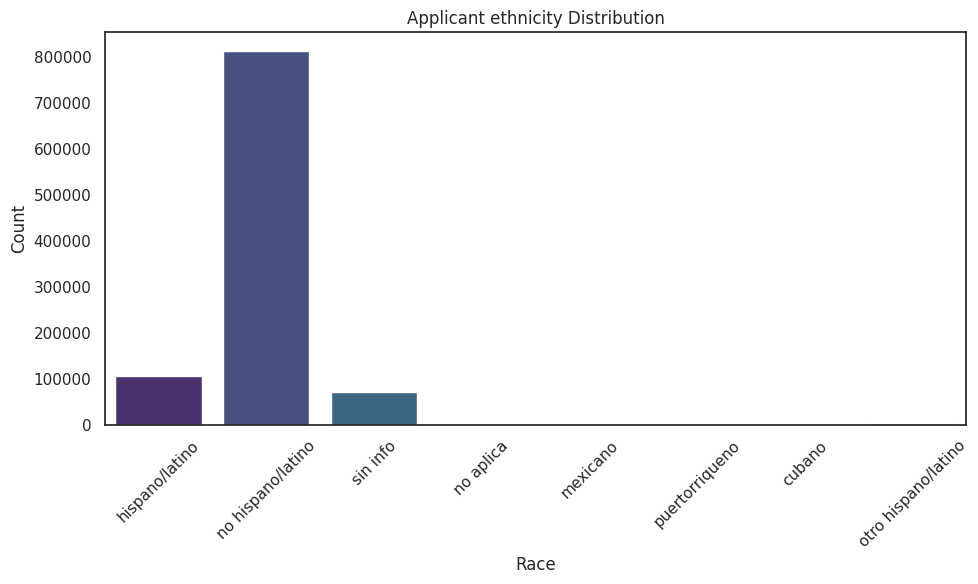

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Obtener los recuentos de valores únicos en la columna 'applicant_race_1'
race_counts = homeMortgage['applicant_ethnicity_1'].value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x=race_counts.index, y=race_counts.values, palette='viridis')
plt.xlabel('Race')
plt.ylabel('Count')
plt.title('Applicant ethnicity Distribution')
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para una mejor legibilidad
plt.tight_layout()
plt.show()


<ipython-input-51-1f7c5208b687>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=homeMortgage_ethnicity, x='CountOfrace', y='applicant_ethnicity_1', palette='Set2')


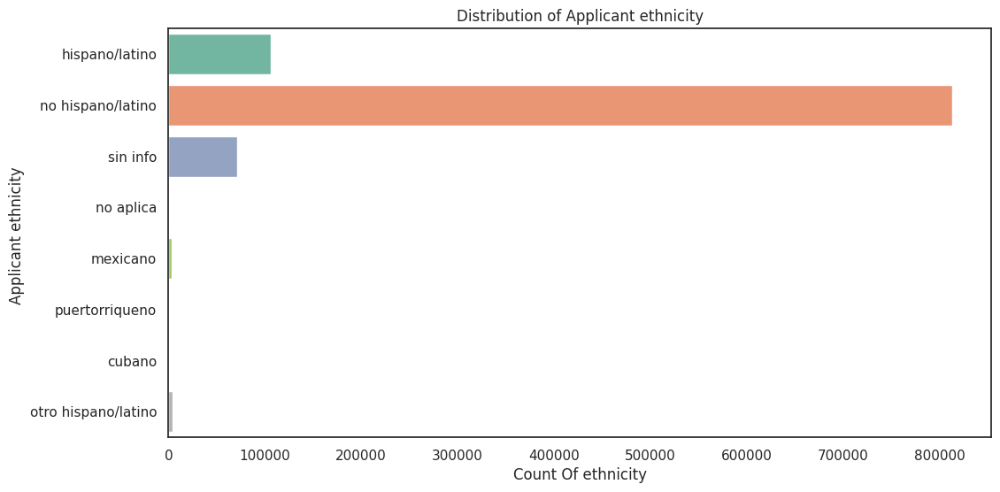

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supongamos que tienes un DataFrame en Python llamado 'homeMortgage'

# 1. Realizar cálculos de recuento y ordenarlos
homeMortgageStatus_ethnicity = homeMortgage.groupby(['action_taken', 'applicant_ethnicity_1']).size().reset_index(name='CountOfActionTaken')
homeMortgageStatus_ethnicity = homeMortgageStatus_ethnicity.sort_values(by='CountOfActionTaken', ascending=False)

homeMortgage_ethnicity = homeMortgage['applicant_ethnicity_1'].value_counts().reset_index()
homeMortgage_ethnicity.columns = ['applicant_ethnicity_1', 'CountOfrace']
homeMortgage_ethnicity = homeMortgage_ethnicity.sort_values(by='CountOfrace', ascending=False)

# 2. Crear gráficos
plt.figure(figsize=(12, 6))
sns.barplot(data=homeMortgage_ethnicity, x='CountOfrace', y='applicant_ethnicity_1', palette='Set2')
plt.xlabel('Count Of ethnicity')
plt.ylabel('Applicant ethnicity ')
plt.title('Distribution of Applicant ethnicity')
plt.show()


El siguiente gráfico de barras muestra la distribución de las distintas comunidades RAZAS

CON RAZA

<ipython-input-52-964c34b36fc2>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=homeMortgage_ethnicity, x='CountOfrace', y='applicant_race_name', palette='Set2')


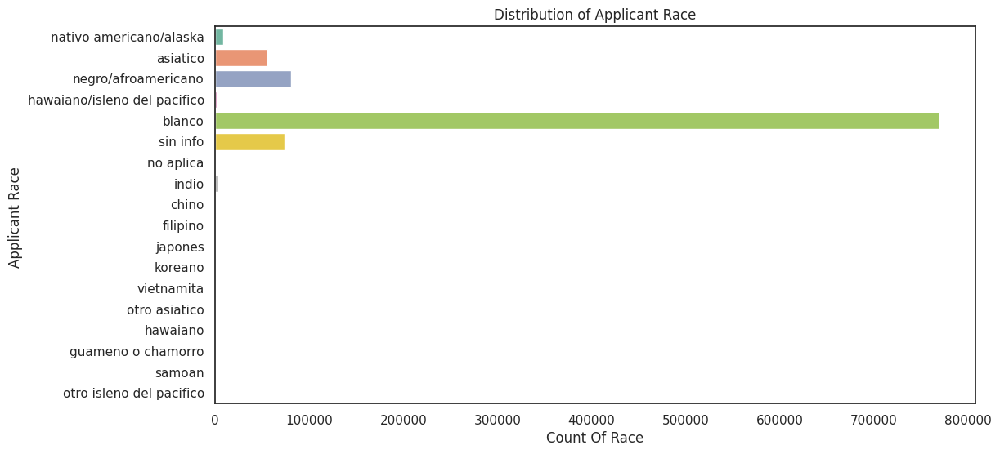

In [ ]:
#Ethnicity and Action dependencies.
## Ethnic groups. The following bar graph shows the distribution of the various ethnic communites.

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supongamos que tienes un DataFrame en Python llamado 'homeMortgage'

# 1. Realizar cálculos de recuento y ordenarlos
homeMortgageStatus_ethnicity = homeMortgage.groupby(['action_taken', 'applicant_race_1']).size().reset_index(name='CountOfActionTaken')
homeMortgageStatus_ethnicity = homeMortgageStatus_ethnicity.sort_values(by='CountOfActionTaken', ascending=False)

homeMortgage_ethnicity = homeMortgage['applicant_race_1'].value_counts().reset_index()
homeMortgage_ethnicity.columns = ['applicant_race_name', 'CountOfrace']
homeMortgage_ethnicity = homeMortgage_ethnicity.sort_values(by='CountOfrace', ascending=False)

# 2. Crear gráficos
plt.figure(figsize=(12, 6))
sns.barplot(data=homeMortgage_ethnicity, x='CountOfrace', y='applicant_race_name', palette='Set2')
plt.xlabel('Count Of Race')
plt.ylabel('Applicant Race ')
plt.title('Distribution of Applicant Race')
plt.show()

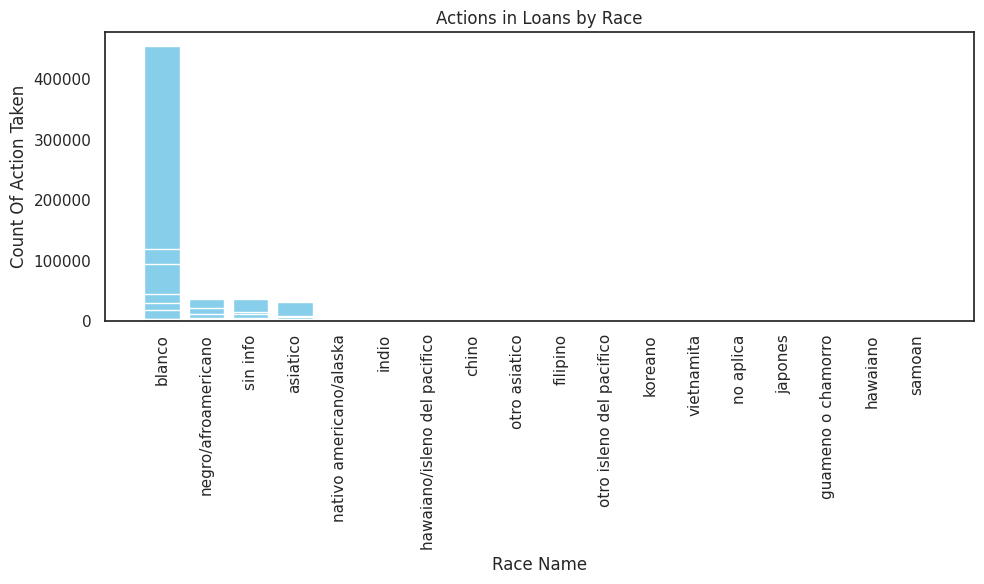

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calcular el conteo de acciones tomadas por cada raza de solicitante y ordenar por conteo descendente
homeMortgageStatus_applicant_race1 = homeMortgage.groupby(['action_taken', 'applicant_race_1']).size().reset_index(name='CountOfActionTaken')
homeMortgageStatus_applicant_race1 = homeMortgageStatus_applicant_race1.sort_values(by='CountOfActionTaken', ascending=False)

# Crear el gráfico de barras utilizando Matplotlib
plt.figure(figsize=(10, 6))
plt.bar(homeMortgageStatus_applicant_race1['applicant_race_1'], homeMortgageStatus_applicant_race1['CountOfActionTaken'], color='skyblue')
plt.xlabel('Race Name')
plt.ylabel('Count Of Action Taken')
plt.title('Actions in Loans by Race')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


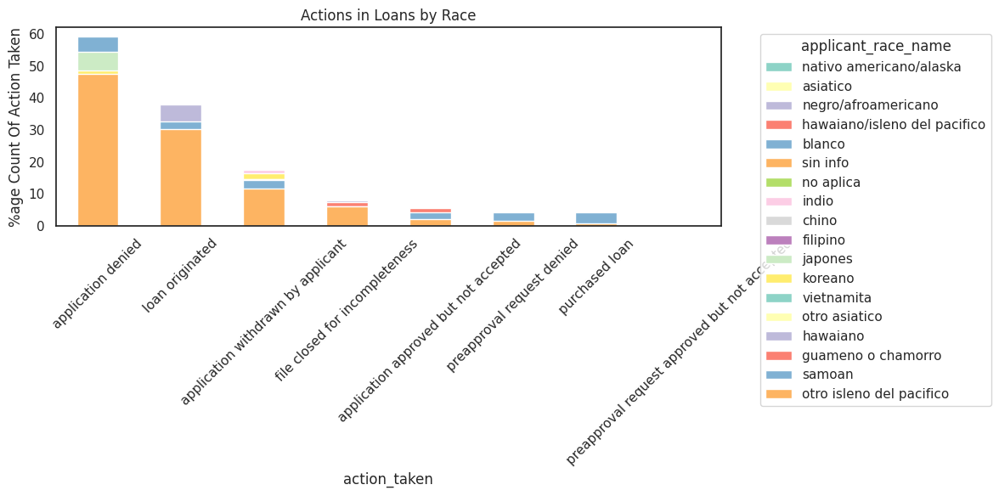

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Realiza una combinación (inner join) de los dos DataFrames
combined_df = pd.merge(homeMortgageStatus_ethnicity, homeMortgage_ethnicity, left_on='applicant_race_1', right_on='applicant_race_name')

# Calcula la columna 'percentage'
combined_df['percentage'] = (combined_df['CountOfActionTaken'] / combined_df['CountOfrace']) * 100

# Definir una lista de colores personalizada para cada categoría
custom_colors = sns.color_palette('Set3', len(combined_df['applicant_race_1'].unique()))


# Crea un gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))

for i, (key, grp) in enumerate(combined_df.groupby('applicant_race_1')):
    grp.plot(ax=ax, kind='bar', x='action_taken', y='percentage', label=key, color=custom_colors[i])

ax.set_xlabel('action_taken')
ax.set_ylabel('%age Count Of Action Taken')
ax.set_title('Actions in Loans by Race')
plt.legend(title='applicant_race_name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


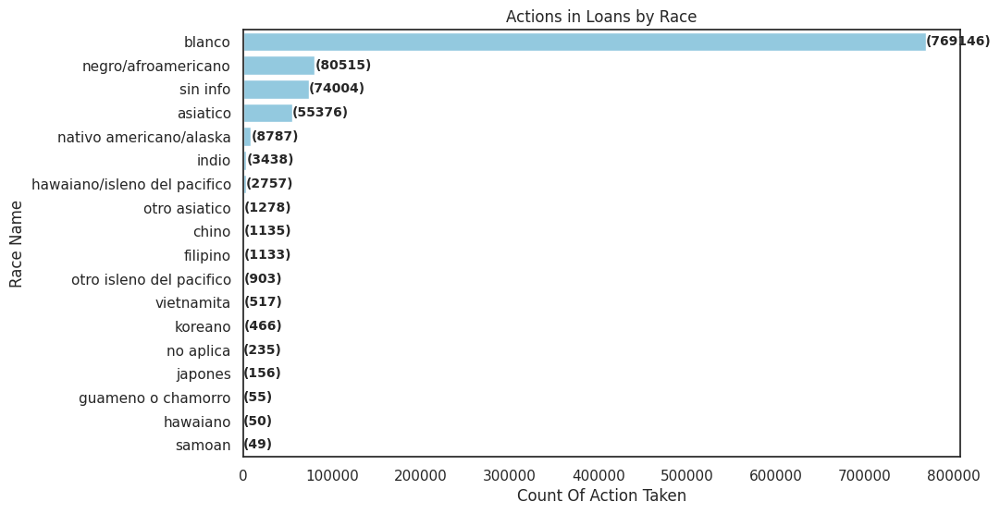

In [ ]:
# Diversas razas que se han asociado con el proceso de originación de préstamos.
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Agrupar por acción tomada y raza del solicitante y contar
homeMortgageStatus_applicant_race1 = homeMortgage.groupby(['action_taken', 'applicant_race_1']).size().reset_index(name='CountOfActionTaken')
homeMortgageStatus_applicant_race1 = homeMortgageStatus_applicant_race1.sort_values(by='CountOfActionTaken', ascending=False)

# Agrupar solo por raza del solicitante y contar
homeMortgage_applicant_race1 = homeMortgage.groupby('applicant_race_1').size().reset_index(name='CountOfRace1')
homeMortgage_applicant_race1 = homeMortgage_applicant_race1.sort_values(by='CountOfRace1', ascending=False)

# Configurar el color de relleno para las barras
fillColor = 'skyblue'

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(x='CountOfRace1', y='applicant_race_1', data=homeMortgage_applicant_race1, color=fillColor, order=homeMortgage_applicant_race1['applicant_race_1'])
for i, value in enumerate(homeMortgage_applicant_race1['CountOfRace1']):
    plt.text(value, i, f'({value})', va='center', fontsize=10, fontweight='bold')

plt.xlabel('Count Of Action Taken')
plt.ylabel('Race Name')
plt.title('Actions in Loans by Race')
plt.show()


In [ ]:
#Loan Status and Race (ESTATUS DEL CREDITO Y RAZA) -otra visualizacion
import pandas as pd
import plotly.express as px

# Inner join de los dos DataFrames
homeMortgageStatus_race = pd.merge(homeMortgageStatus_applicant_race1, homeMortgage_applicant_race1, on='applicant_race_1')

# Calcular el porcentaje
homeMortgageStatus_race['percentage'] = (homeMortgageStatus_race['CountOfActionTaken'] / homeMortgageStatus_race['CountOfRace1']) * 100

# Configurar el color de relleno para las barras
fillColor = 'skyblue'

# Crear el gráfico interactivo con barras horizontales
fig = px.bar(homeMortgageStatus_race,
             x='percentage',
             y='applicant_race_1',
             color='action_taken',
             text=round(homeMortgageStatus_race['percentage'], 2),
             labels={'percentage': '%age Count Of Action Taken'},
             title='Actions in Loans by Race',
             width=800,
             height=500,
             orientation='h')  # Añadido para orientación horizontal

# Mostrar el gráfico
fig.show()


# ANALISIS INGRESO -INCOME

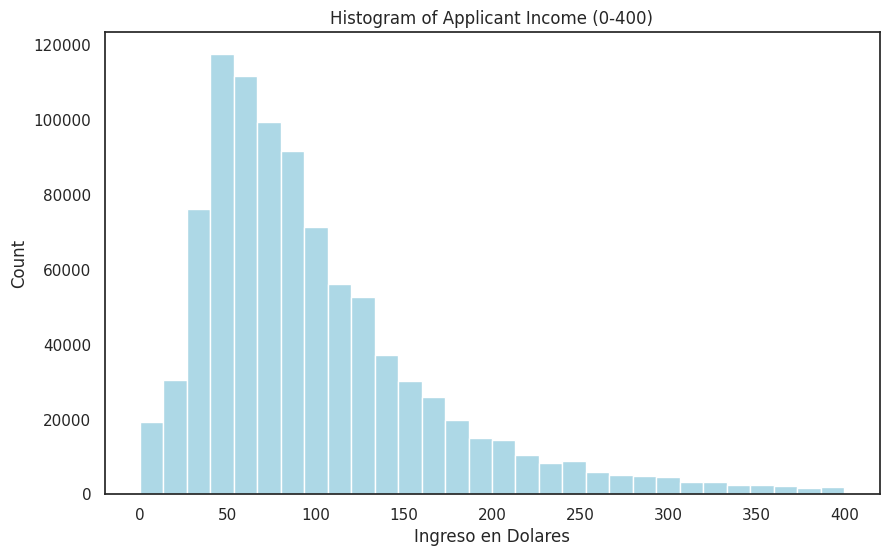

In [ ]:
import matplotlib.pyplot as plt

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Trazar el histograma con límites específicos en el eje x
plt.figure(figsize=(10, 6))
plt.hist(homeMortgage['income'], bins=30, range=(0, 400), color='lightblue')
plt.xlabel('Ingreso en Dolares')
plt.ylabel('Count')
plt.title('Histogram of Applicant Income (0-400)')

# Desactivar la cuadrícula
plt.grid(False)
# Configurar el estilo sin cuadrícula
sns.set_style("white")
# Eliminar la cuadrícula
plt.grid(False)

plt.show()


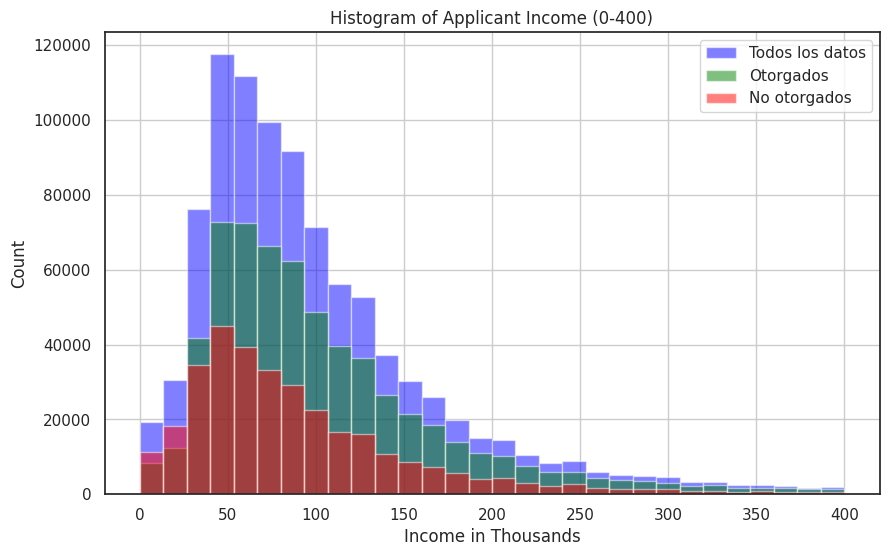

In [ ]:
import matplotlib.pyplot as plt

# Filtrar los datos para los otorgados y no otorgados
approved_data = homeMortgage[homeMortgage['action_taken3'] == 'Otorgado']['income']
denied_data = homeMortgage[homeMortgage['action_taken3'] == 'No Otorgado']['income']

# Trazar el histograma con límites específicos en el eje x
plt.figure(figsize=(10, 6))
plt.hist(homeMortgage['income'], bins=30, range=(0, 400), color='blue', alpha=0.5, label='Todos los datos')
plt.hist(approved_data, bins=30, range=(0, 400), color='green', alpha=0.5, label='Otorgados')
plt.hist(denied_data, bins=30, range=(0, 400), color='red', alpha=0.5, label='No otorgados')
plt.xlabel('Income in Thousands')
plt.ylabel('Count')
plt.title('Histogram of Applicant Income (0-400)')
plt.grid(True)
plt.legend()
plt.show()


DISTRIBUCION DEL INGRESO PARA LOS APLICANTES QUE FUERON APROBADOS

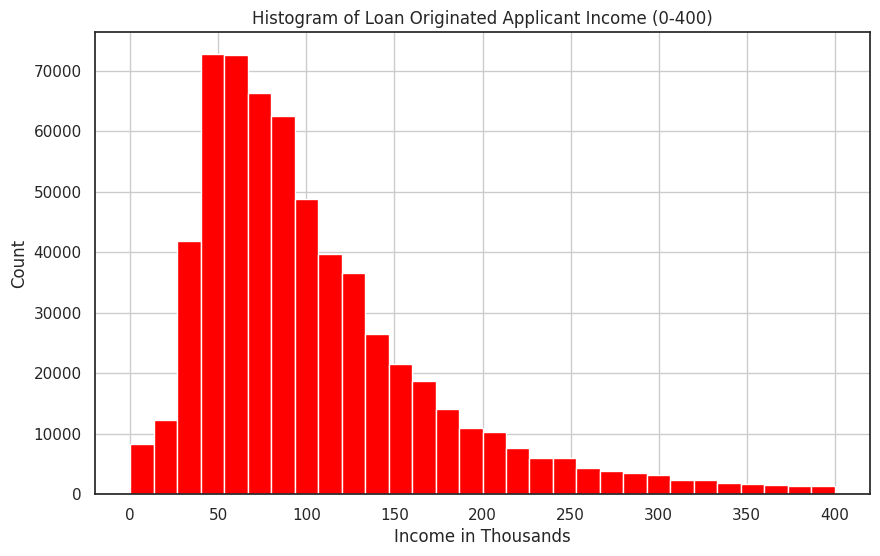

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Definir la acción de interés
actionStatus = "aprobado"

# Filtrar los datos
filtered_data = homeMortgage[homeMortgage['action_taken2'] == actionStatus].dropna(subset=['income'])

# Trazar el histograma con límites específicos en el eje x
plt.figure(figsize=(10, 6))
plt.hist(filtered_data['income'], bins=30, range=(0, 400), color='red')
plt.xlabel('Income in Thousands')
plt.ylabel('Count')
plt.title('Histogram of Loan Originated Applicant Income (0-400)')
plt.grid(True)
plt.show()

DISTRIBUCION DEL INGRESO PARA LOS APLICANTES QUE FUERON OTORGADOS

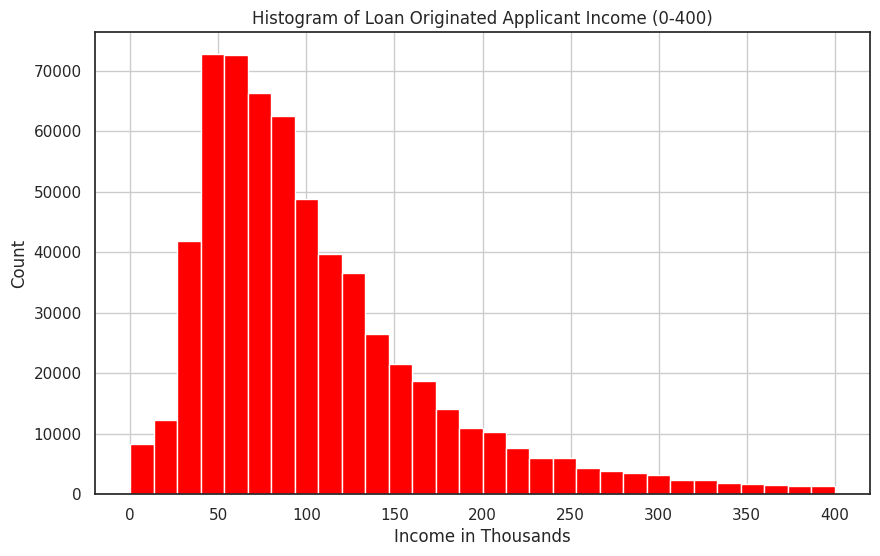

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Definir la acción de interés
actionStatus = "Otorgado"

# Filtrar los datos
filtered_data = homeMortgage[homeMortgage['action_taken3'] == actionStatus].dropna(subset=['income'])

# Trazar el histograma con límites específicos en el eje x
plt.figure(figsize=(10, 6))
plt.hist(filtered_data['income'], bins=30, range=(0, 400), color='red')
plt.xlabel('Income in Thousands')
plt.ylabel('Count')
plt.title('Histogram of Loan Originated Applicant Income (0-400)')
plt.grid(True)
plt.show()

DISTRIBUCION DEL INGRESO PARA LOS APLICANTES QUE NO FUERON OTORGADOS

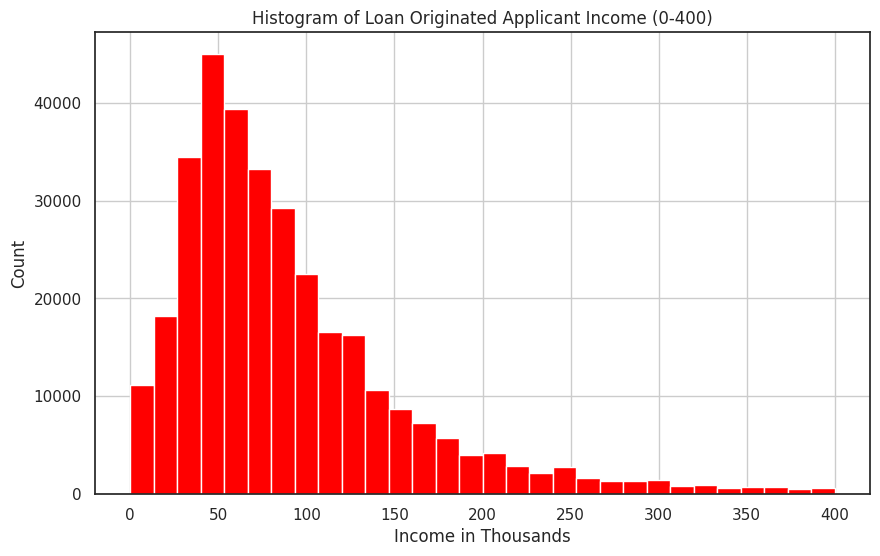

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Definir la acción de interés
actionStatus = "No Otorgado"

# Filtrar los datos
filtered_data = homeMortgage[homeMortgage['action_taken3'] == actionStatus].dropna(subset=['income'])

# Trazar el histograma con límites específicos en el eje x
plt.figure(figsize=(10, 6))
plt.hist(filtered_data['income'], bins=30, range=(0, 400), color='red')
plt.xlabel('Income in Thousands')
plt.ylabel('Count')
plt.title('Histogram of Loan Originated Applicant Income (0-400)')
plt.grid(True)
plt.show()

# ANALISIS MONTO CREDITO -LOAN AMOUNT

Dado que la distribución de los préstamos probablemente esté sesgada hacia valores más bajos, puedes trazar un histograma con una escala logarítmica en el eje y para visualizar mejor la distribución de los préstamos

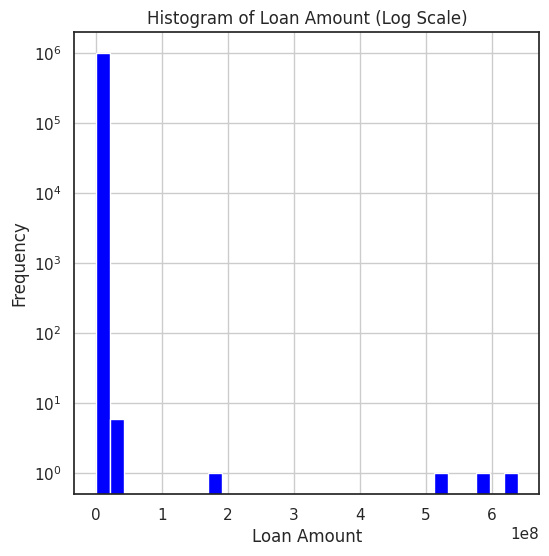

In [ ]:
#Historgrama escala logaritmica
import matplotlib.pyplot as plt

# Histograma con escala logarítmica en el eje y
plt.figure(figsize=(6, 6))
plt.hist(homeMortgage['loan_amount'], bins=30, color='blue')
plt.yscale('log')  # Establece la escala logarítmica en el eje y
plt.xlabel('Loan Amount')
plt.ylabel('Frequency')
plt.title('Histogram of Loan Amount (Log Scale)')
plt.grid(True)
plt.show()


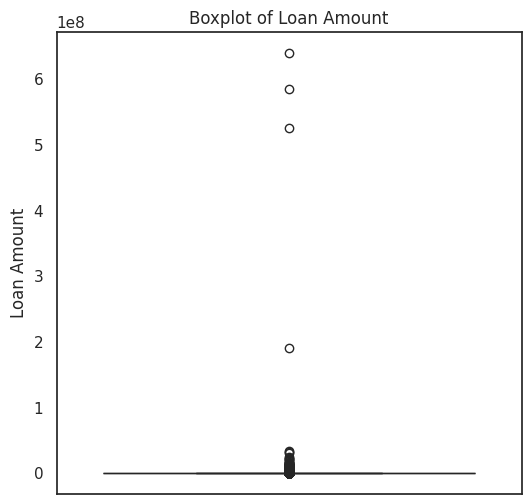

In [ ]:
#BOX-PLOT
import seaborn as sns

# Diagrama de caja para visualizar la distribución y los valores atípicos
plt.figure(figsize=(6, 6))
sns.boxplot(y='loan_amount', data=homeMortgage, color='green')
plt.ylabel('Loan Amount')
plt.title('Boxplot of Loan Amount')
plt.show()


<ipython-input-64-a061082f6dfe>:4: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




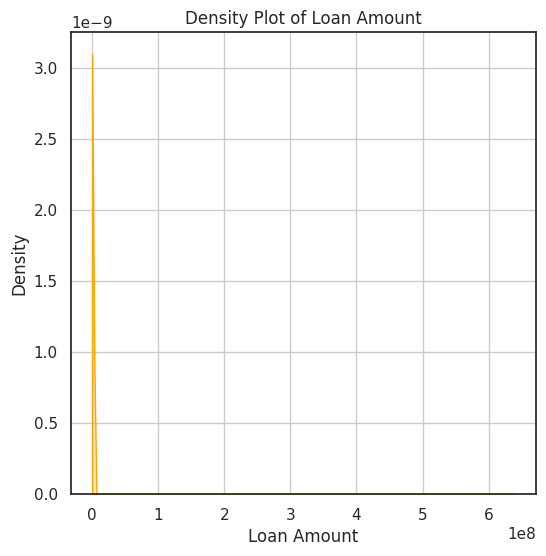

In [ ]:
#Grafica de densidad
# Gráfico de densidad para una representación suavizada de la distribución
plt.figure(figsize=(6, 6))
sns.kdeplot(homeMortgage['loan_amount'], color='orange', shade=True)
plt.xlabel('Loan Amount')
plt.ylabel('Density')
plt.title('Density Plot of Loan Amount')
plt.grid(True)
plt.show()


Eliminando los valores atípicos del conjunto de datos antes de realizar la visualización, habilitando una representación más clara de la distribución sin la influencia de estos valores extremos

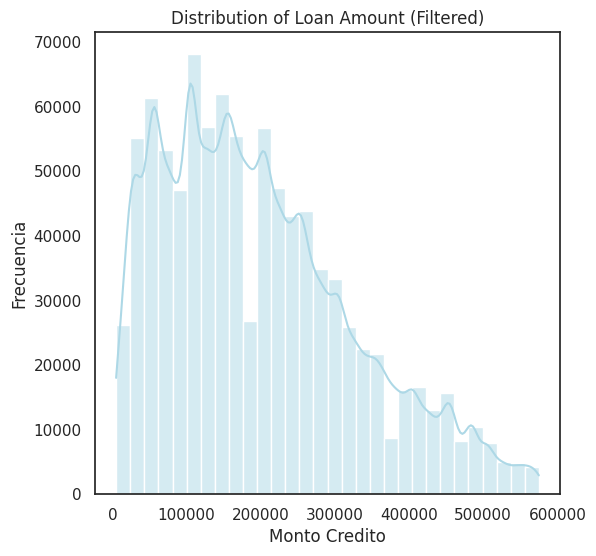

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# TRATANDO DE DEPURAR ATÍPICOS
# Eliminar valores atípicos en 'loan_amount' usando el método de los cuantiles
Q1 = homeMortgage['loan_amount'].quantile(0.25)
Q3 = homeMortgage['loan_amount'].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
homeMortgage_filtered = homeMortgage[homeMortgage['loan_amount'] <= upper_limit]

# Configurar el estilo sin cuadrícula
sns.set_style("white")

# Visualizar la distribución sin valores atípicos
plt.figure(figsize=(6, 6))
sns.histplot(homeMortgage_filtered['loan_amount'], bins=30, kde=True, color=light_blue_color)  # Color azul claro
plt.xlabel('Monto Credito')
plt.ylabel('Frecuencia')
plt.title('Distribution of Loan Amount (Filtered)')
plt.show()


In [ ]:
# Calcular el ingreso promedio después de filtrar los valores atípicos en 'loan_amount'
income_mean = homeMortgage_filtered['income'].mean()

print(f'El ingreso promedio después de filtrar los valores atípicos es: {income_mean}')


El ingreso promedio después de filtrar los valores atípicos es: 132.55942031210756


In [ ]:
# Calcular la mediana del ingreso después de filtrar los valores atípicos en 'loan_amount'
income_median = homeMortgage_filtered['income'].median()

print(f'La mediana del ingreso después de filtrar los valores atípicos es: {income_median}')


La mediana del ingreso después de filtrar los valores atípicos es: 80.0


In [ ]:
#nuevas columnas en el DataFrame 'homeMortgage' que contienen la raíz cuadrada de los valores de las columnas 'income' y 'loan_amount', respectivamente. Esto para transformar las distribuciones de los datos y hacerlas más adecuadas para ciertos análisis o visualizaciones
import numpy as np

# Reemplazar los valores negativos por cero en las columnas 'income' y 'loan_amount'
homeMortgage['income'] = np.maximum(0, homeMortgage['income'])
homeMortgage['loan_amount'] = np.maximum(0, homeMortgage['loan_amount'])

# Calcular la raíz cuadrada de las columnas 'income' y 'loan_amount'
homeMortgage['income_sqrt'] = np.sqrt(homeMortgage['income'])
homeMortgage['loan_amount_sqrt'] = np.sqrt(homeMortgage['loan_amount'])


<ipython-input-69-0863341293c0>:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-69-0863341293c0>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-69-0863341293c0>:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt y

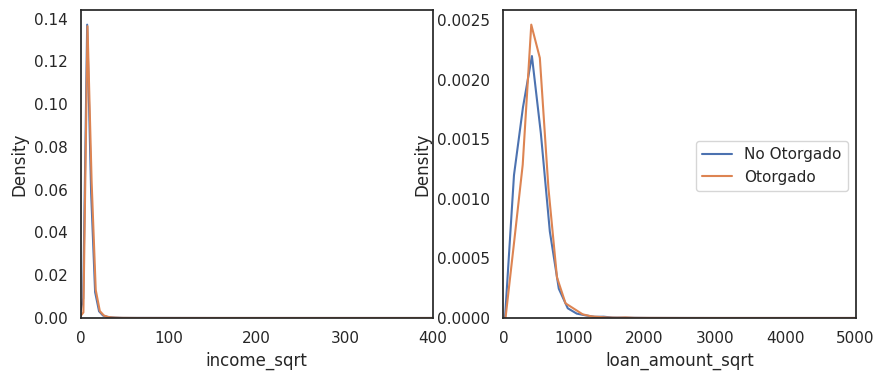

In [ ]:
#COMPARACION DENSIDAD ACTION-TAKEN3
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for action in homeMortgage['action_taken3'].unique():
    sns.distplot(homeMortgage[homeMortgage['action_taken3']==action].income_sqrt,
                 hist=False, kde=True, ax=axes[0])
    sns.distplot(homeMortgage[homeMortgage['action_taken3']==action].loan_amount_sqrt,
                            hist=False, kde=True, label=action, ax=axes[1])

    # Ajustar los límites de los ejes x
axes[0].set_xlim(0, 400)  # Límites del eje x de 0 a 400
axes[1].set_xlim(0, 5000)  # Límites del eje x de 0 a 5000

axes[1].legend(bbox_to_anchor=(1,0.6))
plt.show()

<ipython-input-70-be47ea310e66>:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-70-be47ea310e66>:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-70-be47ea310e66>:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt y

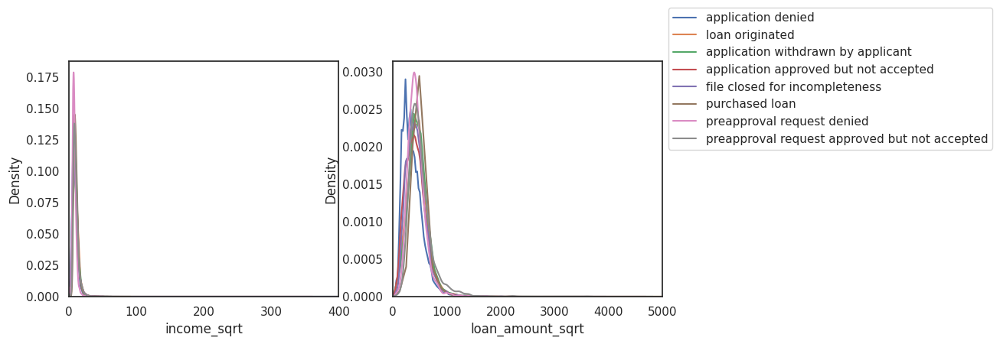

In [ ]:
#cOMPARACION CON ACTION TAKEN
fig, axes = plt.subplots(1, 2, figsize=(10,4))

for action in homeMortgage['action_taken'].unique():
    sns.distplot(homeMortgage[homeMortgage['action_taken']==action].income_sqrt,
                 hist=False, kde=True, ax=axes[0])
    sns.distplot(homeMortgage[homeMortgage['action_taken']==action].loan_amount_sqrt,
                 hist=False, kde=True, label=action, ax=axes[1])

# Ajustar los límites de los ejes x
axes[0].set_xlim(0, 400)  # Límites del eje x de 0 a 400
axes[1].set_xlim(0, 5000)  # Límites del eje x de 0 a 5000

axes[1].legend(bbox_to_anchor=(1,0.6))
plt.show()


In [ ]:
from scipy import stats
dist_0 = homeMortgage[homeMortgage['action_taken3']=='Otorgado']['income_sqrt']
dist_1 = homeMortgage[homeMortgage['action_taken3']=='No Otorgado']['income_sqrt']

stat, p_value = stats.ttest_ind(dist_0, dist_1, equal_var=False)
print("Stat/P-value: (", round(stat, 2), ',', p_value, ")")

Stat/P-value: ( nan , nan )


El resultado  de la prueba t es una estadística de prueba (t-valor) de aproximadamente 60.61 y un valor p muy pequeño, aproximadamente 0.0.

Este resultado indica que hay una diferencia significativa entre las medias de las distribuciones de ingresos para los casos de préstamos otorgados y no otorgados. Con un valor p tan pequeño, se rechaza la hipótesis nula de que las medias de las dos distribuciones son iguales. En su lugar, se acepta la hipótesis alternativa de que las medias son diferentes. El resultado sugiere que el ingreso puede ser un factor importante en la decisión de otorgar o no un préstamo

# ALGUNAS CORRELACIONES EN GRAFICAS DE DISPERSION

Para UNA MUESTRA DE 5000

In [ ]:
# for better visualization or faster calculation
def homeMortgage_reducer(homeMortgage, size):
    indice = np.random.choice(list(homeMortgage.index), size, replace=False)
    return homeMortgage.loc[indice]

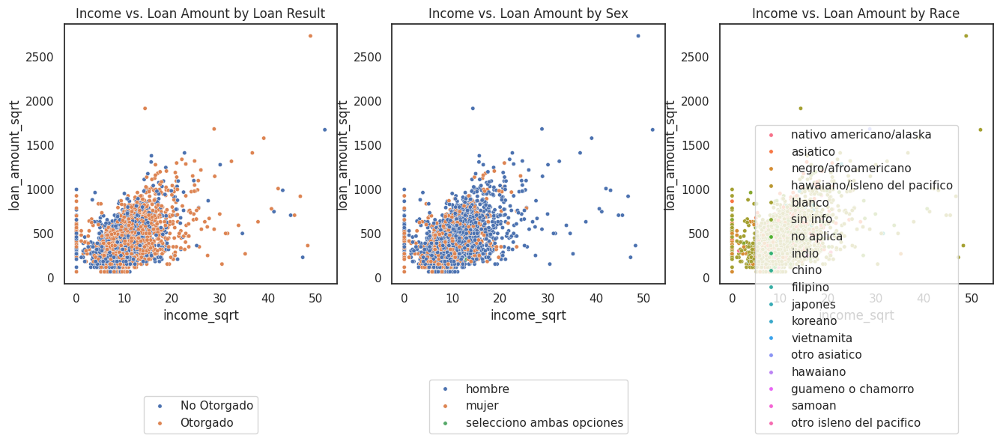

In [ ]:
# relación entre la raíz cuadrada del ingreso (income_sqrt) y la raíz cuadrada del monto del préstamo (loan_amount_sqrt).
#Los puntos se colorean según diferentes variables: action_taken3 (resultado del préstamo), applicant_sex (sexo del solicitante) y applicant_race_1 (raza del solicitante).
reduced_df = homeMortgage_reducer(homeMortgage, 5000)

# income vs. loan amount by sex and race
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="action_taken3", s=15, ax=axes[0])
axes[0].set_title("Income vs. Loan Amount by Loan Result", fontsize=12)
axes[0].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="applicant_sex", s=15, ax=axes[1])
axes[1].set_title("Income vs. Loan Amount by Sex", fontsize=12)
axes[1].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="applicant_race_1", s=15, ax=axes[2])
axes[2].set_title("Income vs. Loan Amount by Race", fontsize=12)
axes[2].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

plt.show()

<ipython-input-74-9cd7cd45f1b5>:6: UserWarning:


The palette list has fewer values (16) than needed (18) and will cycle, which may produce an uninterpretable plot.



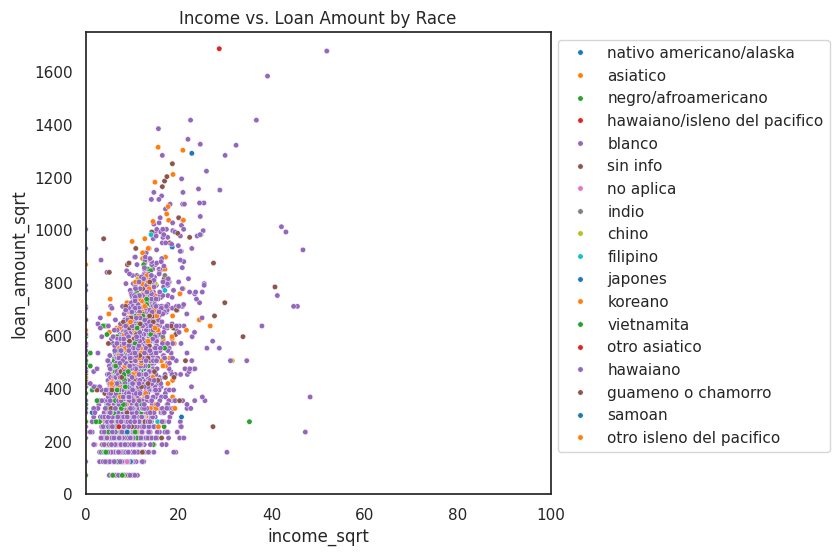

In [ ]:
# Definir una paleta de colores personalizada
custom_palette = sns.color_palette("tab10", len(reduced_df['applicant_race_1'].unique()))

# income vs. loan amount by sex and race
plt.figure(figsize=(6, 6))
sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="applicant_race_1", s=15, palette=custom_palette)
plt.title("Income vs. Loan Amount by Race", fontsize=12)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

# Establecer límites de los ejes x e y
plt.xlim(0, 100)  # Establecer límite x de 0 a 100
plt.ylim(0, 1750) # Establecer límite y de 0 a 1750

plt.show()




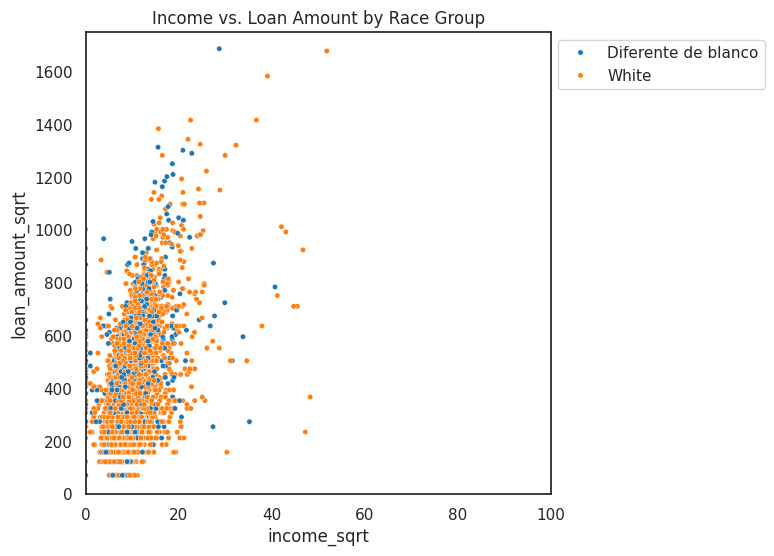

In [ ]:
# Crear una nueva columna para la agrupación según la raza
reduced_df['race_group'] = reduced_df['applicant_race_1'].apply(lambda x: 'White' if x == 'blanco' else 'Diferente de blanco')

# Definir una paleta de colores personalizada
custom_palette = sns.color_palette("tab10", 2)  # Dos colores: uno para 'White' y otro para 'Other'

# income vs. loan amount by sex and race
plt.figure(figsize=(6, 6))
sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="race_group", s=15, palette=custom_palette)
plt.title("Income vs. Loan Amount by Race Group", fontsize=12)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

# Establecer límites de los ejes x e y
plt.xlim(0, 100)  # Establecer límite x de 0 a 100
plt.ylim(0, 1750) # Establecer límite y de 0 a 1750

plt.show()


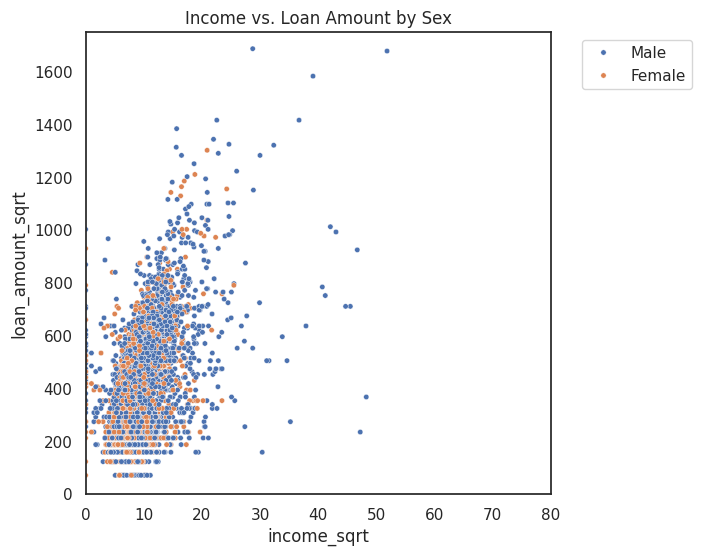

In [ ]:
# Crear una nueva columna para la agrupación según el sexo
reduced_df['sex_group'] = reduced_df['applicant_sex'].apply(lambda x: 'Male' if x == 'hombre' else 'Female')

# Definir una paleta de colores personalizada
custom_palette = sns.color_palette("tab10", 2)  # Dos colores: uno para 'Male' y otro para 'Female'

# income vs. loan amount by sex
plt.figure(figsize=(6, 6))

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=reduced_df, hue="sex_group", s=15)
plt.title("Income vs. Loan Amount by Sex", fontsize=12)
plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center')

# Colocar la leyenda al lado derecho
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Establecer límites de los ejes x e y
plt.xlim(0, 80)  # Establecer límite x de 0 a 100
plt.ylim(0, 1750) # Establecer límite y de 0 a 1750

plt.show()


Losingresos más altos y el monto del préstamo ayudan a los solicitantes a obtener sus préstamos hipotecarios. Existe un patrón en el que las mujeres tienen menos probabilidades de obtener la aprobación de sus préstamos que los hombres, incluso si la visualización no está equilibrada por categorías. Además, la población negra tiene menos posibilidades de obtener sus préstamos hipotecarios. Sin embargo, todas estas categorías no son decisivamente fuertes.

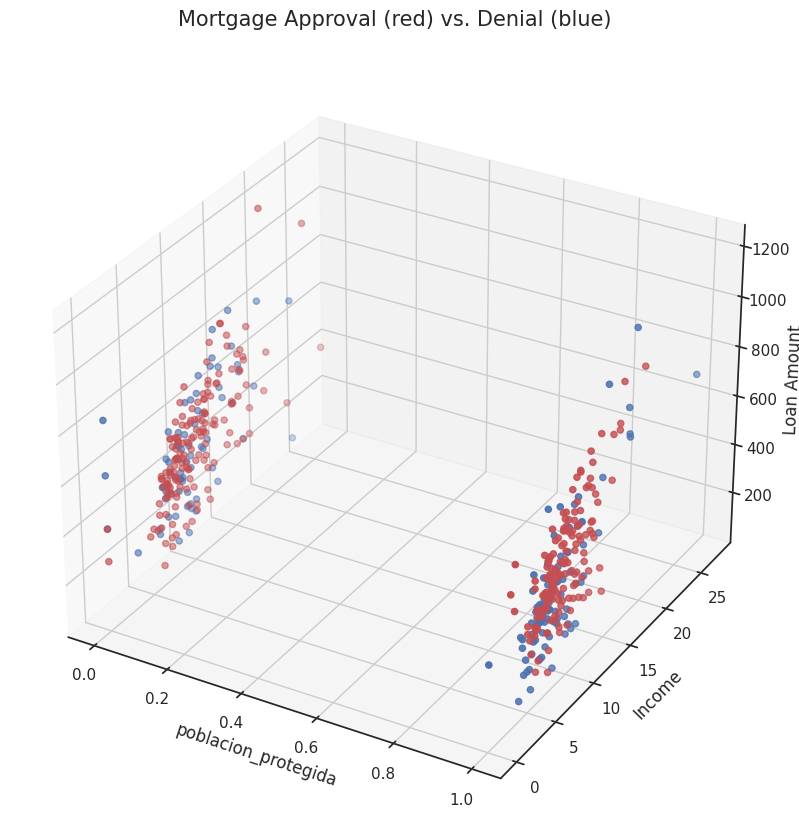

In [ ]:
reduced_df = homeMortgage_reducer(homeMortgage, 500)

# comment out for interactive plotting
# %matplotlib notebook

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')

actions = reduced_df['action_taken3'].unique()
ranges = [('r', actions[0]), ('b', actions[1])]

for c, action in ranges:
    xs = reduced_df[reduced_df['action_taken3']==action]['poblacion_protegida']
    ys = reduced_df[reduced_df['action_taken3']==action]['income_sqrt']
    zs = reduced_df[reduced_df['action_taken3']==action]['loan_amount_sqrt']
    ax.scatter(xs, ys, zs, c=c, s=20)  # Ajusta el tamaño de los puntos (s)

ax.set_title('Mortgage Approval (red) vs. Denial (blue)\n', fontsize=15)
ax.set_xlabel('poblacion_protegida')
ax.set_ylabel('Income')
ax.set_zlabel('Loan Amount')

plt.show()


En cuanto a la alta tasa por sexo, es bastante claro agrupar ciertas clases. Por ejemplo, es muy probable que se rechace una solicitud de alta tasa de población minoritaria/bajos ingresos/bajo monto de préstamo. El problema es cuando la tasa de población minoritaria es baja, donde los puntos se mezclan. En otras palabras, el monto del préstamo y los ingresos pierden su nitidez para dividir las clases en grupos cuando el factor racial se vuelve leve.

PARA EL DATA SET COMPLETO

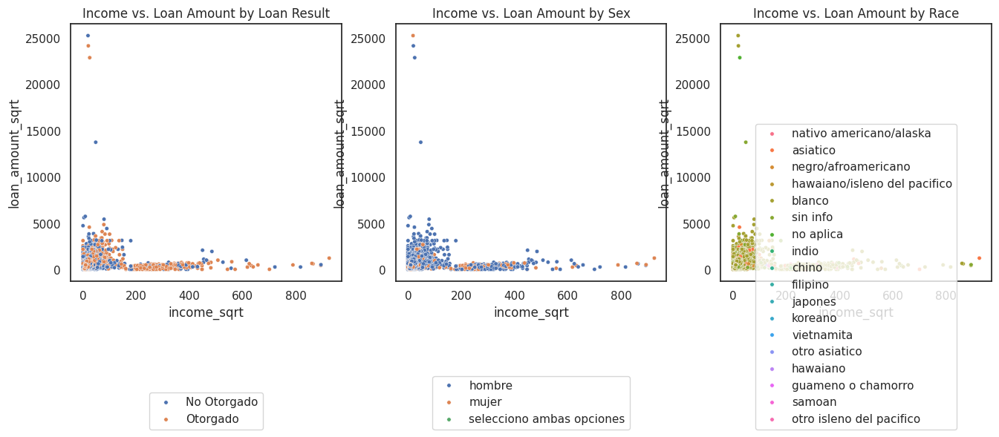

In [ ]:
# Para Homemortage completo
# income vs. loan amount by sex and race
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="action_taken3", s=15, ax=axes[0])
axes[0].set_title("Income vs. Loan Amount by Loan Result", fontsize=12)
axes[0].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="applicant_sex", s=15, ax=axes[1])
axes[1].set_title("Income vs. Loan Amount by Sex", fontsize=12)
axes[1].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="applicant_race_1", s=15, ax=axes[2])
axes[2].set_title("Income vs. Loan Amount by Race", fontsize=12)
axes[2].legend(bbox_to_anchor=(0.5, -0.6), loc=8)

plt.show()

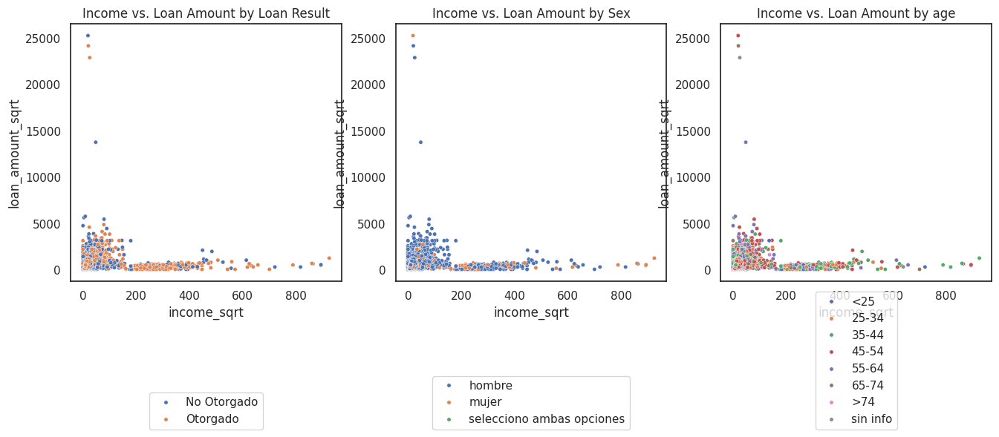

In [ ]:
# Para Homemortage completo
# income vs. loan amount by sex and race
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="action_taken3", s=15, ax=axes[0])
axes[0].set_title("Income vs. Loan Amount by Loan Result", fontsize=12)
axes[0].legend(bbox_to_anchor=(0.5, -0.6), loc="lower center")

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="applicant_sex", s=15, ax=axes[1])
axes[1].set_title("Income vs. Loan Amount by Sex", fontsize=12)
axes[1].legend(bbox_to_anchor=(0.5, -0.6), loc="lower center")

sns.scatterplot(x="income_sqrt", y="loan_amount_sqrt",
                data=homeMortgage, hue="applicant_age", s=15, ax=axes[2])
axes[2].set_title("Income vs. Loan Amount by age", fontsize=12)
axes[2].legend(bbox_to_anchor=(0.5, -0.6), loc="lower center")

plt.show()


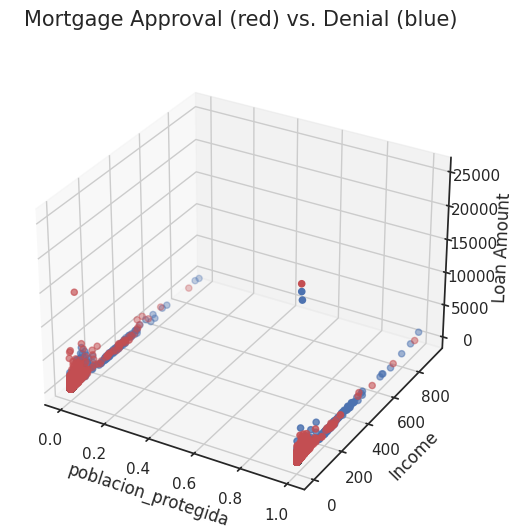

In [ ]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

actions = homeMortgage['action_taken3'].unique()
ranges = [('r', actions[0]), ('b', actions[1])]

for c, action in ranges:
    xs = homeMortgage[homeMortgage['action_taken3']==action]['poblacion_protegida']
    ys = homeMortgage[homeMortgage['action_taken3']==action]['income_sqrt']
    zs = homeMortgage[homeMortgage['action_taken3']==action]['loan_amount_sqrt']
    ax.scatter(xs, ys, zs, c=c, s=20)  # Ajusta el tamaño de los puntos (s)

ax.set_title('Mortgage Approval (red) vs. Denial (blue)\n', fontsize=15)
ax.set_xlabel('poblacion_protegida')
ax.set_ylabel('Income')
ax.set_zlabel('Loan Amount')

plt.show()


# HEAT MAP VARIABLES SENSIBLES

HEAT MAP RAZA

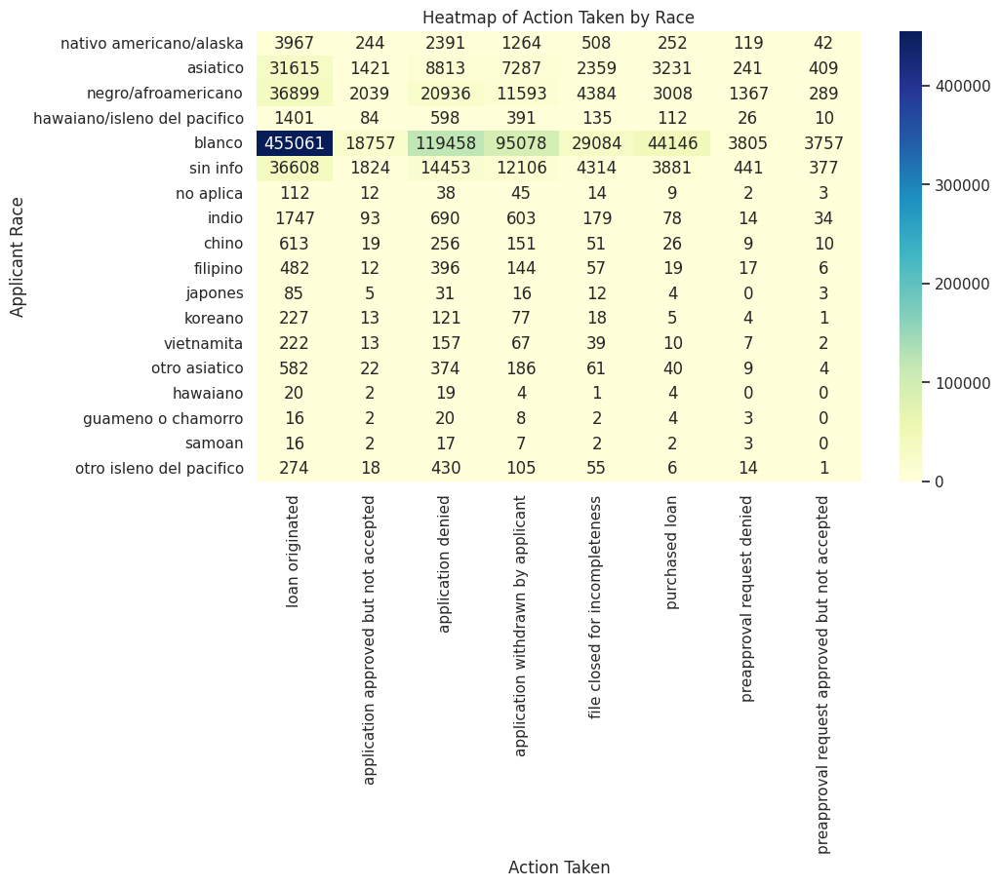

In [ ]:
#HEAT MAP PARA RAZA CON RELACION A LA BASE TOTAL
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia
contingency_table = pd.crosstab(homeMortgage['applicant_race_1'], homeMortgage['action_taken'])

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Race')
plt.title('Heatmap of Action Taken by Race')
plt.show()


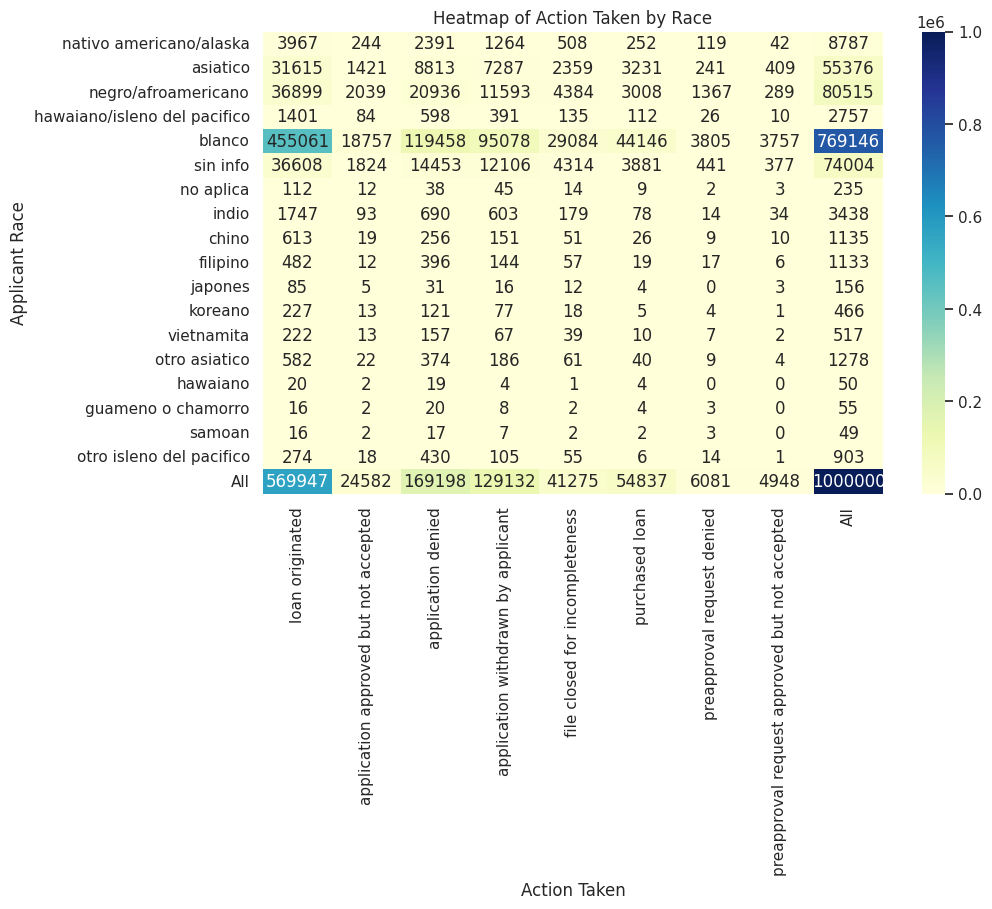

In [ ]:
#HEAT MAP PARA RAZA CON RELACION A LA BASE TOTAL INCLUYENDO FILA ALL
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia con los totales
contingency_table = pd.crosstab(homeMortgage['applicant_race_1'], homeMortgage['action_taken'], margins=True)

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Race')
plt.title('Heatmap of Action Taken by Race')
plt.show()


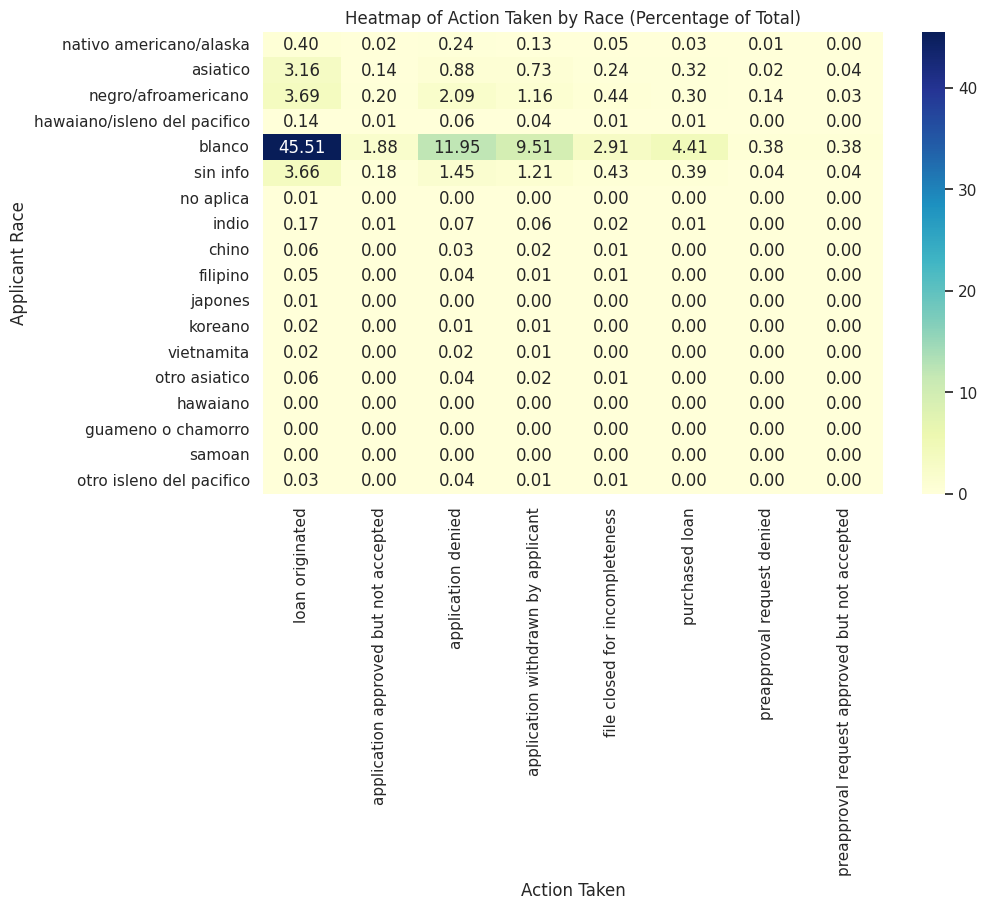

In [ ]:
#Heat MAP : % Relacionadas a toda la muestra
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia para toda la muestra
contingency_table_total = pd.crosstab(homeMortgage['applicant_race_1'], homeMortgage['action_taken'], normalize='all') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_total, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Race')
plt.title('Heatmap of Action Taken by Race (Percentage of Total)')
plt.show()


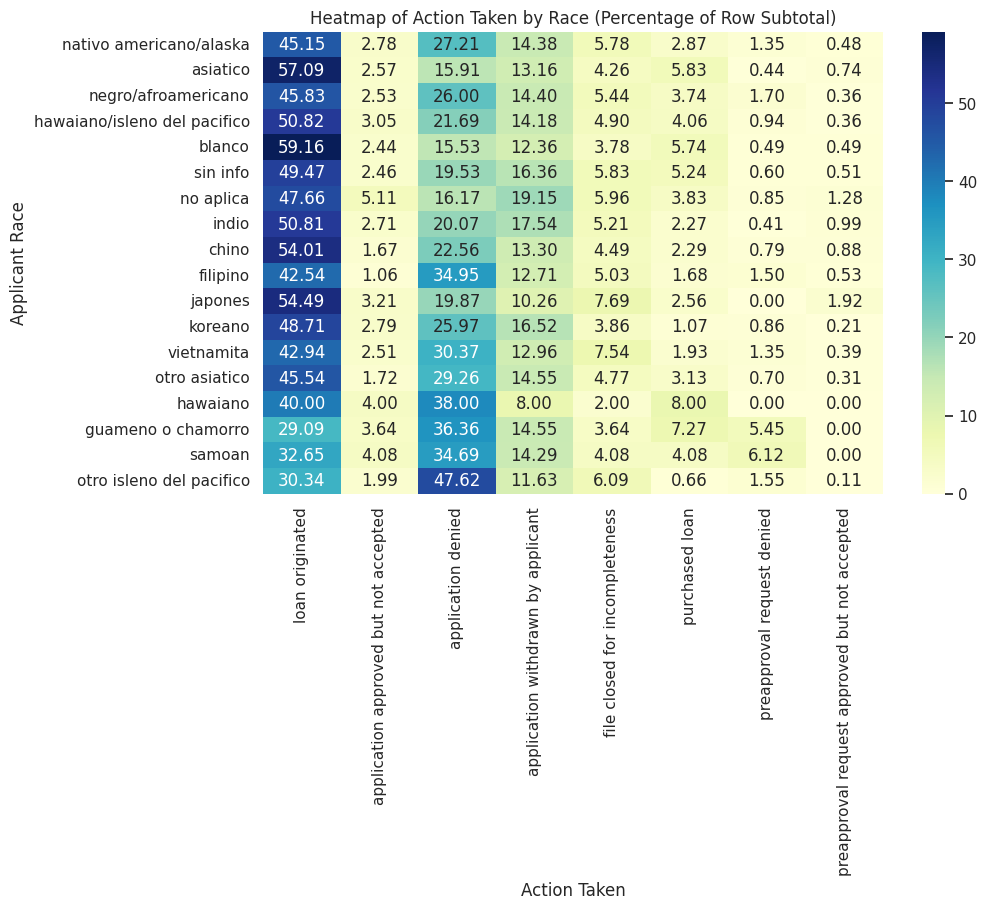

In [ ]:
#Heat MAP : % Relacionadas CON LA SUBMUESTRA, % DE APROBACION FRENTE A SOLO LO SOLICITADO POR SUBGRUPO
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['applicant_race_1'], homeMortgage['action_taken'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Race')
plt.title('Heatmap of Action Taken by Race (Percentage of Row Subtotal)')
plt.show()



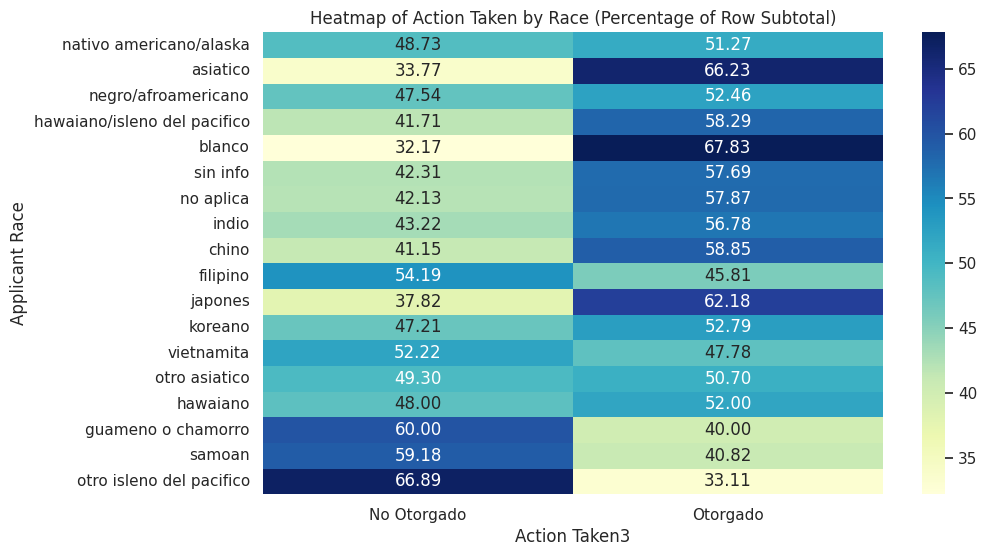

In [ ]:
#Heat MAP : % Relacionadas CON LA SUBMUESTRA, % DE APROBACION FRENTE A SOLO LO SOLICITADO POR SUBGRUPO
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['applicant_race_1'], homeMortgage['action_taken3'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken3')
plt.ylabel('Applicant Race')
plt.title('Heatmap of Action Taken by Race (Percentage of Row Subtotal)')
plt.show()

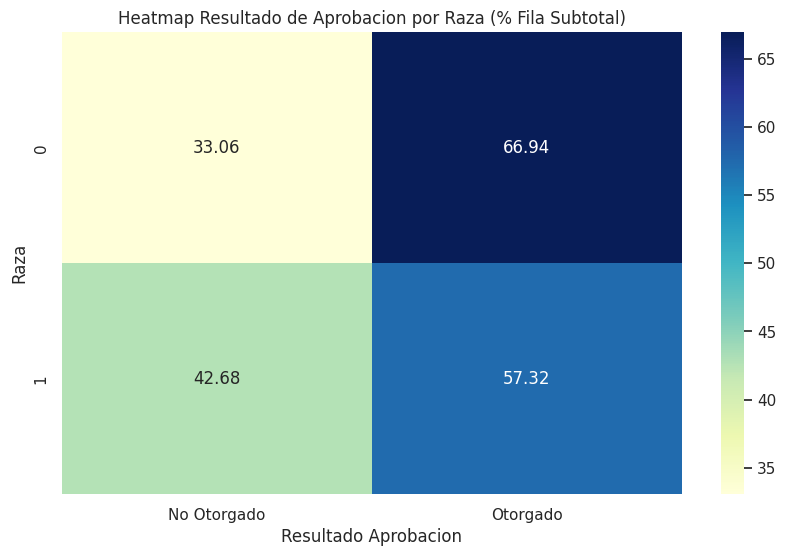

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['protegido_raza'], homeMortgage['action_taken3'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Resultado Aprobacion')
plt.ylabel('Raza')
plt.title('Heatmap Resultado de Aprobacion por Raza (% Fila Subtotal)')
plt.show()


HEAT MAP EDAD

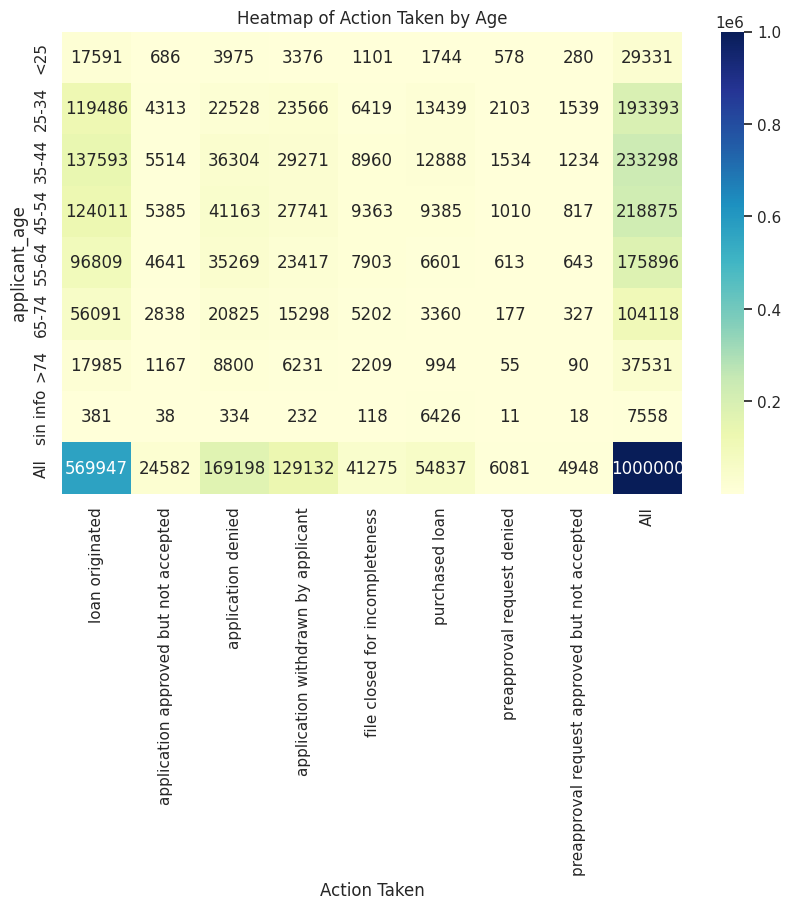

In [ ]:
#HEAT MAP PARA RAZA CON RELACION A LA BASE TOTAL INCLUYENDO FILA ALL
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia con los totales
contingency_table = pd.crosstab(homeMortgage['applicant_age'], homeMortgage['action_taken'], margins=True)

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('applicant_age')
plt.title('Heatmap of Action Taken by Age')
plt.show()

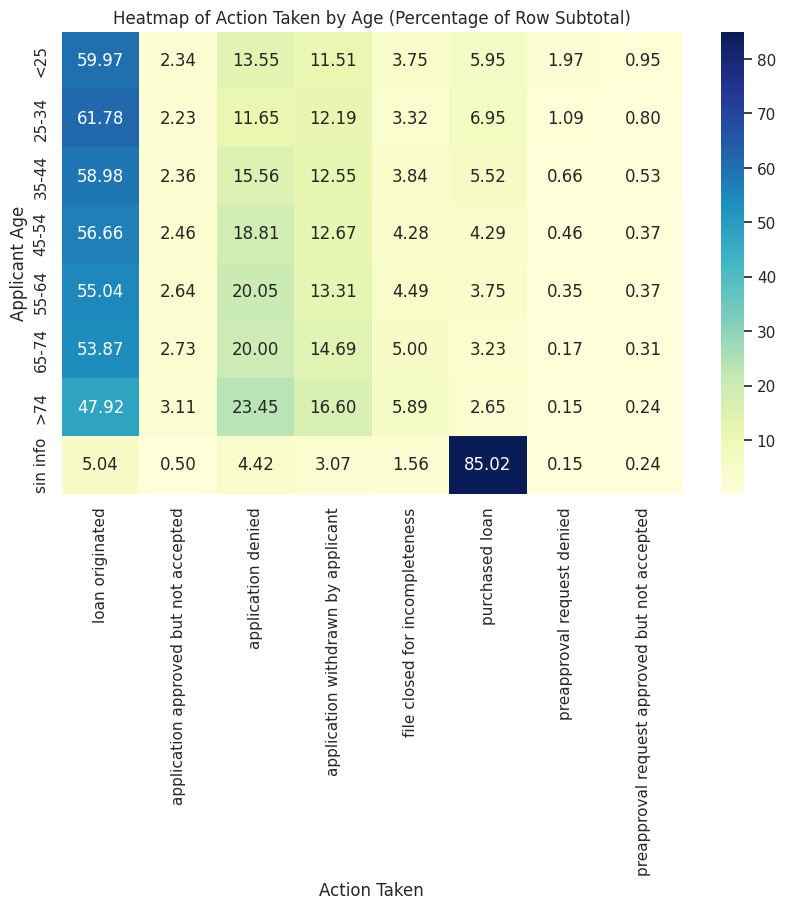

In [ ]:
#Heat MAP : % Relacionadas CON LA SUBMUESTRA, % DE APROBACION FRENTE A SOLO LO SOLICITADO POR SUBGRUPO
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['applicant_age'], homeMortgage['action_taken'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Age')
plt.title('Heatmap of Action Taken by Age (Percentage of Row Subtotal)')
plt.show()

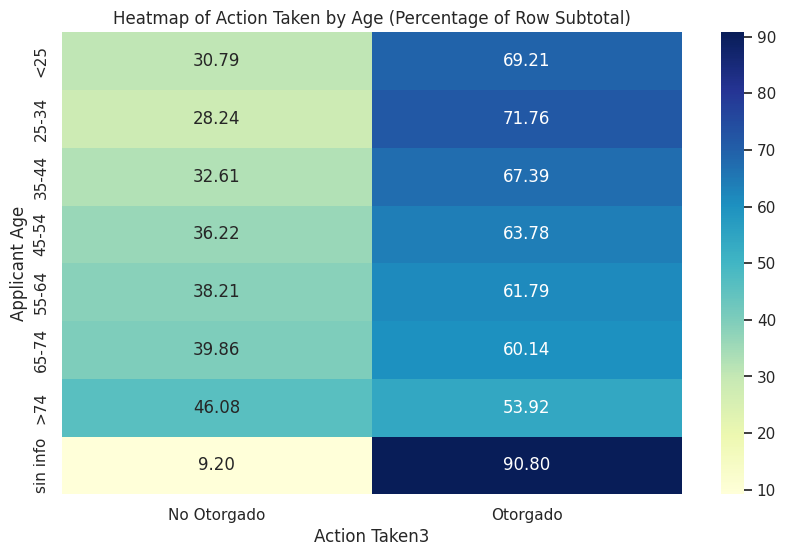

In [ ]:
#Heat MAP : % Relacionadas CON LA SUBMUESTRA, % DE APROBACION FRENTE A SOLO LO SOLICITADO POR SUBGRUPO
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['applicant_age'], homeMortgage['action_taken3'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken3')
plt.ylabel('Applicant Age')
plt.title('Heatmap of Action Taken by Age (Percentage of Row Subtotal)')
plt.show()

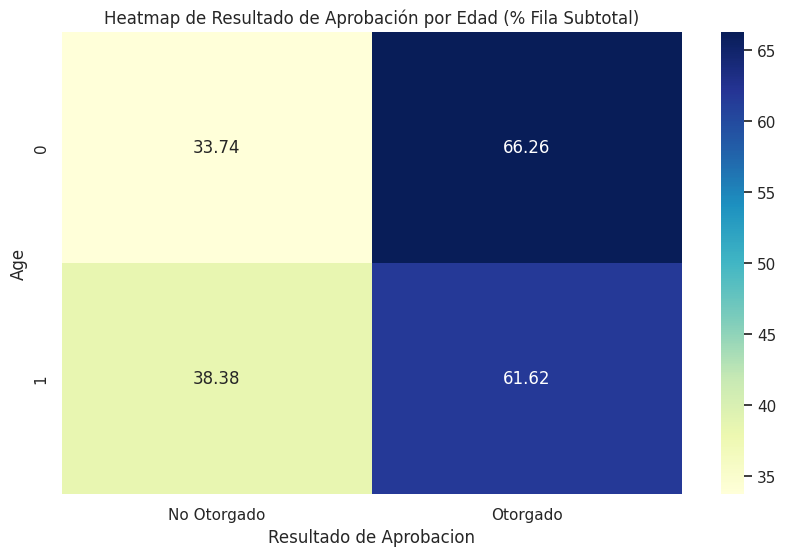

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['protegido_edad'], homeMortgage['action_taken3'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Resultado de Aprobacion')
plt.ylabel('Age')
plt.title('Heatmap de Resultado de Aprobación por Edad (% Fila Subtotal)')
plt.show()

HEAT MAP POR SEXO

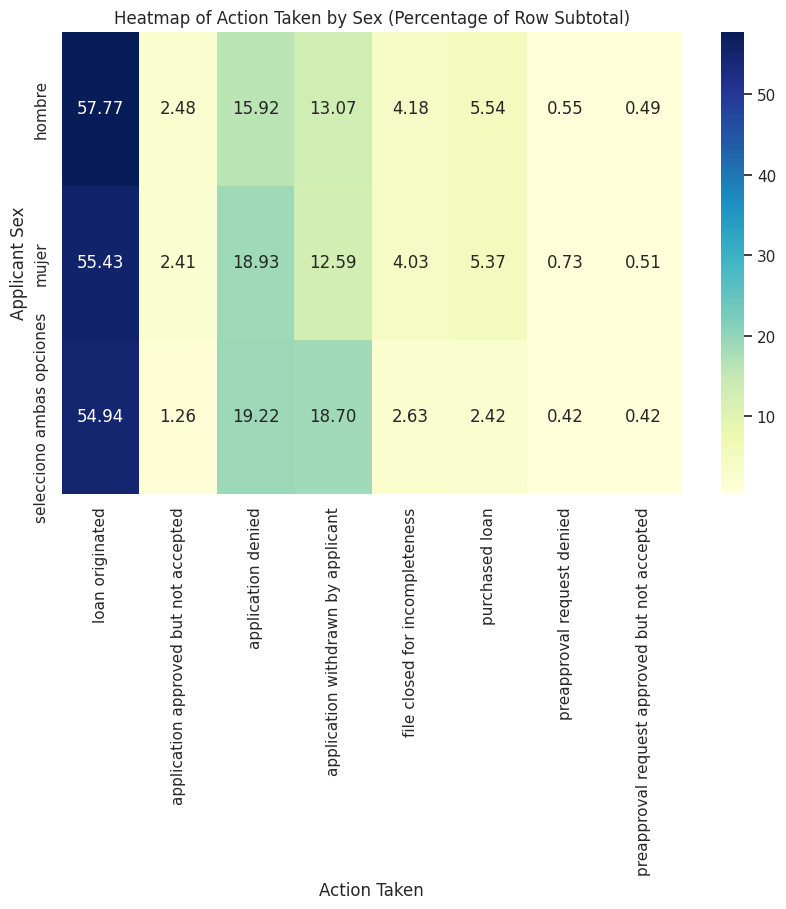

In [ ]:
#Heat MAP : % Relacionadas CON LA SUBMUESTRA, % DE APROBACION FRENTE A SOLO LO SOLICITADO POR SUBGRUPO
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['applicant_sex'], homeMortgage['action_taken'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Action Taken')
plt.ylabel('Applicant Sex')
plt.title('Heatmap of Action Taken by Sex (Percentage of Row Subtotal)')
plt.show()

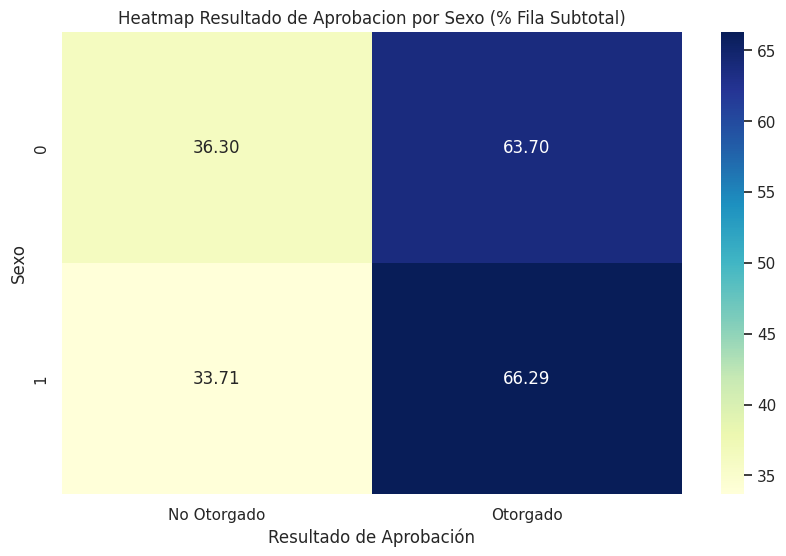

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia normalizada por fila
contingency_table_subtotal_row = pd.crosstab(homeMortgage['no_protegido_hombre'], homeMortgage['action_taken3'], normalize='index') * 100

# Graficar un heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_subtotal_row, annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Resultado de Aprobación')
plt.ylabel('Sexo')
plt.title('Heatmap Resultado de Aprobacion por Sexo (% Fila Subtotal)')
plt.show()

# ANALISIS PROPOSITOS DEL CREDITO HIPOTECARIO

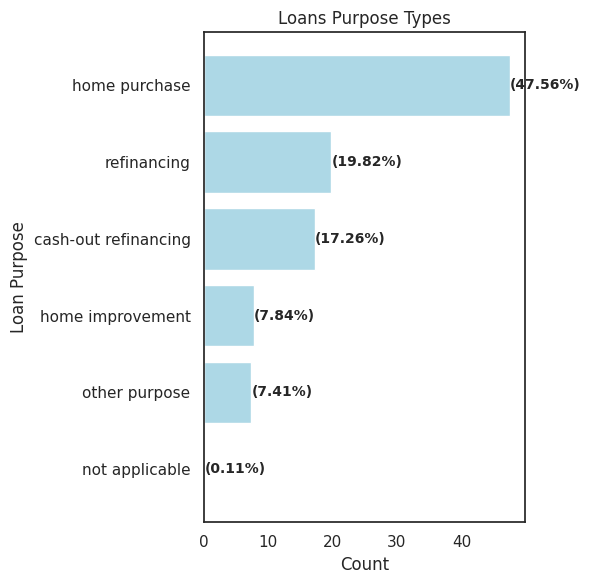

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

fillColor2 = "#808080"  # Código de color para gris

# Filtrar los valores no nulos en 'loan_purpose_name'
filtered_data = homeMortgage.dropna(subset=['loan_purpose'])

# Calcular el recuento por 'loan_purpose_name'
loan_purpose_counts = filtered_data['loan_purpose'].value_counts().reset_index()
loan_purpose_counts.columns = ['loan_purpose', 'CountLoanPurpose']

# Calcular el porcentaje
loan_purpose_counts['percentage'] = (loan_purpose_counts['CountLoanPurpose'] / loan_purpose_counts['CountLoanPurpose'].sum()) * 100

# Reordenar 'loan_purpose_name' por porcentaje de mayor a menor
loan_purpose_counts = loan_purpose_counts.sort_values(by='percentage', ascending=True)
loan_purpose_counts['loan_purpose'] = pd.Categorical(loan_purpose_counts['loan_purpose'], categories=loan_purpose_counts['loan_purpose'])

# Crear el gráfico de barras
plt.figure(figsize=(6, 6), facecolor='white')  # Establecer el color de fondo a blanco
bars = plt.barh(loan_purpose_counts['loan_purpose'], loan_purpose_counts['percentage'], color=light_blue_color)

# Anotaciones de porcentaje
for bar, percentage in zip(bars, loan_purpose_counts['percentage']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f"({round(percentage, 2)}%)",
             va='center', fontsize=10, fontweight='bold')

plt.xlabel('Count')
plt.ylabel('Loan Purpose')
plt.title('Loans Purpose Types')
plt.grid(True, linestyle='--', alpha=0.6)

# Configurar el estilo sin cuadrícula
sns.set_style("white")
# Eliminar la cuadrícula
plt.grid(False)


plt.tight_layout()
plt.show()


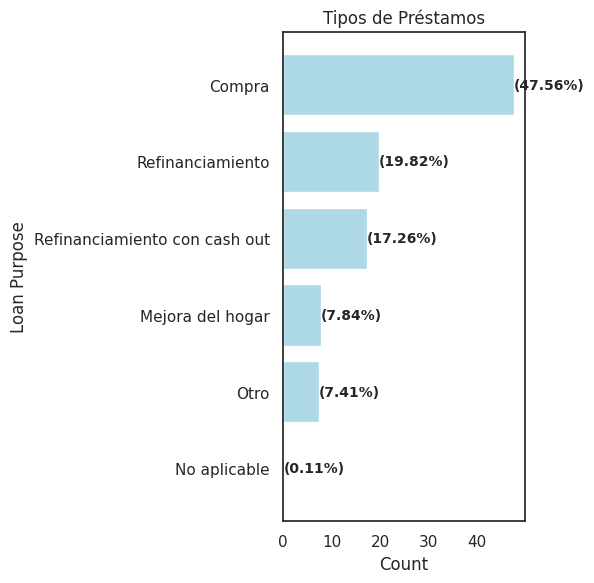

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear un diccionario para mapear nombres en inglés a nombres en español
traduccion = {
    'home purchase': 'Compra',
    'refinancing': 'Refinanciamiento',
    'cash-out refinancing': 'Refinanciamiento con cash out',
    'home improvement': 'Mejora del hogar',
    'other purpose': 'Otro',
    'not applicable': 'No aplicable'
}

fillColor2 = "#808080"  # Código de color para gris

# Filtrar los valores no nulos en 'loan_purpose_name'
filtered_data = homeMortgage.dropna(subset=['loan_purpose'])

# Calcular el recuento por 'loan_purpose_name'
loan_purpose_counts = filtered_data['loan_purpose'].value_counts().reset_index()
loan_purpose_counts.columns = ['loan_purpose', 'CountLoanPurpose']

# Calcular el porcentaje
loan_purpose_counts['percentage'] = (loan_purpose_counts['CountLoanPurpose'] / loan_purpose_counts['CountLoanPurpose'].sum()) * 100

# Reemplazar nombres en inglés por nombres en español
loan_purpose_counts['loan_purpose'] = loan_purpose_counts['loan_purpose'].map(traduccion)

# Reordenar 'loan_purpose_name' por porcentaje de mayor a menor
loan_purpose_counts = loan_purpose_counts.sort_values(by='percentage', ascending=True)
loan_purpose_counts['loan_purpose'] = pd.Categorical(loan_purpose_counts['loan_purpose'], categories=loan_purpose_counts['loan_purpose'])

# Crear el gráfico de barras
plt.figure(figsize=(6, 6), facecolor='white')  # Establecer el color de fondo a blanco
bars = plt.barh(loan_purpose_counts['loan_purpose'], loan_purpose_counts['percentage'], color=light_blue_color)

# Anotaciones de porcentaje
for bar, percentage in zip(bars, loan_purpose_counts['percentage']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f"({round(percentage, 2)}%)",
             va='center', fontsize=10, fontweight='bold')

plt.xlabel('Count')
plt.ylabel('Loan Purpose')
plt.title('Tipos de Préstamos')
plt.grid(True, linestyle='--', alpha=0.6)

# Configurar el estilo sin cuadrícula
sns.set_style("white")
# Eliminar la cuadrícula
plt.grid(False)

plt.tight_layout()
plt.show()


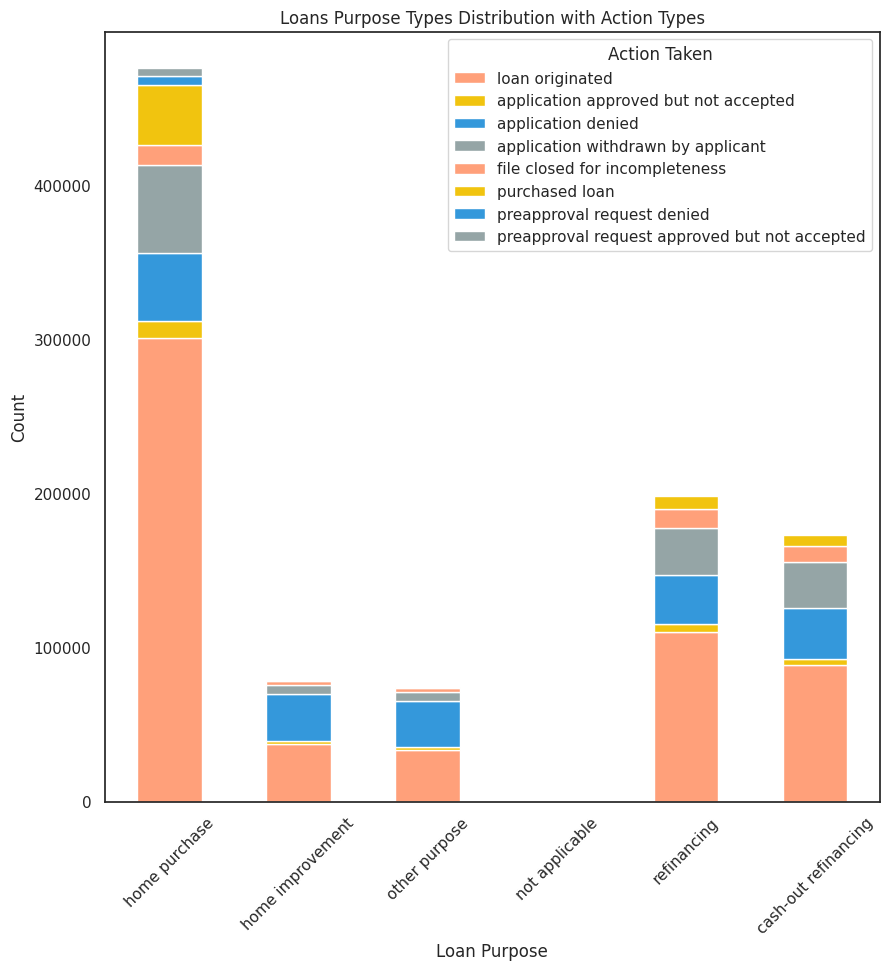

In [ ]:
##Home Purchase** and **Refinancing** are the major Loan Purpose types.
##Loan purpose types and their actions
#The following bar graph shows the Loan Purpose Types along with the different actions.

import matplotlib.pyplot as plt

# Suponiendo que tienes un DataFrame llamado 'homeMortgage' en Python
# y deseas realizar un gráfico similar al proporcionado en R

# Filtrar filas donde 'loan_purpose_name' no sea nulo
filtered_df = homeMortgage[~homeMortgage['loan_purpose'].isna()]

# Crear una agrupación y resumen
grouped_df = filtered_df.groupby(['loan_purpose', 'action_taken'])['action_taken'].count().unstack(fill_value=0)

# Crear el gráfico de barras apiladas
grouped_df.plot(kind='bar', stacked=True, color=['#FFA07A', '#F1C40F', '#3498DB', '#95A5A6'])
plt.xlabel('Loan Purpose')
plt.ylabel('Count')
plt.title('Loans Purpose Types Distribution with Action Types')
plt.legend(title='Action Taken', loc='upper right')
plt.xticks(rotation=45)
plt.show()


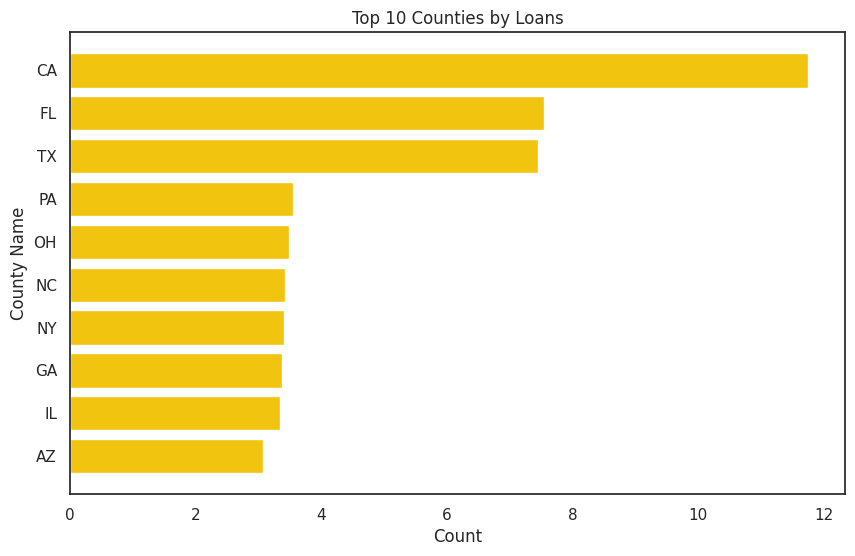

In [ ]:
#County types
#We investigate the different County Types associated with the loans.
##Top 10 Counties distribution
#We display the Top 10 Counties associated with loans.

import pandas as pd
import matplotlib.pyplot as plt

# Filtrar filas donde 'county_name' no sea nulo
filtered_df = homeMortgage[~homeMortgage['state_code'].isna()]

# Crear una agrupación y resumen
grouped_df = filtered_df.groupby('state_code')['state_code'].count().reset_index(name='CountLoanPurpose')

# Calcular el porcentaje
grouped_df['Percentage'] = (grouped_df['CountLoanPurpose'] / grouped_df['CountLoanPurpose'].sum()) * 100

# Ordenar por porcentaje en orden descendente y seleccionar las 10 principales
top_counties = grouped_df.sort_values(by='Percentage', ascending=False).head(10)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(top_counties['state_code'], top_counties['Percentage'], color='#F1C40F')
plt.xlabel('Count')
plt.ylabel('County Name')
plt.title('Top 10 Counties by Loans')
plt.gca().invert_yaxis()  # Invertir el eje Y para que el mayor esté arriba
plt.show()

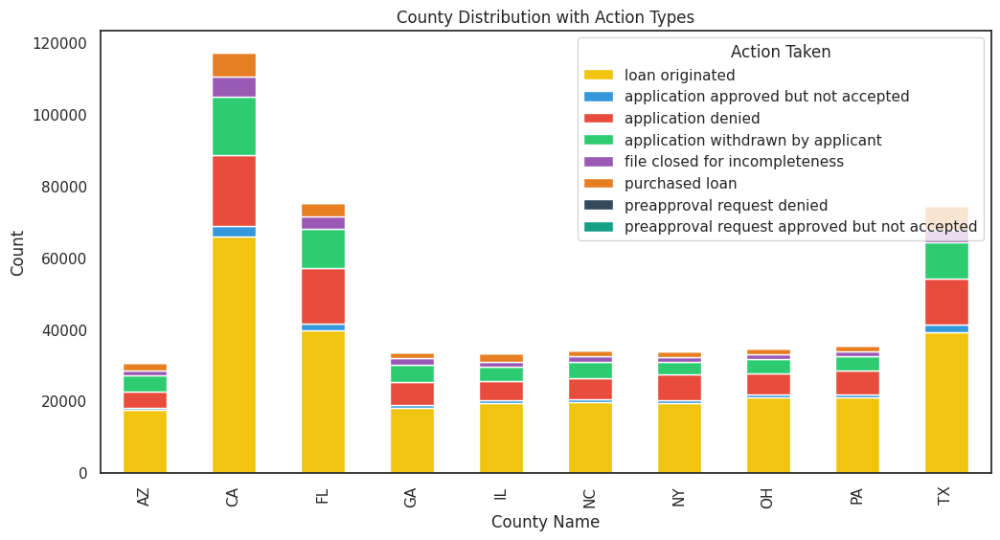

In [ ]:
##Counties and Loan distribution
#We display the Counties and the Loans Type distribution.

import pandas as pd
import matplotlib.pyplot as plt

# Filtrar filas donde 'county_name' no sea nulo
filtered_df = homeMortgage[~homeMortgage['state_code'].isna()]

# Crear el DataFrame 'Top10Counties'
top_counties = (
    filtered_df.groupby('state_code')
    .size()
    .reset_index(name='CountLoanPurpose')
    .assign(percentage=lambda x: (x['CountLoanPurpose'] / x['CountLoanPurpose'].sum()) * 100)
    .sort_values(by='percentage', ascending=False)
    .head(10)
)

# Filtrar el DataFrame original por los 10 condados principales
filtered_top_counties = filtered_df[filtered_df['state_code'].isin(top_counties['state_code'])]

# Crear el gráfico de barras apiladas
pivot_df = (
    filtered_top_counties.groupby(['state_code', 'action_taken'])
    .size()
    .unstack(fill_value=0)
)

colors = ['#F1C40F', '#3498DB', '#E74C3C', '#2ECC71', '#9B59B6', '#E67E22', '#34495E', '#16A085', '#D35400', '#27AE60']

ax = pivot_df.plot(kind='bar', stacked=True, color=colors, figsize=(12, 6))

plt.xlabel('County Name')
plt.ylabel('Count')
plt.title('County Distribution with Action Types')
plt.legend(title='Action Taken', loc='upper right')
plt.show()

Loan purpose types and their actions

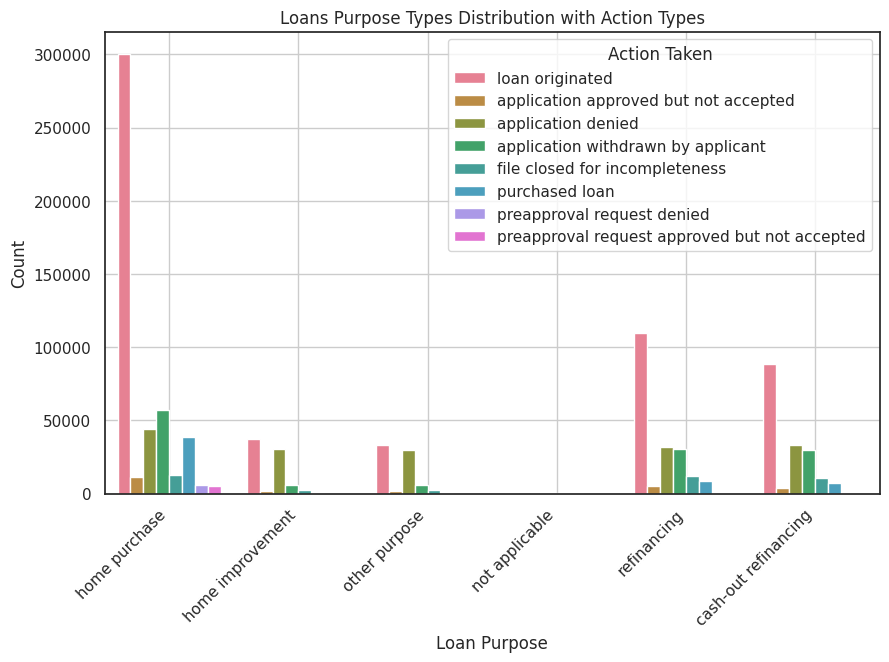

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar los datos para excluir filas donde loan_purpose_name es NaN
filtered_data = homeMortgage.dropna(subset=['loan_purpose'])

# Agrupar por loan_purpose_name y action_taken_name y contar la frecuencia
grouped_data = filtered_data.groupby(['loan_purpose', 'action_taken']).size().reset_index(name='CountLoanPurpose')

# Definir una paleta de colores personalizada para las diferentes categorías de acción tomada
palette = sns.color_palette("husl", len(grouped_data['action_taken'].unique()))

# Trazar el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x='loan_purpose', y='CountLoanPurpose', hue='action_taken', palette=palette)
plt.xlabel('Loan Purpose')
plt.ylabel('Count')
plt.title('Loans Purpose Types Distribution with Action Types')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.legend(title='Action Taken')
plt.show()


In [ ]:
 #property_value                        782201 non-null   float64
 #construction_method                   1000000 non-null  category
 #ccupancy_type                        1000000 non-null  category
  #manufactured_home_secured_proper      1000000 non-null  category
 #manufactured_home_land_property_      1000000 non-null  category
 #multifamily_affordable_units          212 non-null      float64

# TIPO DE PROPIEDAD

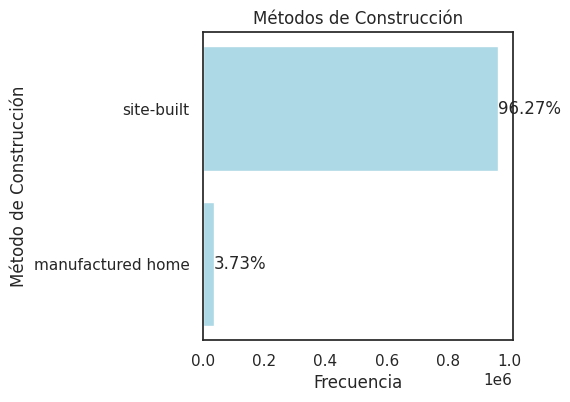

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'construction_method'
construction_method_counts = homeMortgage['construction_method'].value_counts()

# Calcular el porcentaje de cada categoría
total_samples = construction_method_counts.sum()
percentages = (construction_method_counts / total_samples) * 100

# Crear el gráfico de barras horizontales
plt.figure(figsize=(4, 4))  # Tamaño del gráfico
bars = plt.barh(construction_method_counts.index, construction_method_counts, color='lightblue')  # Gráfico de barras horizontales

# Añadir etiquetas de porcentaje en las barras
for i, bar in enumerate(bars):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{percentages[i]:.2f}%', va='center')

plt.title('Métodos de Construcción')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Método de Construcción')  # Etiqueta del eje y
plt.gca().invert_yaxis()  # Invertir el eje y para que las categorías estén en orden descendente
plt.show()


<ipython-input-100-0dd90ba57af3>:25: UserWarning:

FixedFormatter should only be used together with FixedLocator



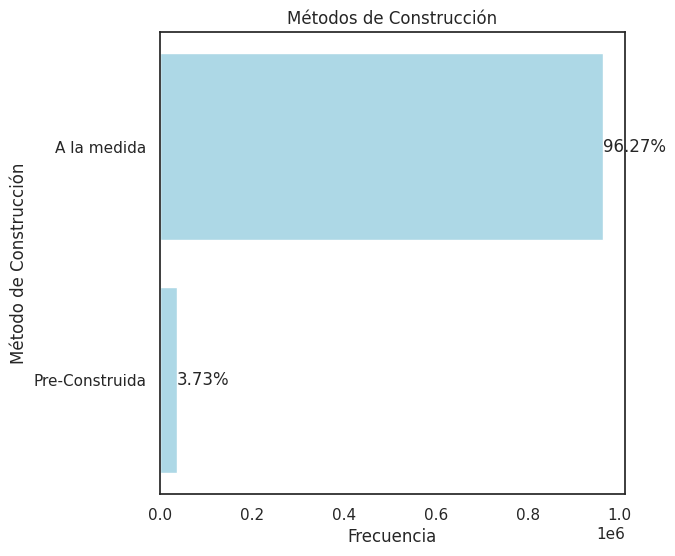

In [ ]:
import matplotlib.pyplot as plt

# Obtener la distribución de valores en la columna 'construction_method'
construction_method_counts = homeMortgage['construction_method'].value_counts()

# Calcular el porcentaje de cada categoría
total_samples = construction_method_counts.sum()
percentages = (construction_method_counts / total_samples) * 100

# Crear el gráfico de barras horizontales
plt.figure(figsize=(6, 6))  # Tamaño del gráfico
bars = plt.barh(construction_method_counts.index, construction_method_counts, color='lightblue')  # Gráfico de barras horizontales

# Añadir etiquetas de porcentaje en las barras
for i, bar in enumerate(bars):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{percentages[i]:.2f}%', va='center')

plt.title('Métodos de Construcción')  # Título del gráfico
plt.xlabel('Frecuencia')  # Etiqueta del eje x
plt.ylabel('Método de Construcción')  # Etiqueta del eje y
plt.gca().invert_yaxis()  # Invertir el eje y para que las categorías estén en orden descendente

# Cambiar los nombres de las filas de inglés a español
nombres_metodos_construccion = ['A la medida', 'Pre-Construida']  # Reemplaza con los nombres en español
plt.gca().set_yticklabels(nombres_metodos_construccion)

plt.show()


In [ ]:
# Seleccionar la columna deseada y obtener su resumen descriptivo
column_to_describe = 'property_value'  # Cambia esto al nombre de la columna que deseas describir
summary_for_column = homeMortgage[column_to_describe].describe().to_frame()

# Aplicar el estilo de gradiente de color al resumen descriptivo
styled_summary_for_column = summary_for_column.style.background_gradient(cmap="ocean_r")

# Mostrar el resumen descriptivo estilizado solo para esa columna
styled_summary_for_column



,property_value
count,782201.000000
mean,387103.270131
std,1954536.648618
min,5000.000000
25%,185000.000000
50%,275000.000000
75%,435000.000000
max,1000005000.000000


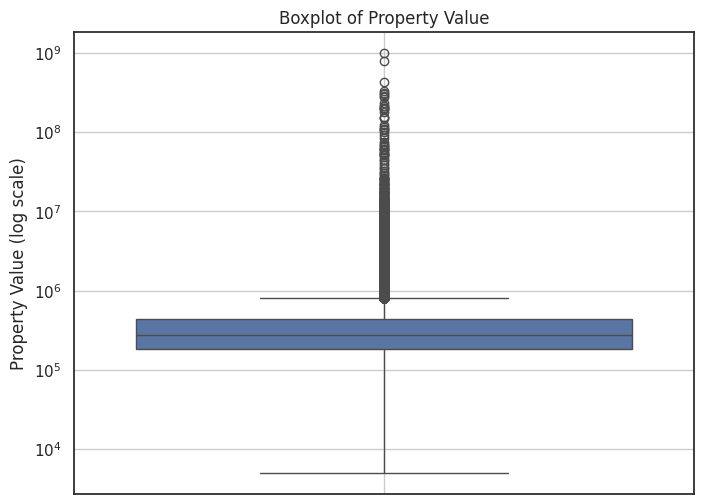

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualización del gráfico de caja con escala logarítmica
plt.figure(figsize=(8, 6))
sns.boxplot(y='property_value', data=homeMortgage)
plt.yscale('log')  # Establece la escala logarítmica en el eje y
plt.ylabel('Property Value (log scale)')
plt.title('Boxplot of Property Value')
plt.grid(True)
plt.show()


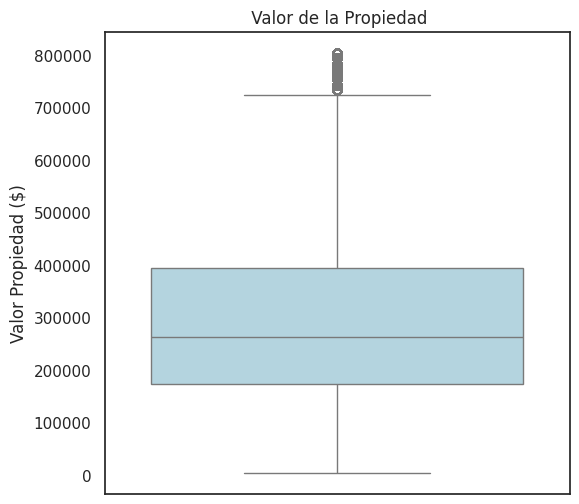

In [ ]:
#Visualizar BOX PLOT VALOR DE LA PROPIEDAD; FILTRANDO ATIPICOS
# Calcular el rango intercuartílico (IQR)
Q1 = homeMortgage['property_value'].quantile(0.25)
Q3 = homeMortgage['property_value'].quantile(0.75)
IQR = Q3 - Q1

# Calcular los límites para los valores atípicos
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

# Filtrar los valores atípicos
homeMortgage_no_outliers = homeMortgage[(homeMortgage['property_value'] >= lower_limit) & (homeMortgage['property_value'] <= upper_limit)]

plt.figure(figsize=(6, 6))  # Establecer el color de fondo en blanco
sns.boxplot(y='property_value', data=homeMortgage_no_outliers, color='lightblue')  # Color azul claro
plt.ylabel('Valor Propiedad ($)')
plt.title(' Valor de la Propiedad')
plt.grid(False)  # Desactivar la cuadrícula
plt.show()


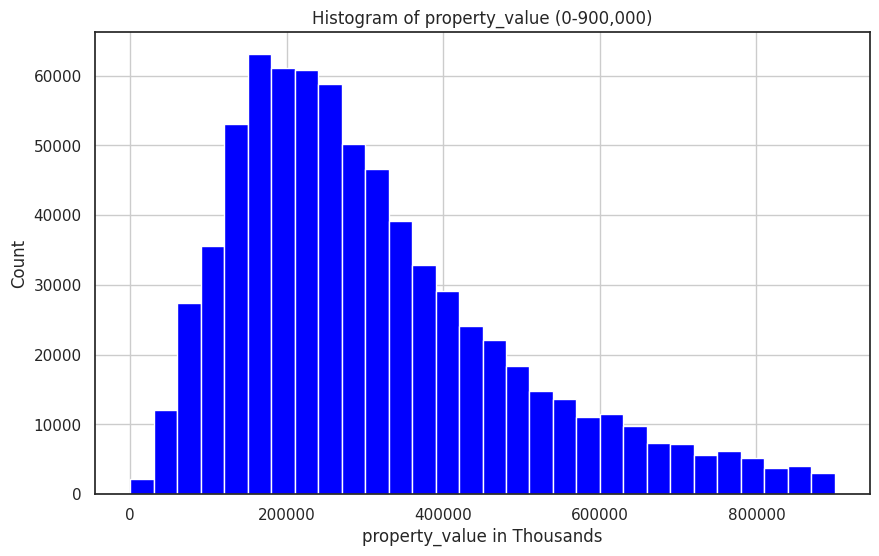

In [ ]:
import matplotlib.pyplot as plt

# Trazar el histograma con límites específicos en el eje y
plt.figure(figsize=(10, 6))
plt.hist(homeMortgage['property_value'], bins=30, range=(0, 900000), color='blue')
plt.xlabel('property_value in Thousands')
plt.ylabel('Count')
plt.title('Histogram of property_value (0-900,000)')
plt.grid(True)
plt.show()


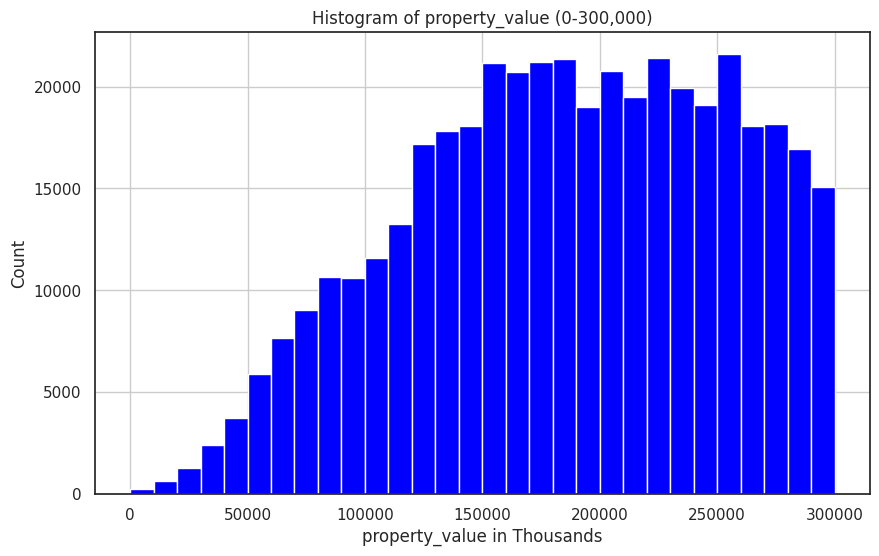

In [ ]:
import matplotlib.pyplot as plt

# Limitar los valores en el eje y para mejorar la visualización
plt.figure(figsize=(10, 6))
plt.hist(homeMortgage['property_value'], bins=30, range=(0, 300000), color='blue')  # Limita el rango a 300,000
plt.xlabel('property_value in Thousands')
plt.ylabel('Count')
plt.title('Histogram of property_value (0-300,000)')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Calcula el promedio y la mediana de 'property_value'
mean_value = homeMortgage['property_value'].mean()
median_value = homeMortgage['property_value'].median()

# Calcula el rango intercuartílico (IQR)
Q1 = homeMortgage['property_value'].quantile(0.25)
Q3 = homeMortgage['property_value'].quantile(0.75)
IQR = Q3 - Q1

# Define el factor multiplicador para determinar los límites para los valores atípicos
factor = 1.5

# Calcula los límites para los valores atípicos
lower_limit = Q1 - factor * IQR
upper_limit = Q3 + factor * IQR

# Filtra los valores que caen fuera de los límites
outliers = homeMortgage[(homeMortgage['property_value'] < lower_limit) | (homeMortgage['property_value'] > upper_limit)]

# Imprime el promedio, la mediana y los valores atípicos
print("Promedio de 'property_value':", mean_value)
print("Mediana de 'property_value':", median_value)



Promedio de 'property_value': 387103.27013133455
Mediana de 'property_value': 275000.0


# ANALISIS DE CORRELACIONES

SE hace esta analisis unicamente con las variables originales del DATA SET Y NO CON LAS CREADAS

In [ ]:
homeMortgage['action_taken3'] = homeMortgage['action_taken3'].astype('category')


<ipython-input-108-4a2ab2e5acc3>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-108-4a2ab2e5acc3>:14: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



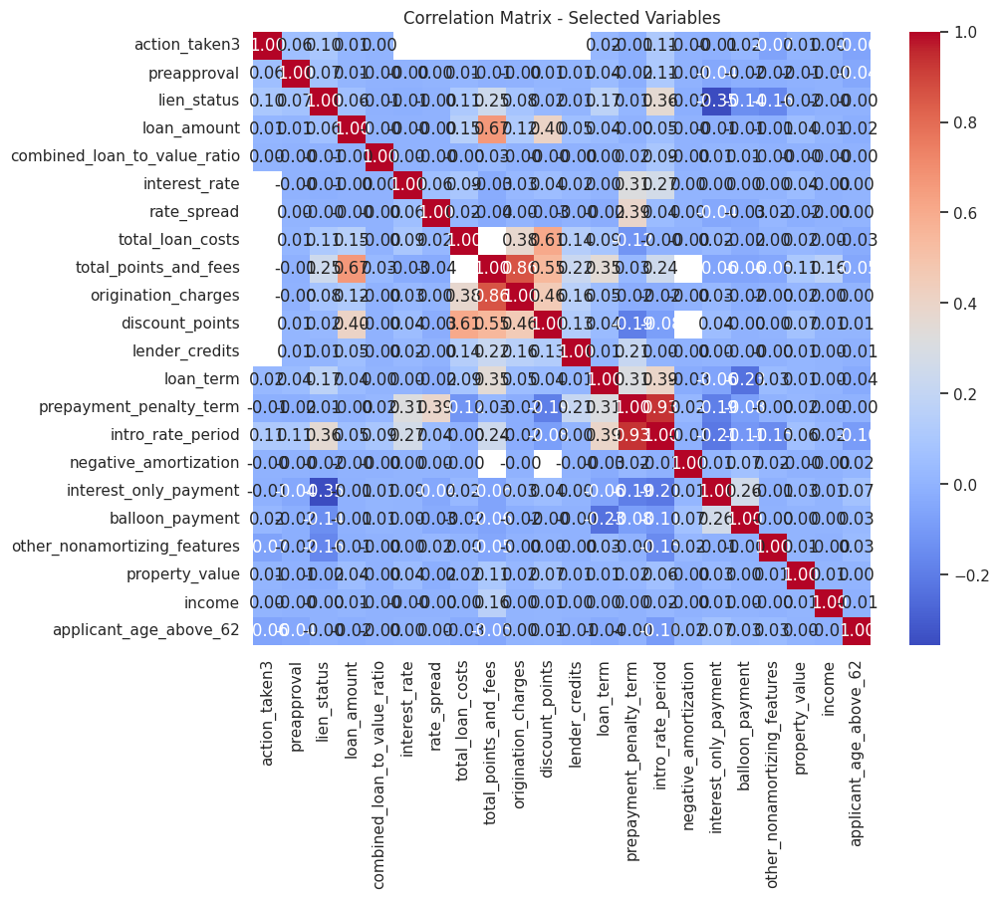

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar las columnas relevantes
columns_of_interest = ['action_taken3', 'preapproval', 'loan_type', 'loan_purpose', 'lien_status', 'loan_amount', 'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread', 'hoepa_status', 'total_loan_costs', 'total_points_and_fees', 'origination_charges', 'discount_points', 'lender_credits', 'loan_term', 'prepayment_penalty_term', 'intro_rate_period', 'negative_amortization', 'interest_only_payment', 'balloon_payment', 'other_nonamortizing_features', 'property_value', 'income', 'applicant_age_above_62', 'debt_to_income_ratio']

# Filtrar el DataFrame para incluir solo las columnas de interés
subset_data = homeMortgage[columns_of_interest]

# Convertir variables categóricas a códigos numéricos
subset_data['action_taken3'] = subset_data['action_taken3'].cat.codes

# Matriz de correlación para las variables seleccionadas
correlation_matrix = subset_data.corr()

# Configurar el tamaño del gráfico
plt.figure(figsize=(10, 8))

# Crear el mapa de calor
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - Selected Variables')

# Mostrar el gráfico
plt.show()


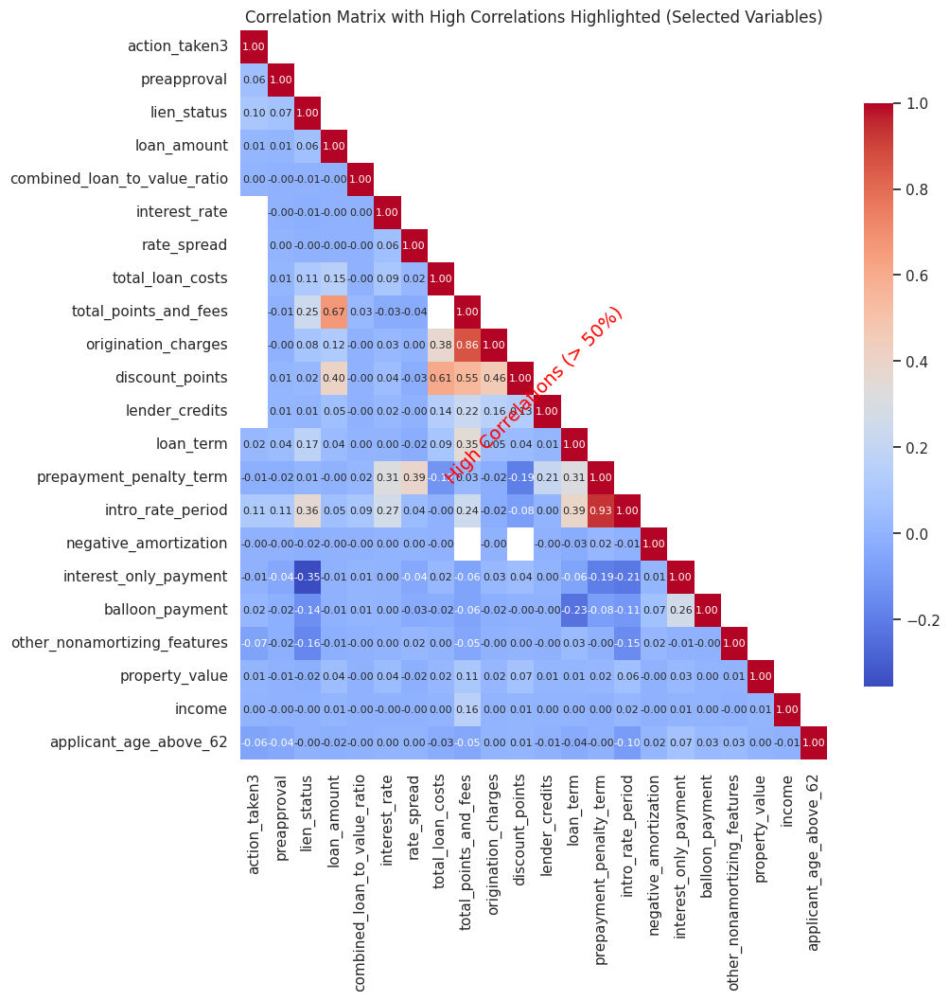

In [ ]:
# Establecer un umbral para destacar las correlaciones superiores al 80%
threshold = 0.5

# Filtrar las correlaciones que superan el umbral en el subconjunto de datos seleccionado
high_correlations_subset = (correlation_matrix.abs() > threshold) & (correlation_matrix != 1)

# Crear una máscara para ocultar la mitad superior de la matriz (ya que es simétrica)
mask_subset = np.triu(np.ones_like(correlation_matrix), k=1)

# Configurar el tamaño del gráfico
plt.figure(figsize=(10, 10))

# Crear un mapa de calor con colores diferentes para las correlaciones altas en el subconjunto de datos seleccionado
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', mask=mask_subset, fmt=".2f", cbar_kws={"shrink": 0.8},
            annot_kws={"size": 8})  # Ajustar el tamaño de la fuente de los números

# Resaltar las correlaciones superiores al 80% en el subconjunto de datos seleccionado
plt.text(0.5, 0.5, 'High Correlations (> 50%)', horizontalalignment='center', verticalalignment='center',
         fontsize=14, color='red', rotation=45, transform=plt.gca().transAxes)

plt.title('Correlation Matrix with High Correlations Highlighted (Selected Variables)')
plt.show()



In [ ]:
#cORRELLACION ACTION TAKEN Y VARIABLES SENSIBLES

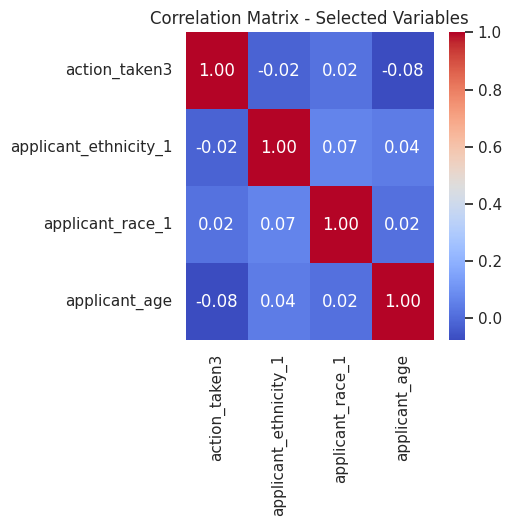

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar las columnas relevantes
columns_of_interest2 = ['action_taken3', 'applicant_ethnicity_1', 'applicant_race_1',
                         'applicant_age']

# Filtrar el DataFrame para incluir solo las columnas de interés
subset_data2 = homeMortgage[columns_of_interest2]

# Convertir variables categóricas a códigos numéricos
subset_data2 = subset_data2.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

# Matriz de correlación para las variables seleccionadas
correlation_matrix2 = subset_data2.corr()

# Configurar el tamaño del gráfico
plt.figure(figsize=(4, 4))

# Crear el mapa de calor
sns.heatmap(correlation_matrix2, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - Selected Variables')

# Mostrar el gráfico
plt.show()



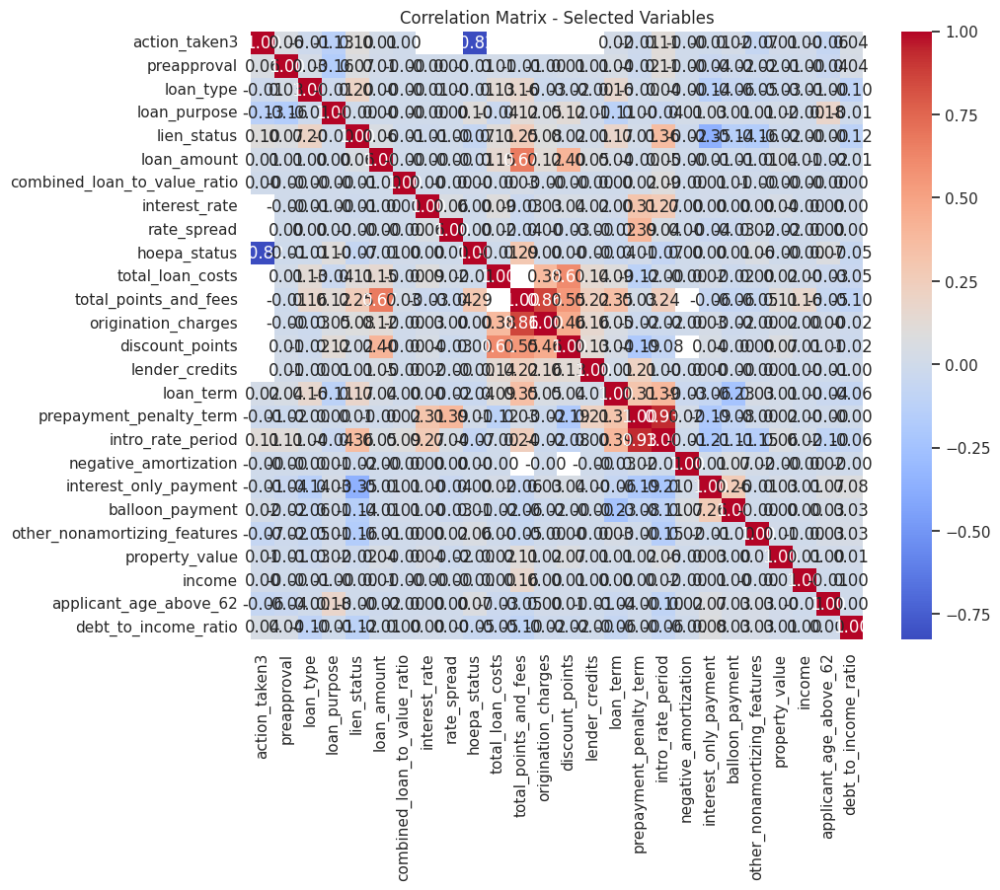

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar las columnas relevantes
columns_of_interest1 = ['action_taken3', 'preapproval', 'loan_type', 'loan_purpose', 'lien_status', 'loan_amount', 'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread', 'hoepa_status', 'total_loan_costs', 'total_points_and_fees', 'origination_charges', 'discount_points', 'lender_credits', 'loan_term', 'prepayment_penalty_term', 'intro_rate_period', 'negative_amortization', 'interest_only_payment', 'balloon_payment', 'other_nonamortizing_features', 'property_value', 'income', 'applicant_age_above_62', 'debt_to_income_ratio']

# Filtrar el DataFrame para incluir solo las columnas de interés
subset_data1 = homeMortgage[columns_of_interest1]

# Convertir variables categóricas a códigos numéricos
subset_data1 = subset_data1.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

# Matriz de correlación para las variables seleccionadas
correlation_matrix1 = subset_data1.corr()

# Configurar el tamaño del gráfico
plt.figure(figsize=(10, 8))

# Crear el mapa de calor
sns.heatmap(correlation_matrix1, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix - Selected Variables')

# Mostrar el gráfico
plt.show()

In [ ]:
corr = subset_data1.corr()
corr

,action_taken3,preapproval,loan_type,loan_purpose,lien_status,loan_amount,combined_loan_to_value_ratio,interest_rate,rate_spread,hoepa_status,...,prepayment_penalty_term,intro_rate_period,negative_amortization,interest_only_payment,balloon_payment,other_nonamortizing_features,property_value,income,applicant_age_above_62,debt_to_income_ratio
action_taken3,1.000000,0.056068,-0.012454,-0.131013,0.098888,0.014947,0.001634,NaN,NaN,-0.824250,...,-0.014645,0.113218,-0.002442,-0.007190,0.019862,-0.067423,0.005445,0.003870,-0.062428,0.040555
preapproval,0.056068,1.000000,0.025012,-0.162239,0.071194,0.005522,-0.000641,-0.002045,0.000268,-0.006912,...,-0.020456,0.107314,-0.003820,-0.043358,-0.016659,-0.018773,-0.005933,-0.002114,-0.044754,0.036657
loan_type,-0.012454,0.025012,1.000000,-0.014885,0.199204,0.000147,-0.001461,-0.006627,0.000689,-0.010210,...,-0.003083,0.040918,-0.000337,-0.138847,-0.059560,-0.049251,-0.031365,-0.009224,-0.000518,-0.099452
loan_purpose,-0.131013,-0.162239,-0.014885,1.000000,-0.001584,0.001787,-0.002821,-0.002065,0.001129,0.100739,...,0.001991,-0.043119,0.012541,0.029179,0.006154,0.006291,0.019791,-0.003231,0.178085,-0.005003
lien_status,0.098888,0.071194,0.199204,-0.001584,1.000000,0.059244,-0.006807,-0.014470,-0.000535,-0.065003,...,0.014106,0.360293,-0.015901,-0.354328,-0.140336,-0.164928,-0.016855,-0.000563,-0.004213,-0.115808
loan_amount,0.014947,0.005522,0.000147,0.001787,0.059244,1.000000,-0.002913,-0.002935,-0.004056,-0.012155,...,-0.002740,0.054383,-0.003011,-0.006093,-0.009029,-0.013607,0.043177,0.007896,-0.017161,-0.010430
combined_loan_to_value_ratio,0.001634,-0.000641,-0.001461,-0.002821,-0.006807,-0.002913,1.000000,0.000092,-0.000113,0.004721,...,0.019854,0.090531,-0.000071,0.008721,0.007288,-0.000386,-0.000346,-0.000087,-0.001488,0.000576
interest_rate,NaN,-0.002045,-0.006627,-0.002065,-0.014470,-0.002935,0.000092,1.000000,0.056382,0.001633,...,0.312334,0.268293,0.000398,0.003841,0.001778,0.003507,0.037359,-0.000064,0.001949,0.004151
rate_spread,NaN,0.000268,0.000689,0.001129,-0.000535,-0.004056,-0.000113,0.056382,1.000000,0.000425,...,0.387891,0.040337,0.002049,-0.044110,-0.031851,0.018028,-0.019023,-0.000057,0.000613,0.001090
hoepa_status,-0.824250,-0.006912,-0.010210,0.100739,-0.065003,-0.012155,0.004721,0.001633,0.000425,1.000000,...,0.008874,-0.068901,0.001261,0.000558,0.006918,0.055387,-0.003485,-0.000848,0.070413,-0.051618


In [ ]:
# Ordenar las correlaciones con 'action_taken3' en orden ascendente
sorted_correlation_asc = correlation_matrix1['action_taken3'].sort_values(ascending=True)

# Seleccionar las 5 variables más correlacionadas negativamente (excluyendo 'action_taken3' si es necesario)
top_5_neg_correlated = sorted_correlation_asc.head(5)

# Ordenar las correlaciones con 'action_taken3' en orden descendente
sorted_correlation_desc = correlation_matrix1['action_taken3'].sort_values(ascending=False)

# Seleccionar las 5 variables más correlacionadas positivamente (excluyendo 'action_taken3' si es necesario)
top_5_pos_correlated = sorted_correlation_desc[1:6]  # Excluye 'action_taken3'

print("Top 5 variables más correlacionadas negativamente con action_taken3:")
print(top_5_neg_correlated)
print("\nTop 5 variables más correlacionadas positivamente con action_taken3:")
print(top_5_pos_correlated)



Top 5 variables más correlacionadas negativamente con action_taken3:
hoepa_status                   -0.824250
loan_purpose                   -0.131013
other_nonamortizing_features   -0.067423
applicant_age_above_62         -0.062428
prepayment_penalty_term        -0.014645
Name: action_taken3, dtype: float64

Top 5 variables más correlacionadas positivamente con action_taken3:
intro_rate_period       0.113218
lien_status             0.098888
preapproval             0.056068
debt_to_income_ratio    0.040555
loan_term               0.021441
Name: action_taken3, dtype: float64


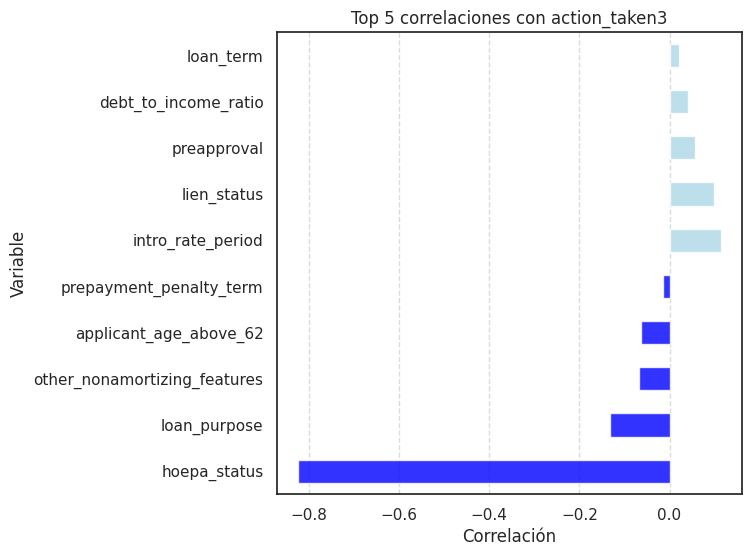

In [ ]:
import matplotlib.pyplot as plt

# Configurar el tamaño del gráfico
plt.figure(figsize=(6, 6))

# Concatenar las correlaciones positivas y negativas para crear un solo DataFrame
top_correlations = pd.concat([top_5_neg_correlated, top_5_pos_correlated])

# Crear un gráfico de barras horizontales
top_correlations.plot(kind='barh', color=['blue' if x < 0 else 'lightblue' for x in top_correlations], alpha=0.8)

# Títulos y etiquetas
plt.xlabel('Correlación')
plt.ylabel('Variable')
plt.title('Top 5 correlaciones con action_taken3')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Mostrar el gráfico
plt.show()


<Axes: >

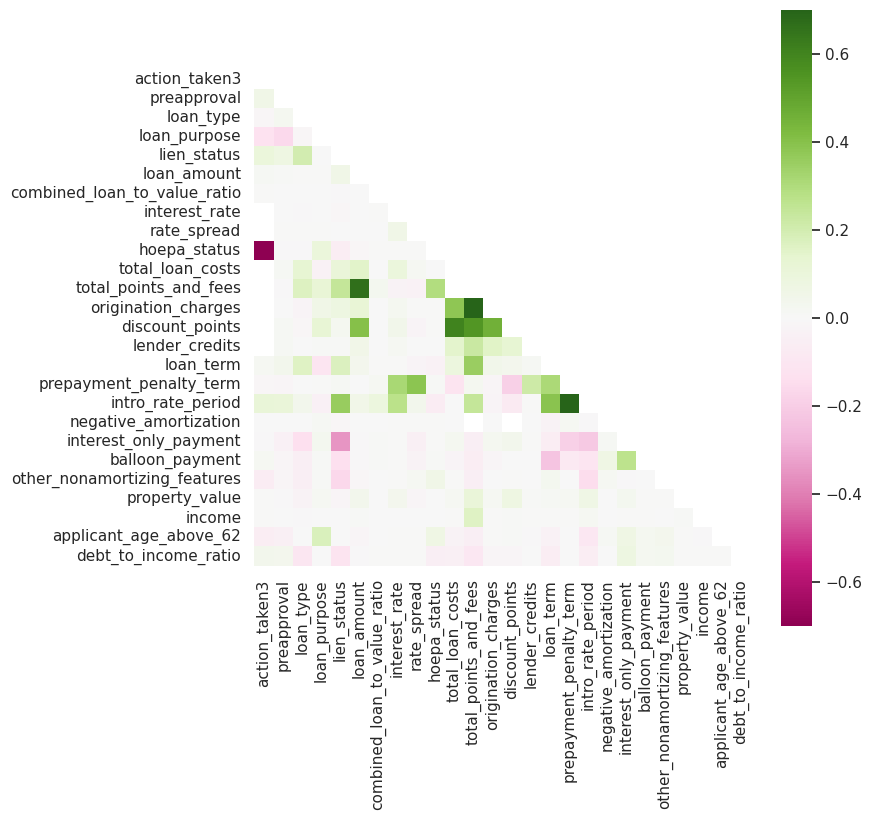

In [ ]:
# mapa de calor de la matriz de correlación, donde las correlaciones más fuertes están representadas por colores más intensos, y se oculta la parte superior de la matriz para eliminar la redundancia
plt.figure(figsize=(8,8))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, mask=mask, square=True, cmap="PiYG", vmin=-0.7, vmax=0.7)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



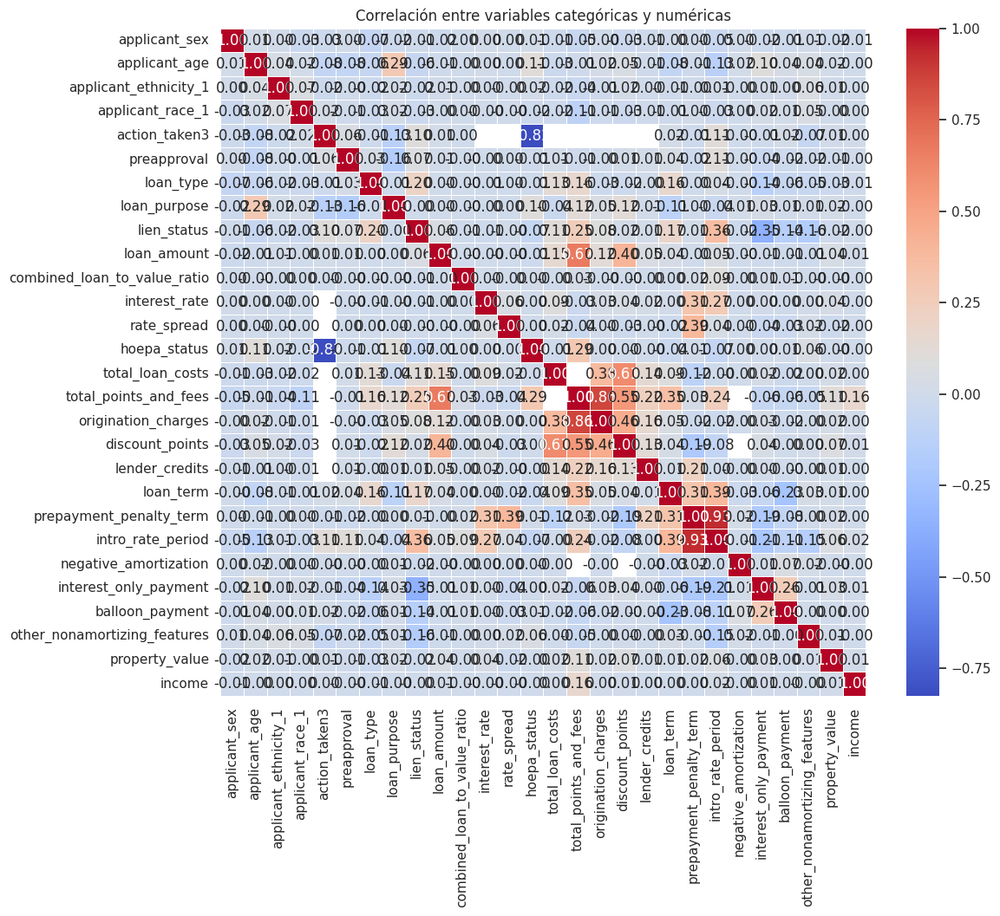

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Seleccionar las columnas relevantes
columns_of_interest7 = ['applicant_sex', 'applicant_age', 'applicant_ethnicity_1', 'applicant_race_1']

# Filtrar el DataFrame para incluir solo las columnas de interés y las variables numéricas
subset_data7 = homeMortgage[columns_of_interest7 + ['action_taken3', 'preapproval', 'loan_type', 'loan_purpose', 'lien_status', 'loan_amount', 'combined_loan_to_value_ratio', 'interest_rate', 'rate_spread', 'hoepa_status', 'total_loan_costs', 'total_points_and_fees', 'origination_charges', 'discount_points', 'lender_credits', 'loan_term', 'prepayment_penalty_term', 'intro_rate_period', 'negative_amortization', 'interest_only_payment', 'balloon_payment', 'other_nonamortizing_features', 'property_value', 'income']]

# Convertir variables categóricas a códigos numéricos
subset_data_encoded7 = subset_data7.apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)

# Calcular las correlaciones entre todas las variables categóricas y las variables numéricas
correlation_matrix7 = subset_data_encoded7.corr(method=lambda x, y: stats.pointbiserialr(x, y)[0])

# Visualizar la matriz de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix7, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlación entre variables categóricas y numéricas')
plt.show()


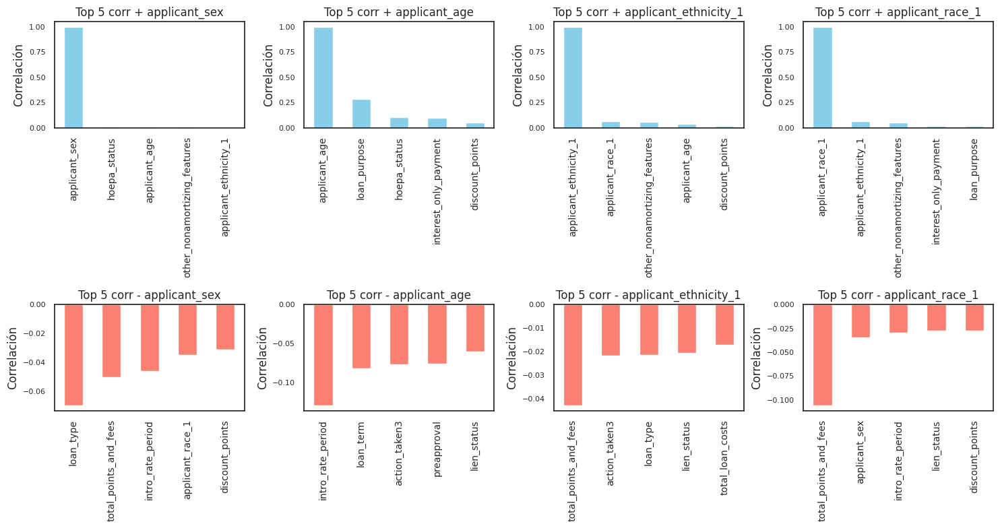

In [ ]:
# Filtrar la matriz de correlación para obtener las correlaciones de las variables de interés con todas las demás variables
correlation_with_interest_variables = correlation_matrix7[columns_of_interest7]

# Configurar el tamaño de la figura para los subplots
plt.figure(figsize=(15, 8))

# Iterar sobre las variables de interés
for i, variable in enumerate(columns_of_interest7, 1):
    # Seleccionar las correlaciones más altas (positivas y negativas) para la variable actual
    top_positive_correlations = correlation_with_interest_variables[variable].nlargest(5)
    top_negative_correlations = correlation_with_interest_variables[variable].nsmallest(5)

    # Crear un subplot para las correlaciones positivas
    plt.subplot(2, len(columns_of_interest7), i)
    top_positive_correlations.plot(kind='bar', color='skyblue')
    plt.title(f'Top 5 corr + {variable}')
    plt.ylabel('Correlación')
    plt.xticks(rotation='vertical', fontsize=10)  # Ajustar el tamaño de la fuente
    plt.yticks(fontsize=8)  # Ajustar el tamaño de la fuente

    # Crear un subplot para las correlaciones negativas
    plt.subplot(2, len(columns_of_interest7), i+len(columns_of_interest7))
    top_negative_correlations.plot(kind='bar', color='salmon')
    plt.title(f'Top 5 corr - {variable}')
    plt.ylabel('Correlación')
    plt.xticks(rotation='vertical', fontsize=10)  # Ajustar el tamaño de la fuente
    plt.yticks(fontsize=8)  # Ajustar el tamaño de la fuente

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


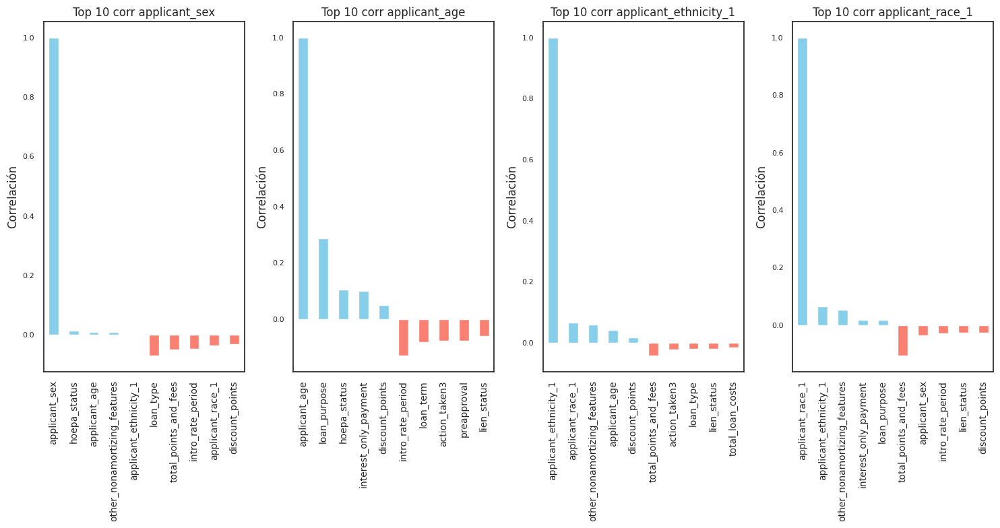

In [ ]:
# Configurar el tamaño de la figura para los subplots
plt.figure(figsize=(15, 8))

# Iterar sobre las variables de interés
for i, variable in enumerate(columns_of_interest7, 1):
    # Seleccionar las correlaciones más altas (positivas y negativas) para la variable actual
    top_correlations = pd.concat([correlation_with_interest_variables[variable].nlargest(5),
                                  correlation_with_interest_variables[variable].nsmallest(5)])

    # Crear un subplot para las correlaciones
    plt.subplot(1, len(columns_of_interest7), i)
    top_correlations.plot(kind='bar', color=['skyblue' if val >= 0 else 'salmon' for val in top_correlations])
    plt.title(f'Top 10 corr {variable}')
    plt.ylabel('Correlación')
    plt.xticks(rotation='vertical', fontsize=10)  # Ajustar el tamaño de la fuente
    plt.yticks(fontsize=8)  # Ajustar el tamaño de la fuente

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


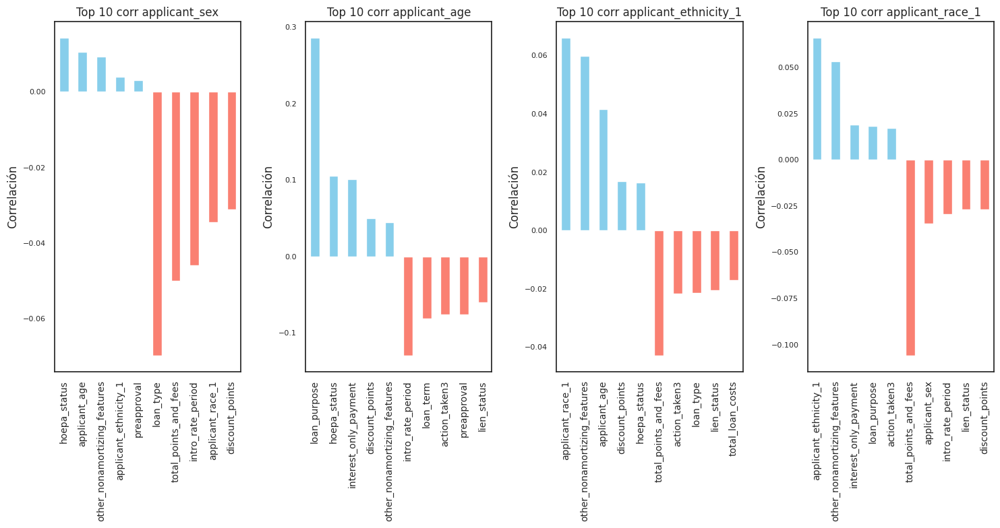

In [ ]:
# Configurar el tamaño de la figura para los subplots
plt.figure(figsize=(15, 8))

# Iterar sobre las variables de interés
for i, variable in enumerate(columns_of_interest7, 1):
    # Seleccionar las correlaciones sin incluir la correlación con la misma variable
    correlations_without_self = correlation_with_interest_variables[variable].drop(variable)

    # Seleccionar las correlaciones más altas (positivas y negativas) para la variable actual
    top_correlations = pd.concat([correlations_without_self.nlargest(5),
                                  correlations_without_self.nsmallest(5)])

    # Crear un subplot para las correlaciones
    plt.subplot(1, len(columns_of_interest7), i)
    top_correlations.plot(kind='bar', color=['skyblue' if val >= 0 else 'salmon' for val in top_correlations])
    plt.title(f'Top 10 corr {variable}')
    plt.ylabel('Correlación')
    plt.xticks(rotation='vertical', fontsize=10)  # Ajustar el tamaño de la fuente
    plt.yticks(fontsize=8)  # Ajustar el tamaño de la fuente

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()


# ANALISIS NO APROBADOS

In [ ]:
print(homeMortgage['action_taken3'].unique())

df_main = homeMortgage[(homeMortgage['action_taken3'] != 'Loan purchased by the institution') & (homeMortgage['action_taken3'] != 'Application withdrawn by applicant')]

['No Otorgado', 'Otorgado']
Categories (2, object): ['No Otorgado', 'Otorgado']


In [ ]:
print(homeMortgage[['denial_reason_1',
               'denial_reason_2',
               'denial_reason_3']].isna().sum(),'\n\n')

print('Total available values = {}'.format(df_main[['denial_reason_1',
                                                    'denial_reason_2',
                                                    'denial_reason_3']].notna().sum().sum()))

print('Total missing values = {}'.format(df_main[['denial_reason_1',
                                                  'denial_reason_2',
                                                  'denial_reason_3']].isna().sum().sum()))

denial_reason_1         0
denial_reason_2    960513
denial_reason_3    993002
dtype: int64 


Total available values = 1046485
Total missing values = 1953515


In [ ]:
df_loan_denial = homeMortgage[['denial_reason_1','denial_reason_2','denial_reason_3']]

df_loan_denial = pd.DataFrame(pd.concat([df_loan_denial['denial_reason_1'],
                                         df_loan_denial['denial_reason_2'],
                                         df_loan_denial['denial_reason_3']],
                                         ignore_index=True).value_counts(normalize=True),
                                         columns=['denial_reason_count'])

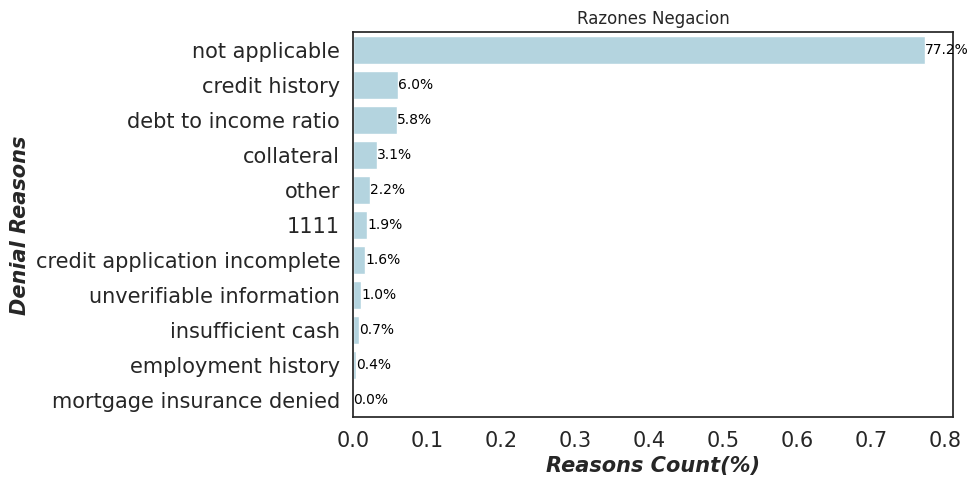

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir el color azul claro
light_blue_color = "#ADD8E6"

# Crear los datos del DataFrame df_loan_denial
# Aquí asumo que df_loan_denial es el DataFrame que contiene las razones de negación y sus conteos
# df_loan_denial = ...

# Crear el gráfico de barras con color azul claro y porcentaje dentro de las barras
fig, ax = plt.subplots(figsize=(10, 5))
barplot = sns.barplot(y=df_loan_denial.index, x=df_loan_denial.denial_reason_count, orient='h', color=light_blue_color)

# Agregar porcentaje dentro de cada barra
total_count = df_loan_denial.denial_reason_count.sum()
for rect in barplot.patches:
    width = rect.get_width()
    plt.text(width, rect.get_y() + rect.get_height() / 2, f'{width / total_count:.1%}', ha='left', va='center', fontsize=10, color='black')

plt.ylabel('Denial Reasons',fontdict={'fontsize':15,'fontstyle':'italic','fontweight':'bold'})
plt.xlabel('Reasons Count(%)',fontdict={'fontsize':15,'fontstyle':'italic','fontweight':'bold'})
plt.tick_params(axis='both',labelsize=15)
plt.subplots_adjust(left=0.3)
plt.title('Razones Negacion')
plt.show()


<ipython-input-125-a4370ca9e9d9>:17: UserWarning:

FixedFormatter should only be used together with FixedLocator



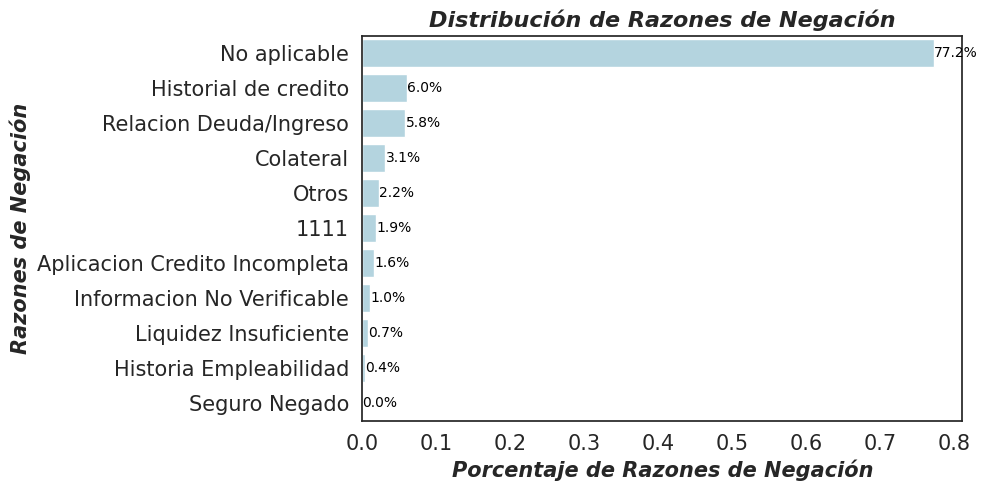

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir el color azul claro
light_blue_color = "#ADD8E6"

# Crear los datos del DataFrame df_loan_denial
# Aquí asumo que df_loan_denial es el DataFrame que contiene las razones de negación y sus conteos
# df_loan_denial = ...

# Crear el gráfico de barras con color azul claro y porcentaje dentro de las barras
fig, ax = plt.subplots(figsize=(10, 5))
barplot = sns.barplot(y=df_loan_denial.index, x=df_loan_denial.denial_reason_count, orient='h', color=light_blue_color)

# Cambiar los nombres de las líneas en el eje y al español
razones_negacion = ['No aplicable', 'Historial de credito', 'Relacion Deuda/Ingreso', 'Colateral', 'Otros', '1111', 'Aplicacion Credito Incompleta', 'Informacion No Verificable','Liquidez Insuficiente', 'Historia Empleabilidad','Seguro Negado']  # Reemplaza con tus nombres en español
ax.set_yticklabels(razones_negacion)

# Agregar porcentaje dentro de cada barra
total_count = df_loan_denial.denial_reason_count.sum()
for rect in barplot.patches:
    width = rect.get_width()
    plt.text(width, rect.get_y() + rect.get_height() / 2, f'{width / total_count:.1%}', ha='left', va='center', fontsize=10, color='black')

plt.ylabel('Razones de Negación', fontdict={'fontsize': 15, 'fontstyle': 'italic', 'fontweight': 'bold'})
plt.xlabel('Porcentaje de Razones de Negación', fontdict={'fontsize': 15, 'fontstyle': 'italic', 'fontweight': 'bold'})
plt.tick_params(axis='both', labelsize=15)
plt.subplots_adjust(left=0.3)
plt.title('Distribución de Razones de Negación', fontdict={'fontsize': 16, 'fontstyle': 'italic', 'fontweight': 'bold'})
plt.show()



In [ ]:
# creating loan_approved column from the action_taken_name columns
homeMortgage['aprobado'] = homeMortgage['action_taken2'].apply(lambda x: 1 if x == 'aprobado' else 0)

loan_approved,loan_denied = homeMortgage[homeMortgage['aprobado'] == 1],homeMortgage[homeMortgage['aprobado'] == 0]

print('Approved mean {} and median {}'.format(loan_approved['income'].mean(),
                                              loan_approved['income'].median()))

print('Denied mean {} and median {}'.format(loan_denied['income'].mean(),
                                            loan_denied['income'].median()))

Approved mean 156.6072341541917 and median 88.0
Denied mean 132.21101996492527 and median 73.0


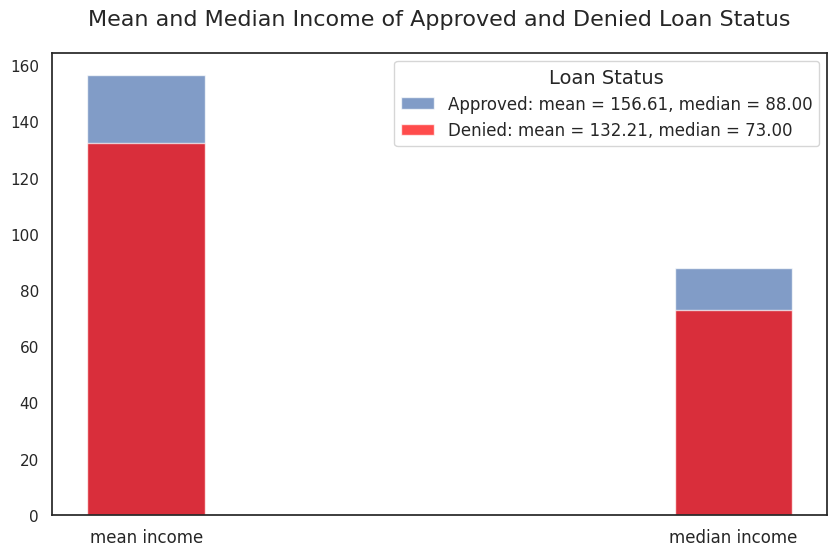

In [ ]:
app_loan_mean, app_loan_med = loan_approved['income'].mean(), loan_approved['income'].median()
den_loan_mean, den_loan_med = loan_denied['income'].mean(), loan_denied['income'].median()

fig, ax = plt.subplots(1, 1, sharey=True, figsize=(10, 6))
ax.bar(x=['mean income', 'median income'], height=[app_loan_mean, app_loan_med], color='b', alpha=0.7, width=0.2)
ax.bar(x=['mean income', 'median income'], height=[den_loan_mean, den_loan_med], color='red', alpha=0.7, width=0.2)

plt.legend(['Approved: mean = {:.2f}, median = {:.2f}'.format(app_loan_mean, app_loan_med),
            'Denied: mean = {:.2f}, median = {:.2f}'.format(den_loan_mean, den_loan_med)],
           fontsize=12, title='Loan Status', title_fontsize=14)

ax.tick_params(axis='x', labelsize=12)
plt.title('Mean and Median Income of Approved and Denied Loan Status', fontsize=16, pad=20)
plt.show()


# ANALISIS DE BOX PLOT

In [ ]:
""" draw boxplot by category and loan results """
def category_boxplot(cate, title):
    sns.set(style="whitegrid")
    plt.figure(figsize=(8, 4))
    # income
    ax = sns.boxplot(x="income_sqrt", y="action_taken3", hue=cate,
                     data=homeMortgage)
    ax.set_title("Income by " + title, fontsize=15)
    ax.set_ylabel("")
    ax.legend(bbox_to_anchor=(1.05, 1), loc=2)

    plt.show()

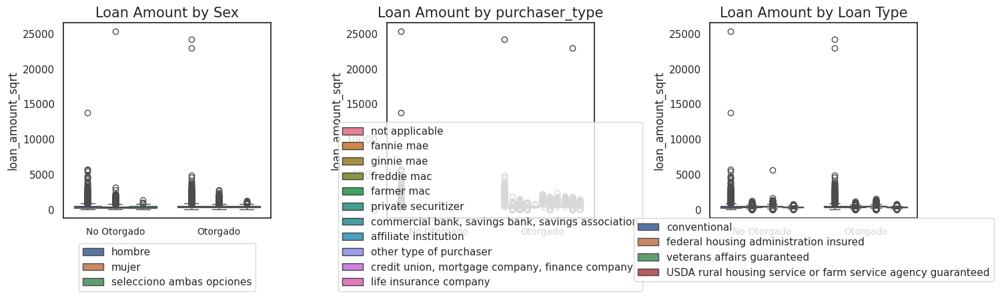

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.boxplot(x="action_taken3", y="loan_amount_sqrt", hue="applicant_sex",
            data=homeMortgage, ax=axes[0])
axes[0].set_title("Loan Amount by Sex", fontsize=15)
axes[0].set_xlabel("")
axes[0].legend(bbox_to_anchor=(0.5, -0.4), loc=8)
axes[0].tick_params(axis='x', labelsize=10)  # Ajustar tamaño de etiquetas en el eje x

sns.boxplot(x="action_taken3", y="loan_amount_sqrt", hue="purchaser_type",
            data=homeMortgage, ax=axes[1])
axes[1].set_title("Loan Amount by purchaser_type", fontsize=15)
axes[1].set_xlabel("")
axes[1].legend(bbox_to_anchor=(0.5, -0.4), loc=8)
axes[1].tick_params(axis='x', labelsize=10)  # Ajustar tamaño de etiquetas en el eje x

sns.boxplot(x="action_taken3", y="loan_amount_sqrt", hue="loan_type",
            data=homeMortgage, ax=axes[2])
axes[2].set_title("Loan Amount by Loan Type", fontsize=15)
axes[2].set_xlabel("")
axes[2].legend(bbox_to_anchor=(0.5, -0.35), loc=8)
axes[2].tick_params(axis='x', labelsize=10)  # Ajustar tamaño de etiquetas en el eje x

plt.tight_layout()  # Ajustar diseño para evitar superposición de etiquetas
plt.show()

#ANALISIS DE CLUSTERS

In [ ]:
# criteria 1 based on loan approval rate
census_minor = homeMortgage.groupby(['lei'])['poblacion_protegida_nueva'].mean()
census_ownership = homeMortgage.groupby(['lei'])['combined_loan_to_value_ratio'].mean()
census_df_1 = pd.DataFrame({'poblacion_protegida_nueva': census_minor, 'loan_purpose': census_ownership})
census_df_1.reset_index(inplace=True)

# criteria 2 based on income vs. loan amount
census_income = homeMortgage.groupby(['lei'])['income_sqrt'].mean()
census_loan_amount = homeMortgage.groupby(['lei'])['loan_amount_sqrt'].mean()
census_df_2 = pd.DataFrame({'income': census_income, 'loan_amount': census_loan_amount})
census_df_2.reset_index(inplace=True)

# merge criteria 1 and 2
census_df = pd.merge(census_df_1, census_df_2, on='lei')


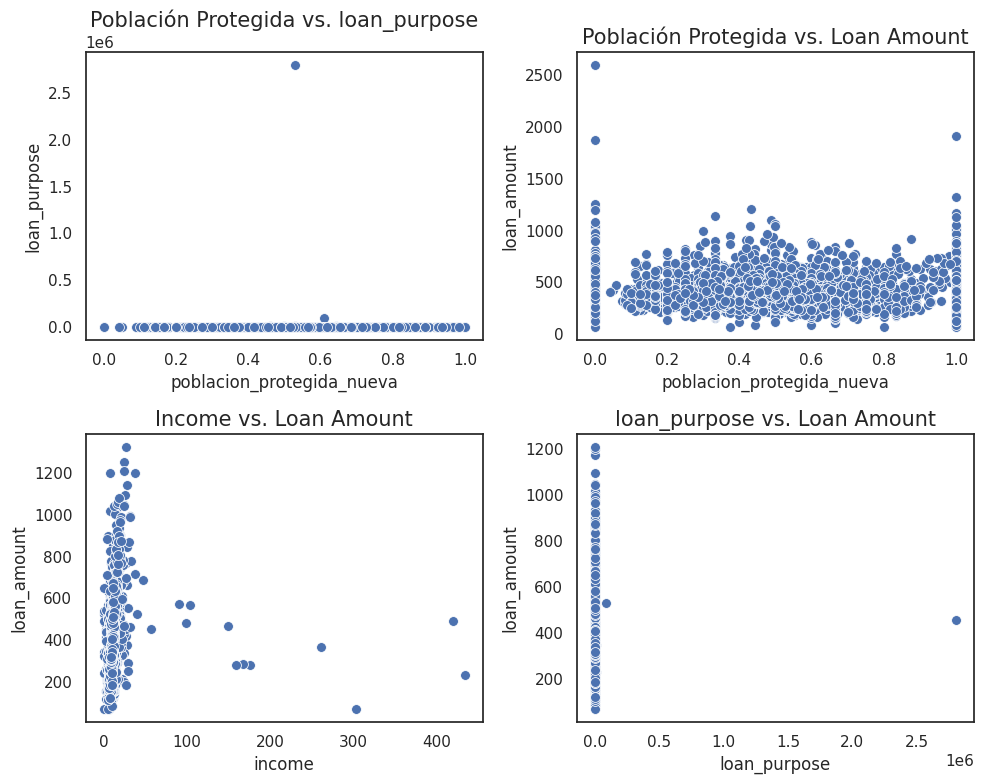

In [ ]:
# Combinación de datos numéricos con puntos de tamaño adecuado
fig, axes = plt.subplots(2, 2, figsize=(10, 8))


sns.scatterplot(x="poblacion_protegida_nueva", y="loan_purpose", data=census_df, ax=axes[0,0], s=50)
axes[0,0].set_title("Población Protegida vs. loan_purpose", fontsize=15)

sns.scatterplot(x="poblacion_protegida_nueva", y="loan_amount", data=census_df, ax=axes[0,1], s=50)
axes[0,1].set_title("Población Protegida vs. Loan Amount", fontsize=15)

sns.scatterplot(x="income", y="loan_amount", data=census_df, ax=axes[1,0], s=50)
axes[1,0].set_title("Income vs. Loan Amount", fontsize=15)

sns.scatterplot(x="loan_purpose", y="loan_amount", data=census_df, ax=axes[1,1], s=50)
axes[1,1].set_title("loan_purpose vs. Loan Amount", fontsize=15)

plt.tight_layout()

In [ ]:
# Usando value_counts() para contar los valores únicos en una columna
informacion_columna = homeMortgage['poblacion_protegida_nueva'].value_counts()
print(informacion_columna)

# Usando unique() para obtener los valores únicos en una columna
valores_unicos = homeMortgage['poblacion_protegida_nueva'].unique()
print(valores_unicos)


1.0    531022
0.0    468978
Name: poblacion_protegida_nueva, dtype: int64
[1. 0.]


# AGRUPAMIENTO JERARQUICO

características similares en términos de poblacion_protegida_nueva y loan_amount

• Agrupamiento jerárquico: Dendrograma
La máxima ventaja de la agrupación jerárquica es que da una idea general de cuántos grupos hay en los datos. Especialmente, el dendrograma es muy útil para verlo visualmente. Es posible visualizar el árbol que representa la fusión jerárquica de clústeres como un dendrograma. La inspección visual a menudo puede ser útil para comprender la estructura de los datos, aunque más en el caso de tamaños de muestra pequeños

Agruparmiento Jerarquico  Problacion Protegida y Loan Amount

In [ ]:
from sklearn.cluster import AgglomerativeClustering


In [ ]:
def hier_clustering_labels(X, n):
    clustering = AgglomerativeClustering(
        n_clusters=n, affinity='euclidean', linkage='ward')
    clustering.fit_predict(X)

    return clustering.labels_

In [ ]:
X = [[x[0], x[1]] for x in zip(census_df['income'], census_df['loan_amount'])]
X = np.array(X)

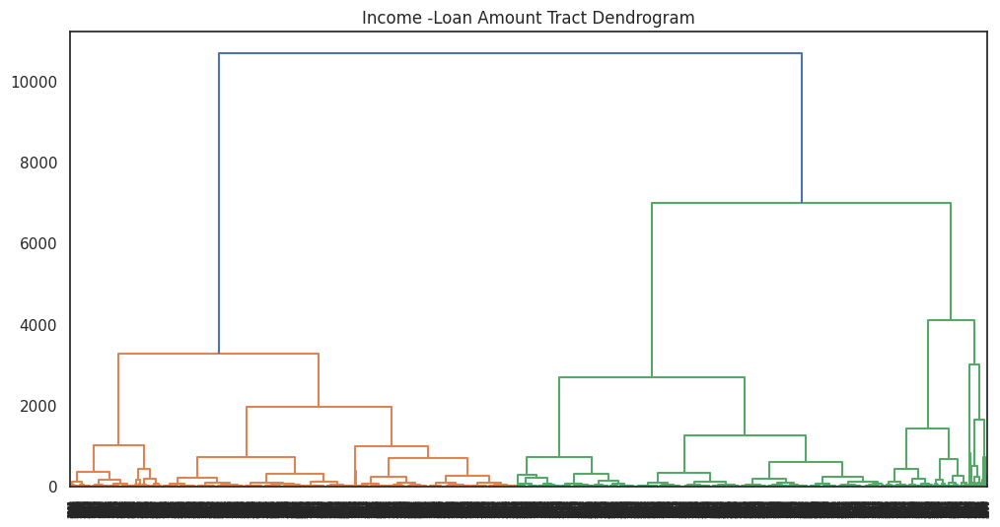

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.impute import SimpleImputer  # Importar SimpleImputer

# Crear un imputador para reemplazar los valores faltantes con la media
imputer = SimpleImputer(strategy='mean')  # Puedes usar otras estrategias como 'median' o 'most_frequent'

# Imputar valores faltantes en tus datos X
X_imputed = imputer.fit_transform(X)

plt.figure(figsize=(12, 6))
plt.title("Income -Loan Amount Tract Dendrogram")
dend = dendrogram(linkage(X_imputed, method='ward'))

plt.show()


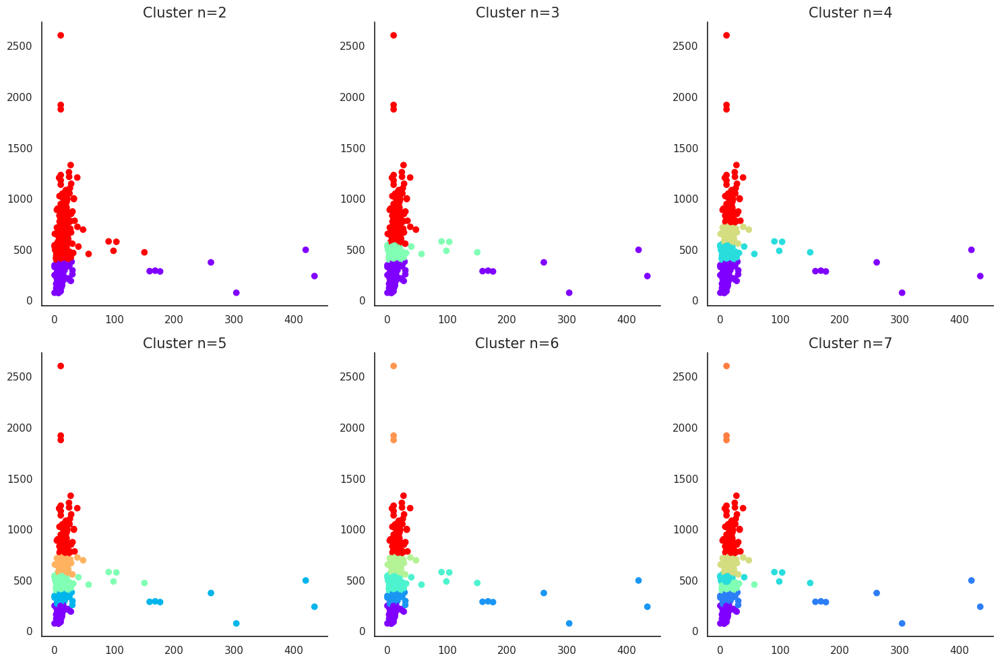

In [ ]:
#FORMA GRAFICA DEL DENDOGRAMA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.impute import SimpleImputer  # Importar SimpleImputer
from scipy.cluster.hierarchy import fcluster


# Suponiendo que X contiene tus datos, puedes crear un dendrograma así:
# Crear un imputador para reemplazar los valores faltantes con la media
imputer = SimpleImputer(strategy='mean')  # Puedes usar otras estrategias como 'median' o 'most_frequent'

# Imputar valores faltantes en tus datos X
X_imputed = imputer.fit_transform(X)

# Crear un gráfico con subplots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
sns.despine()

# Función para obtener las etiquetas de clustering
def hier_clustering_labels(X, n_clusters):
    linkage_matrix = linkage(X, method='ward')
    return fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# Iterar sobre las filas y columnas de los subplots
for i in range(2):
    for j in range(3):
        n_clusters = i * 3 + j + 2  # Calcula el número de clusters
        clustering_labels = hier_clustering_labels(X_imputed, n_clusters)  # Obtiene las etiquetas de clustering

        # Scatter plot de los datos coloreados por las etiquetas de clustering
        axes[i, j].scatter(X_imputed[:,0], X_imputed[:,1], c=clustering_labels, cmap='rainbow')
        axes[i, j].set_title(f"Cluster n={n_clusters}", fontsize=15)

plt.tight_layout()
plt.show()


Cada cluster resultante representa un grupo de observaciones que tienen características similares en términos de income y loan_amount

Agrupamiento Jerarquico Variables mas importantes

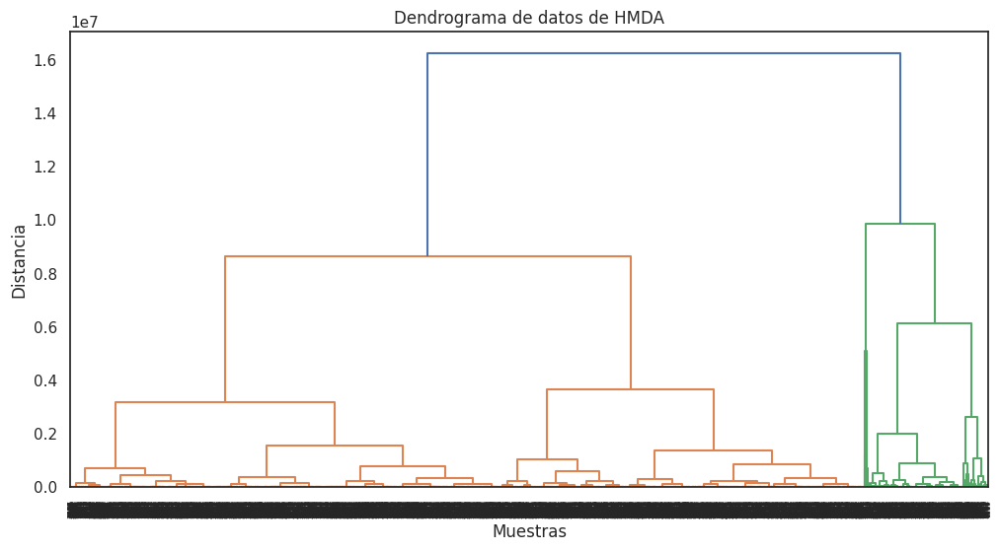

In [ ]:
 #Dendograma para una muestra de 10.000 registros aleatorios
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Suponiendo que 'df' es tu DataFrame de datos de HMDA
# Selecciona las variables de interés
variables_of_interest5 = ['loan_amount', 'income', 'interest_rate', 'loan_purpose', 'loan_type',
                        'applicant_race_1', 'applicant_sex', 'applicant_age', 'action_taken']

# Filtra el DataFrame para incluir solo las variables de interés
subset_data5 = homeMortgage[variables_of_interest5]

# Realiza un muestreo aleatorio de tus datos
subset_data5 = subset_data5.sample(n=10000, random_state=42)

# Elimina las filas con valores nulos para evitar errores en el dendrograma
subset_data5.dropna(inplace=True)

# Convertir variables categóricas a dummies
subset_data5 = pd.get_dummies(subset_data5)

# Calcula la matriz de enlace utilizando el método de Ward y la métrica euclidiana
Z = linkage(subset_data5, method='ward', metric='euclidean')

# Crea el dendrograma
plt.figure(figsize=(12, 6))
plt.title("Dendrograma de datos de HMDA")
dendrogram(Z)
plt.xlabel('Muestras')
plt.ylabel('Distancia')
plt.show()



# AGRUPAMIENTO BASADO EN KMEANS

Para Income y Loan Amount

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

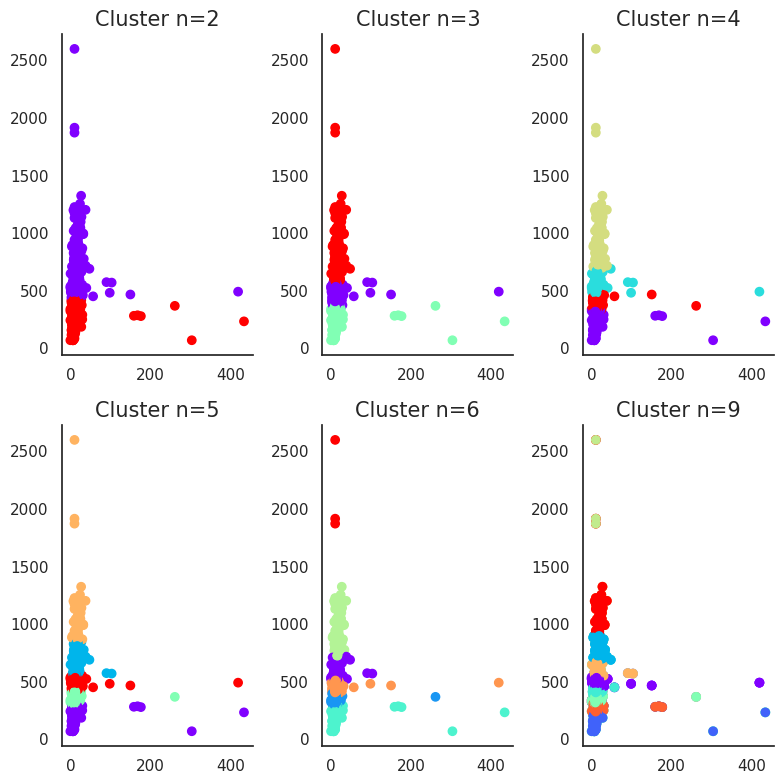

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer

def kmeans_labels(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters).fit(X)
    return kmeans.labels_

# Suponiendo que X contiene tus datos
# Crear un imputador simple
imputer = SimpleImputer(strategy='mean')

# Imputar los valores faltantes en los datos X
X_imputed = imputer.fit_transform(X)

# Ahora puedes continuar con tu código existente
fig, axes = plt.subplots(2, 3, figsize=(8, 8))
sns.despine()

axes[0,0].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 2), cmap='rainbow')
axes[0,0].set_title("Cluster n=2", fontsize=15)

axes[0,1].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 3), cmap='rainbow')
axes[0,1].set_title("Cluster n=3", fontsize=15)

axes[0,2].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 4), cmap='rainbow')
axes[0,2].set_title("Cluster n=4", fontsize=15)

axes[1,0].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 5), cmap='rainbow')
axes[1,0].set_title("Cluster n=5", fontsize=15)

axes[1,1].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 6), cmap='rainbow')
axes[1,1].set_title("Cluster n=6", fontsize=15)

axes[1,2].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 7), cmap='rainbow')
axes[1,2].set_title("Cluster n=7", fontsize=15)

axes[1,2].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 8), cmap='rainbow')
axes[1,2].set_title("Cluster n=8", fontsize=15)

axes[1,2].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, 9), cmap='rainbow')
axes[1,2].set_title("Cluster n=9", fontsize=15)


plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

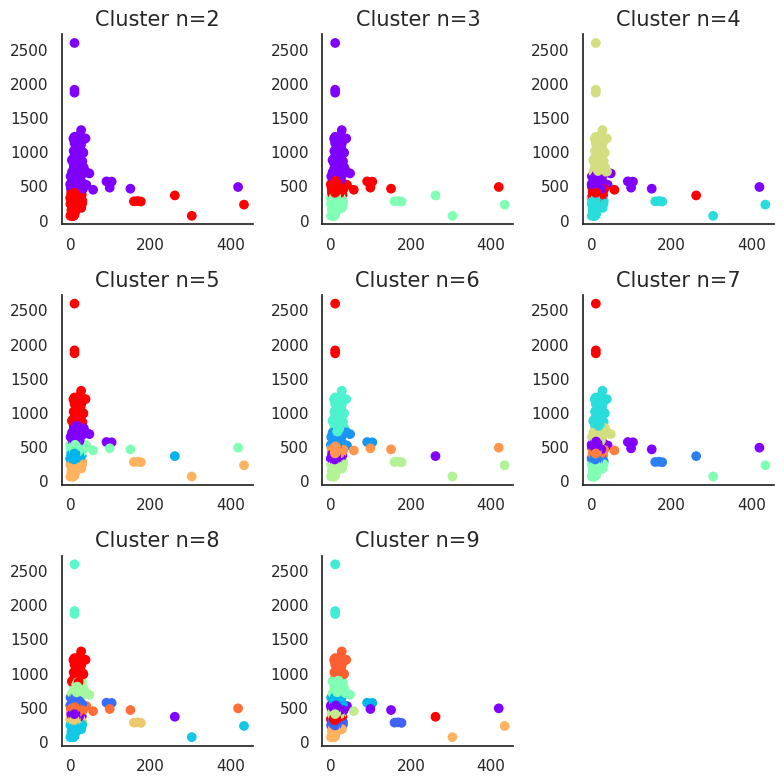

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer

def kmeans_labels(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters).fit(X)
    return kmeans.labels_

# Suponiendo que X contiene tus datos
# Crear un imputador simple
imputer = SimpleImputer(strategy='mean')

# Imputar los valores faltantes en los datos X
X_imputed = imputer.fit_transform(X)

# Ahora puedes continuar con tu código existente
fig, axes = plt.subplots(3, 3, figsize=(8, 8))  # Ajusta el tamaño de la figura según tus necesidades
sns.despine()

# Diccionario para mapear los índices de los gráficos a los números de clusters
cluster_map = {0: 2, 1: 3, 2: 4, 3: 5, 4: 6, 5: 7, 6: 8, 7: 9}

for i in range(3):
    for j in range(3):
        idx = i * 3 + j  # Índice del gráfico actual
        n_clusters = cluster_map.get(idx, None)  # Obtener el número de clusters correspondiente
        if n_clusters is not None:
            axes[i, j].scatter(X_imputed[:,0], X_imputed[:,1], c=kmeans_labels(X_imputed, n_clusters), cmap='rainbow')
            axes[i, j].set_title(f"Cluster n={n_clusters}", fontsize=15)
        else:
            # Eliminar los subgráficos no deseados
            fig.delaxes(axes[i, j])

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

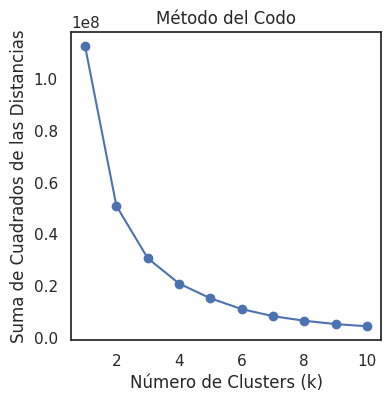

In [ ]:
#METODO DEL CODO: GRUPO OPTIMO DE CLUSTERS
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer

# Suponiendo que X contiene tus datos
# Crear un imputador simple
imputer = SimpleImputer(strategy='mean')

# Imputar los valores faltantes en los datos X
X_imputed = imputer.fit_transform(X)

# Calcular la suma de cuadrados de las distancias para diferentes valores de k
sse = []
k_range = range(1, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X_imputed)
    sse.append(kmeans.inertia_)

# Graficar la suma de cuadrados de las distancias en función de k
plt.figure(figsize=(4, 4))  # Define el tamaño de la figura
plt.plot(k_range, sse, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Suma de Cuadrados de las Distancias')
plt.title('Método del Codo')
plt.show()


# # AGRUPAMIENTO BASADO EN DBSCAN

Agrupamiento Basado en DBSCAN:  El algoritmo ve los clústeres como áreas de alta densidad separadas por zonas de baja densidad. Debido a esta visión bastante genérica, los clústeres encontrados por DBSCAN puede ser cualquier forma, a diferencia de k-medias que asume que los racimos tienen forma convexa.

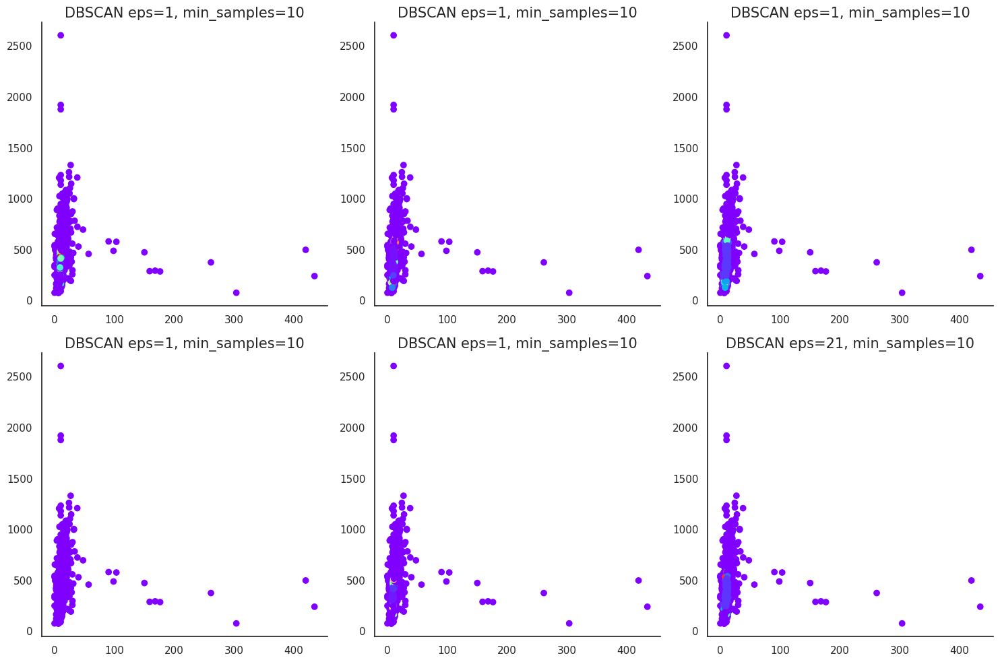

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.impute import SimpleImputer

def dbscan_labels(X, eps, min_samples):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    return dbscan.labels_

# Suponiendo que X contiene tus datos
# Crear un imputador simple
imputer = SimpleImputer(strategy='mean')

# Imputar los valores faltantes en los datos X
X_imputed = imputer.fit_transform(X)

# Ahora puedes continuar con tu código existente
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
sns.despine()

axes[0,0].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=0.5, min_samples=5), cmap='rainbow')
axes[0,0].set_title("DBSCAN eps=1, min_samples=10", fontsize=15)

axes[0,1].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=1.0, min_samples=5), cmap='rainbow')
axes[0,1].set_title("DBSCAN eps=1, min_samples=10", fontsize=15)

axes[0,2].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=1.5, min_samples=5), cmap='rainbow')
axes[0,2].set_title("DBSCAN eps=1, min_samples=10", fontsize=15)

axes[1,0].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=0.5, min_samples=10), cmap='rainbow')
axes[1,0].set_title("DBSCAN eps=1, min_samples=10", fontsize=15)

axes[1,1].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=1.0, min_samples=10), cmap='rainbow')
axes[1,1].set_title("DBSCAN eps=1, min_samples=10", fontsize=15)

axes[1,2].scatter(X_imputed[:,0], X_imputed[:,1], c=dbscan_labels(X_imputed, eps=1.5, min_samples=10), cmap='rainbow')
axes[1,2].set_title("DBSCAN eps=21, min_samples=10", fontsize=15)

plt.tight_layout()
plt.show()


# AGRUPAMIENTOs generales que no me dieron

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



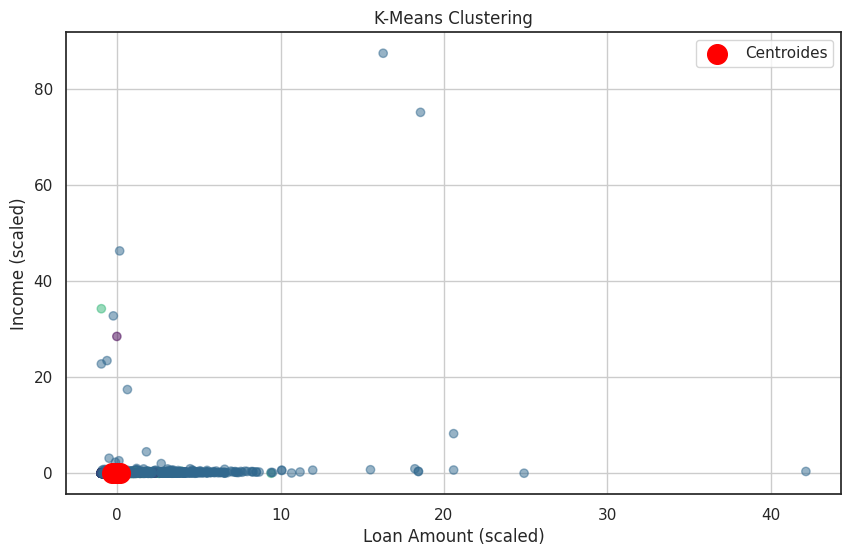

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Realizar un muestreo aleatorio de 20,000 líneas
subset_data = homeMortgage.sample(n=20000, random_state=42)

# Seleccionar las columnas relevantes
variables_of_interest = ['loan_amount', 'income', 'interest_rate', 'loan_purpose', 'loan_type'
                        ]
subset_data = subset_data[variables_of_interest]

# Codificar las variables categóricas
subset_data_encoded = pd.get_dummies(subset_data, columns=['loan_purpose', 'loan_type'
                        ])

# Imputar valores faltantes
imputer = SimpleImputer(strategy='mean')
subset_data_imputed = pd.DataFrame(imputer.fit_transform(subset_data_encoded), columns=subset_data_encoded.columns)

# Estandarizar los datos
scaler = StandardScaler()
subset_data_scaled = scaler.fit_transform(subset_data_imputed)

# Aplicar el algoritmo de agrupamiento K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(subset_data_scaled)

# Agregar las etiquetas de los clusters al DataFrame original
subset_data['cluster'] = kmeans.labels_

import matplotlib.pyplot as plt

# Crear un gráfico de dispersión de los datos de loan_amount e income
plt.figure(figsize=(10, 6))
plt.scatter(subset_data_scaled[:, 0], subset_data_scaled[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='o', s=200, c='red', label='Centroides')
plt.title('K-Means Clustering')
plt.xlabel('Loan Amount (scaled)')
plt.ylabel('Income (scaled)')
plt.legend()
plt.grid(True)
plt.show()



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-144-dc9893efa961>:43: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



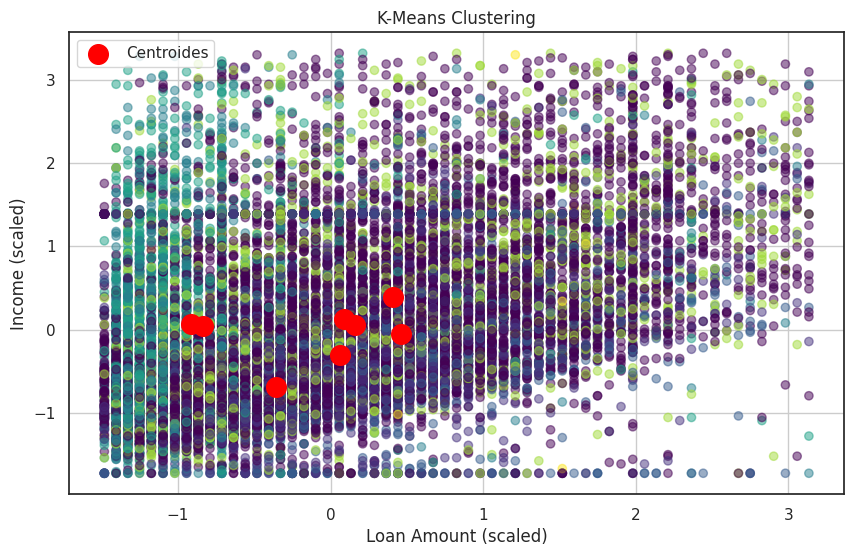

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer


# Codificar las variables categóricas
subset_data_encoded = pd.get_dummies(subset_data, columns=['loan_purpose', 'loan_type'])

# Imputar valores faltantes
imputer = SimpleImputer(strategy='mean')
subset_data_imputed = pd.DataFrame(imputer.fit_transform(subset_data_encoded), columns=subset_data_encoded.columns)

# Depurar outliers de income y loan_amount usando el rango intercuartílico (IQR)
Q1_income = subset_data_imputed['income'].quantile(0.25)
Q3_income = subset_data_imputed['income'].quantile(0.75)
IQR_income = Q3_income - Q1_income
lower_bound_income = Q1_income - 1.5 * IQR_income
upper_bound_income = Q3_income + 1.5 * IQR_income

Q1_loan_amount = subset_data_imputed['loan_amount'].quantile(0.25)
Q3_loan_amount = subset_data_imputed['loan_amount'].quantile(0.75)
IQR_loan_amount = Q3_loan_amount - Q1_loan_amount
lower_bound_loan_amount = Q1_loan_amount - 1.5 * IQR_loan_amount
upper_bound_loan_amount = Q3_loan_amount + 1.5 * IQR_loan_amount

subset_data_filtered = subset_data_imputed[
    (subset_data_imputed['income'] >= lower_bound_income) &
    (subset_data_imputed['income'] <= upper_bound_income) &
    (subset_data_imputed['loan_amount'] >= lower_bound_loan_amount) &
    (subset_data_imputed['loan_amount'] <= upper_bound_loan_amount)
]

# Estandarizar los datos
scaler = StandardScaler()
subset_data_scaled = scaler.fit_transform(subset_data_filtered)

# Aplicar el algoritmo de agrupamiento K-Means
kmeans = KMeans(n_clusters=8, max_iter=1000, random_state=42)
kmeans.fit(subset_data_scaled)

# Agregar las etiquetas de los clusters al DataFrame original
subset_data_filtered['cluster'] = kmeans.labels_

import matplotlib.pyplot as plt

# Crear un gráfico de dispersión de los datos de loan_amount e income
plt.figure(figsize=(10, 6))
plt.scatter(subset_data_scaled[:, 0], subset_data_scaled[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='o', s=200, c='red', label='Centroides')
plt.title('K-Means Clustering')
plt.xlabel('Loan Amount (scaled)')
plt.ylabel('Income (scaled)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA

# Codificar las variables categóricas
subset_data_encoded = pd.get_dummies(subset_data, columns=['loan_purpose', 'loan_type'])

# Imputar valores faltantes
imputer = SimpleImputer(strategy='mean')
subset_data_imputed = pd.DataFrame(imputer.fit_transform(subset_data_encoded), columns=subset_data_encoded.columns)

# Depurar outliers de income y loan_amount usando el rango intercuartílico (IQR)
Q1_income = subset_data_imputed['income'].quantile(0.25)
Q3_income = subset_data_imputed['income'].quantile(0.75)
IQR_income = Q3_income - Q1_income
lower_bound_income = Q1_income - 1.5 * IQR_income
upper_bound_income = Q3_income + 1.5 * IQR_income

Q1_loan_amount = subset_data_imputed['loan_amount'].quantile(0.25)
Q3_loan_amount = subset_data_imputed['loan_amount'].quantile(0.75)
IQR_loan_amount = Q3_loan_amount - Q1_loan_amount
lower_bound_loan_amount = Q1_loan_amount - 1.5 * IQR_loan_amount
upper_bound_loan_amount = Q3_loan_amount + 1.5 * IQR_loan_amount

subset_data_filtered = subset_data_imputed[
    (subset_data_imputed['income'] >= lower_bound_income) &
    (subset_data_imputed['income'] <= upper_bound_income) &
    (subset_data_imputed['loan_amount'] >= lower_bound_loan_amount) &
    (subset_data_imputed['loan_amount'] <= upper_bound_loan_amount)
]

# Estandarizar los datos
scaler = StandardScaler()
subset_data_scaled = scaler.fit_transform(subset_data_filtered)

# Aplicar PCA a los datos escalados
pca = PCA(n_components=2)
subset_data_pca = pca.fit_transform(subset_data_scaled)

# Aplicar el algoritmo de agrupamiento K-Means a los datos reducidos por PCA
kmeans_pca = KMeans(n_clusters=8, max_iter=1000, random_state=42)
kmeans_pca.fit(subset_data_pca)

# Agregar las etiquetas de los clusters al DataFrame original
subset_data_filtered = subset_data_filtered.copy()
subset_data_filtered['cluster'] = kmeans_pca.labels_

# Crear un gráfico de dispersión de los datos reducidos por PCA y los clusters identificados por K-Means
plt.figure(figsize=(10, 6))
plt


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



<module 'matplotlib.pyplot' from '/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py'>

<Figure size 1000x600 with 0 Axes>

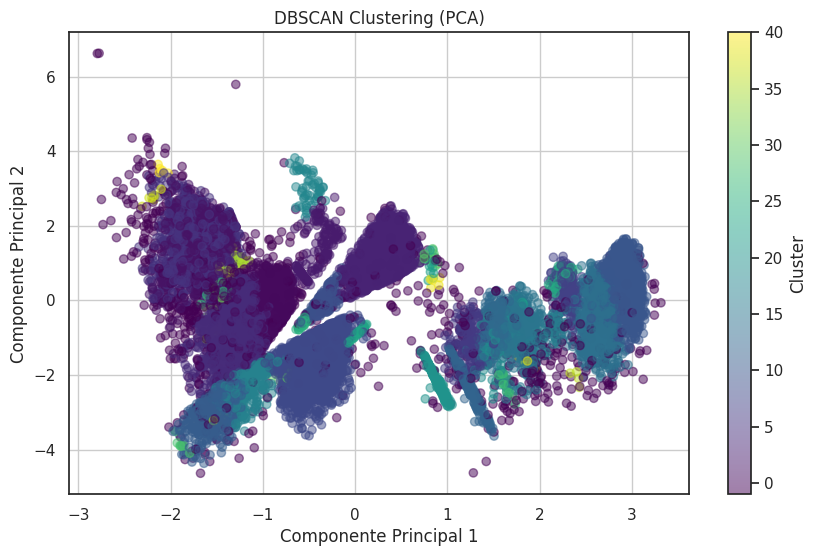

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Estandarizar los datos
scaler = StandardScaler()
subset_data_scaled = scaler.fit_transform(subset_data_filtered)

# Aplicar DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Puedes ajustar estos parámetros según tus necesidades
dbscan.fit(subset_data_scaled)

# Agregar las etiquetas de los clusters al DataFrame original
subset_data_filtered['cluster'] = dbscan.labels_

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reducción de dimensionalidad con PCA a 2 dimensiones
pca = PCA(n_components=2)
subset_data_pca = pca.fit_transform(subset_data_scaled)

# Visualización de los resultados
plt.figure(figsize=(10, 6))
plt.scatter(subset_data_pca[:, 0], subset_data_pca[:, 1], c=subset_data_filtered['cluster'], cmap='viridis', alpha=0.5)
plt.title('DBSCAN Clustering (PCA)')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()



METODO DEL CODO: Numero optimo de clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

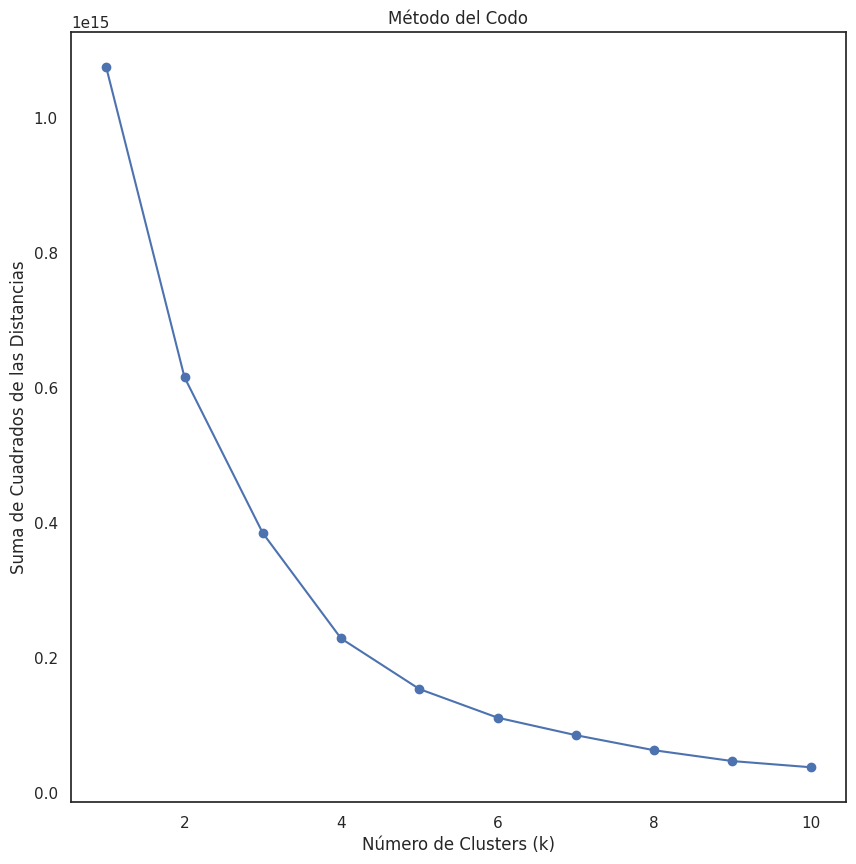

In [ ]:
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Crear un imputador para reemplazar los valores faltantes con la media
imputer = SimpleImputer(strategy='mean')

# Imputar valores faltantes en subset_data_encoded
subset_data_imputed = imputer.fit_transform(subset_data_encoded)

# Lista para almacenar los valores de la suma de cuadrados de las distancias
sse = []

# Rango de valores de k que queremos probar
k_range = range(1, 11)

# Calcular la suma de cuadrados de las distancias para diferentes valores de k
for k in k_range:
    # Crear una instancia de KMeans con el número actual de clusters (k)
    kmeans = KMeans(n_clusters=k)

    # Ajustar el modelo KMeans a tus datos imputados
    kmeans.fit(subset_data_imputed)

    # Calcular la suma de cuadrados de las distancias (inertia_) y agregarla a la lista sse
    sse.append(kmeans.inertia_)

# Graficar los valores en un gráfico
plt.plot(k_range, sse, marker='o')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Suma de Cuadrados de las Distancias')
plt.title('Método del Codo')
plt.show()




# DISPERSION Y CLUSTERS PARA LA BASE COMPLETA CON 'loan_amount', 'income', 'interest_rate', 'total_loan_costs', 'property_value'

Matriz de gráficos de dispersión que muestra las relaciones entre pares de variables en un conjunto de datos

<ipython-input-148-e3c424a1d265>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



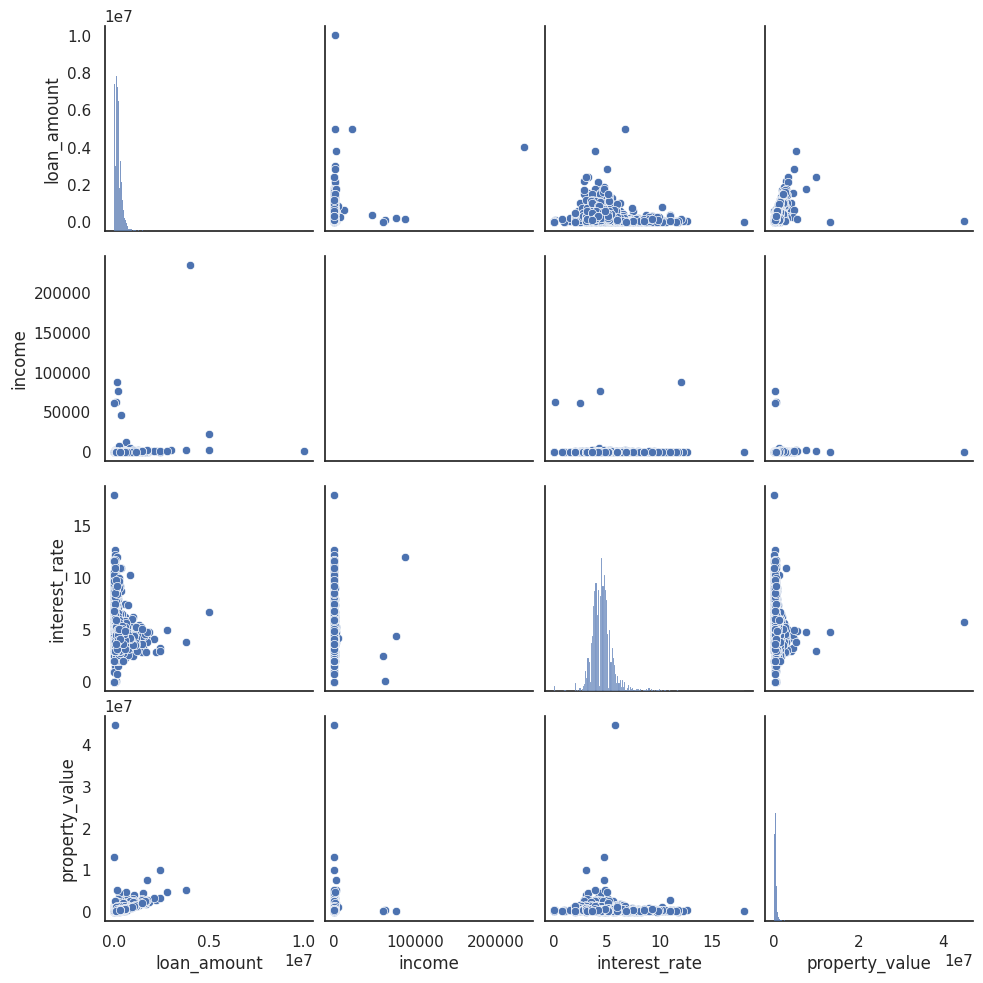

In [ ]:
import seaborn as sns

# Seleccionar un subconjunto de variables para el pairplot
variables_of_interest4 = ['loan_amount', 'income', 'interest_rate','property_value']

# Filtrar el DataFrame para incluir solo las variables de interés
subset_data4 = homeMortgage[variables_of_interest4]


# Tomar una muestra aleatoria de 100 mil filas
subset_data4_sample = subset_data4.sample(n=10000, random_state=42)

# Eliminar las filas con valores nulos para evitar errores en la visualización
subset_data4.dropna(inplace=True)

# Crear el pairplot con la muestra aleatoria
sns.pairplot(subset_data4_sample)
plt.show()


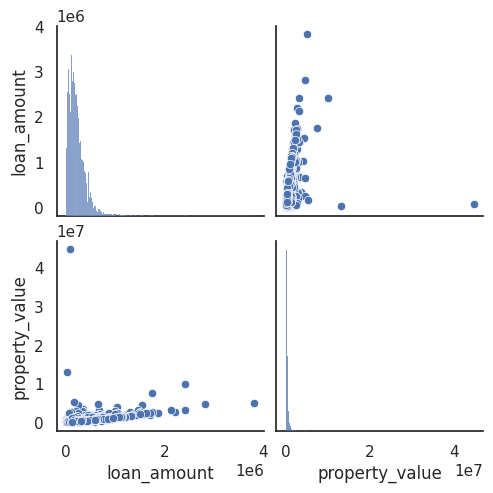

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar un subconjunto de variables para el pairplot
variables_of_interest4 = ['loan_amount', 'property_value']

# Filtrar el DataFrame para incluir solo las variables de interés
subset_data4 = homeMortgage[variables_of_interest4]

# Tomar una muestra aleatoria de 100 mil filas
subset_data4_sample = subset_data4.sample(n=10000, random_state=42)

# Eliminar las filas con valores nulos de la muestra aleatoria
subset_data4_sample.dropna(inplace=True)

# Crear el pairplot con la muestra aleatoria
sns.pairplot(subset_data4_sample)
plt.show()


<Figure size 1000x1000 with 0 Axes>

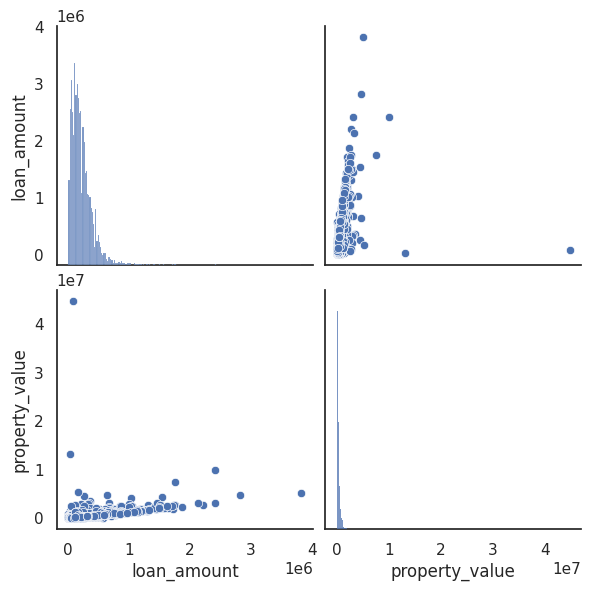

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar un subconjunto de variables para el pairplot
variables_of_interest4 = ['loan_amount', 'property_value']

# Filtrar el DataFrame para incluir solo las variables de interés
subset_data4 = homeMortgage[variables_of_interest4]

# Tomar una muestra aleatoria de 100 mil filas
subset_data4_sample = subset_data4.sample(n=10000, random_state=42)

# Eliminar las filas con valores nulos de la muestra aleatoria
subset_data4_sample.dropna(inplace=True)

# Ajustar el tamaño de la figura
plt.figure(figsize=(10, 10))

# Crear el pairplot con la muestra aleatoria
sns.pairplot(subset_data4_sample, height=3, aspect=1)
plt.show()


# PRUEBA DE HIPOTESIS PARA VARIABLE CATEGORIA ACTION_TAKEN3

In [ ]:
#Prueba CHI CUADRADO
import pandas as pd
from scipy.stats import chi2_contingency

# Variables de interés
variables = ['applicant_race_1', 'applicant_ethnicity_1', 'applicant_sex']

for variable in variables:
    # Crear una tabla de contingencia para la variable y estado de aprobación
    contingency_table = pd.crosstab(homeMortgage[variable], homeMortgage['action_taken3'])

    # Realizar una prueba chi-cuadrado para la variable y estado de aprobación
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Imprimir los resultados
    print(f"Prueba chi-cuadrado para {variable}: Chi2 = {chi2}, p-valor = {p}")


Prueba chi-cuadrado para applicant_race_1: Chi2 = 11782.879728578482, p-valor = 0.0
Prueba chi-cuadrado para applicant_ethnicity_1: Chi2 = 4315.251430399618, p-valor = 0.0
Prueba chi-cuadrado para applicant_sex: Chi2 = 666.6042717146339, p-valor = 1.7730524810937088e-145


Para applicant_race_1, el valor p es cercano a 0.0, lo que sugiere que existe una fuerte asociación entre la raza y el estado de aprobación.

Para applicant_ethnicity_1, también se observa un valor p cercano a 0.0, indicando una fuerte asociación entre la etnia y el estado de aprobación.

En el caso de applicant_sex, el valor p es extremadamente cercano a 0.0, lo que indica una fuerte asociación entre el sexo y el estado de aprobación.

Estos resultados sugieren que las variables raza, etnia y sexo tienen un impacto significativo en el estado de aprobación de préstamos en tu conjunto de datos. Puedes explorar más a fondo estas asociaciones y considerar cómo influyen en tus análisis y decisiones.





